# Stock Market Prediction of NiftyIT companies using Machine Learning Techniques 

### The 10 Nifty IT companies are --

1. Wipro
2. HCL Tech
3. Infosys
4. Tech Mahindra
5. Coforge
6. LTTS
7. LTIM
8. TCS
9. Mphasis
10. Persistent

## Wipro

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
data=pd.read_csv("WIPRO.NS.csv")
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2008-01-01,119.036255,119.036255,115.875008,116.100006,99.556625,1491382.0
1,2008-01-02,116.550003,116.662506,112.983757,115.053757,98.659454,2493253.0
2,2008-01-03,115.053757,115.053757,111.150002,111.645004,95.736443,3650897.0
3,2008-01-04,110.250008,112.927505,109.125008,111.746254,95.823273,4050933.0
4,2008-01-07,110.475006,111.150002,108.000008,108.551254,93.083527,3127475.0
...,...,...,...,...,...,...,...
4065,2024-06-24,490.100006,494.899994,489.450012,490.549988,490.549988,4967259.0
4066,2024-06-25,490.549988,498.000000,489.299988,496.850006,496.850006,4629105.0
4067,2024-06-26,496.850006,499.899994,493.799988,495.200012,495.200012,6406045.0
4068,2024-06-27,492.149994,511.950012,489.200012,510.799988,510.799988,21068569.0


In [3]:
data.shape

(4070, 7)

In [4]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,4063.000000,4063.000000,4063.000000,4063.000000,4063.000000,4.063000e+03
mean,245.380457,248.245040,242.247784,245.174056,235.953706,5.765107e+06
std,137.854103,138.979688,136.375567,137.554026,140.554513,6.021020e+06
min,45.292503,46.113750,40.590000,45.202503,39.085415,0.000000e+00
25%,155.625031,157.715645,153.768784,155.660644,138.530281,2.980048e+06
50%,206.325058,208.800049,204.150055,206.643799,196.647278,4.377852e+06
75%,280.250000,283.375000,277.256317,279.993820,274.867294,6.536317e+06
max,722.750000,739.849976,716.000000,721.500000,711.108154,1.303676e+08


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4070 entries, 0 to 4069
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       4070 non-null   object 
 1   Open       4063 non-null   float64
 2   High       4063 non-null   float64
 3   Low        4063 non-null   float64
 4   Close      4063 non-null   float64
 5   Adj Close  4063 non-null   float64
 6   Volume     4063 non-null   float64
dtypes: float64(6), object(1)
memory usage: 222.7+ KB


In [6]:
data.isnull().sum()

Date         0
Open         7
High         7
Low          7
Close        7
Adj Close    7
Volume       7
dtype: int64

In [7]:
data=data.dropna()

In [8]:
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [9]:
df=data.drop(columns=['Date'])
df

,Open,High,Low,Close,Adj Close,Volume
0,119.036255,119.036255,115.875008,116.100006,99.556625,1491382.0
1,116.550003,116.662506,112.983757,115.053757,98.659454,2493253.0
2,115.053757,115.053757,111.150002,111.645004,95.736443,3650897.0
3,110.250008,112.927505,109.125008,111.746254,95.823273,4050933.0
4,110.475006,111.150002,108.000008,108.551254,93.083527,3127475.0
...,...,...,...,...,...,...
4065,490.100006,494.899994,489.450012,490.549988,490.549988,4967259.0
4066,490.549988,498.000000,489.299988,496.850006,496.850006,4629105.0
4067,496.850006,499.899994,493.799988,495.200012,495.200012,6406045.0
4068,492.149994,511.950012,489.200012,510.799988,510.799988,21068569.0


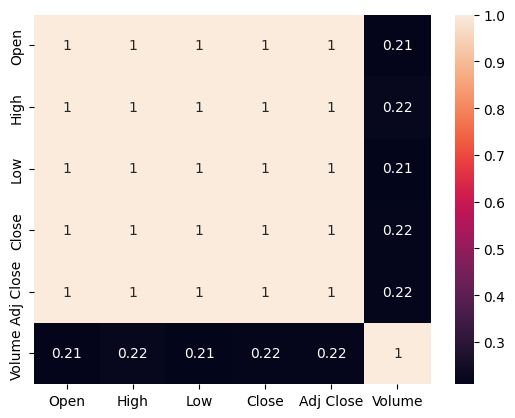

In [10]:
sns.heatmap(df.corr(),annot=True)
plt.show()

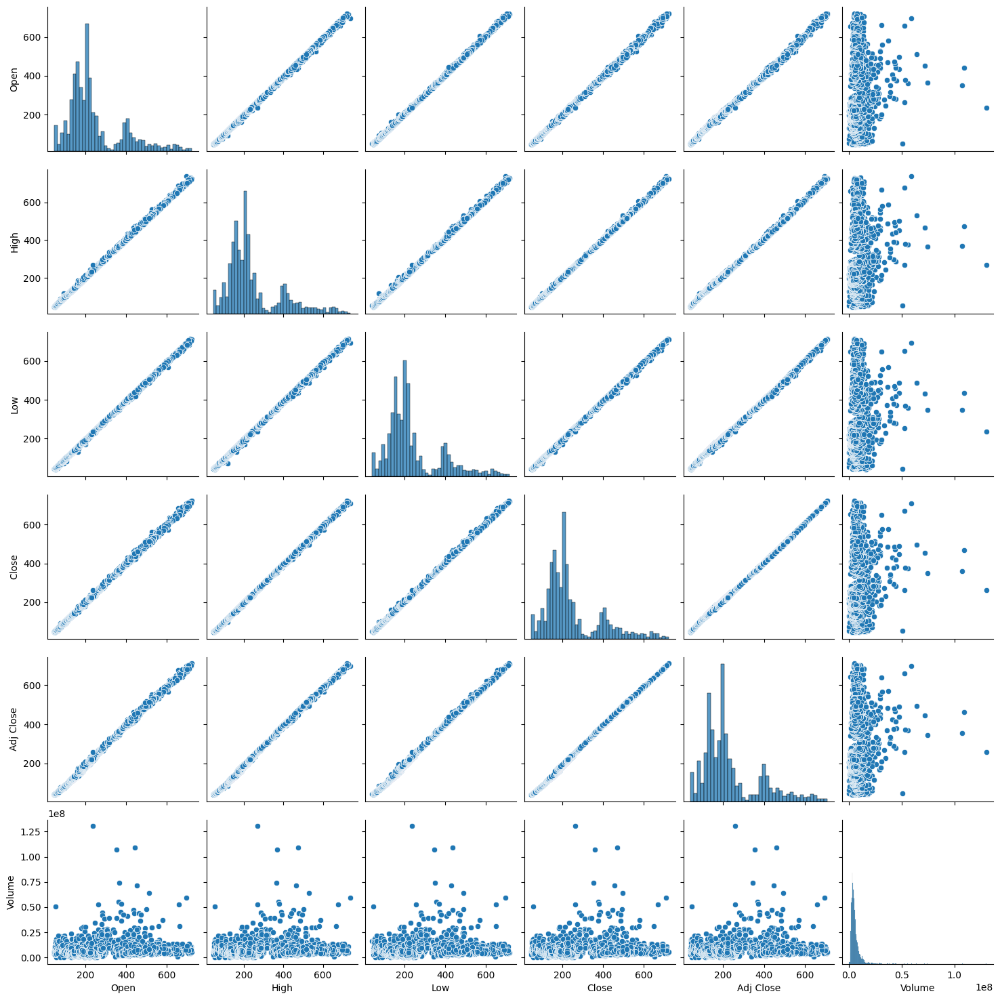

In [11]:
sns.pairplot(df,kind='scatter')
plt.show()

## Simple Linear Regression

### Taking Open as independent feature and close as dependent fearture

<function matplotlib.pyplot.show(close=None, block=None)>

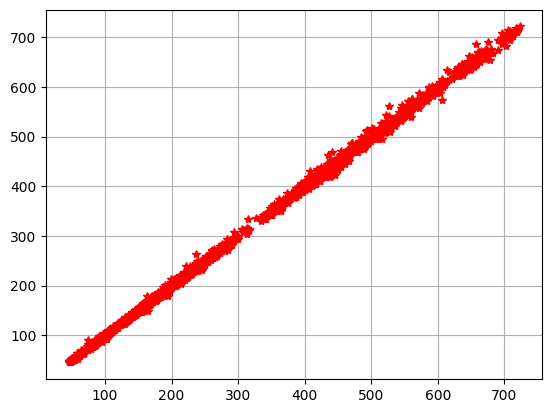

In [12]:
plt.plot(df['Open'],df['Close'],'r*')
plt.grid(True)
plt.show

In [13]:
X=df[['Open']]
X

,Open
0,119.036255
1,116.550003
2,115.053757
3,110.250008
4,110.475006
...,...
4065,490.100006
4066,490.549988
4067,496.850006
4068,492.149994


In [14]:
y=df['Close']
y

0       116.100006
1       115.053757
2       111.645004
3       111.746254
4       108.551254
           ...    
4065    490.549988
4066    496.850006
4067    495.200012
4068    510.799988
4069    514.849976
Name: Close, Length: 4063, dtype: float64

In [15]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [16]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()

In [17]:
lr.fit(X_train,y_train)

LinearRegression()

In [18]:
print(f"Coefficient : {lr.coef_}\nintercept : {lr.intercept_}")

Coefficient : [0.99754489]
intercept : 0.4063830052777746


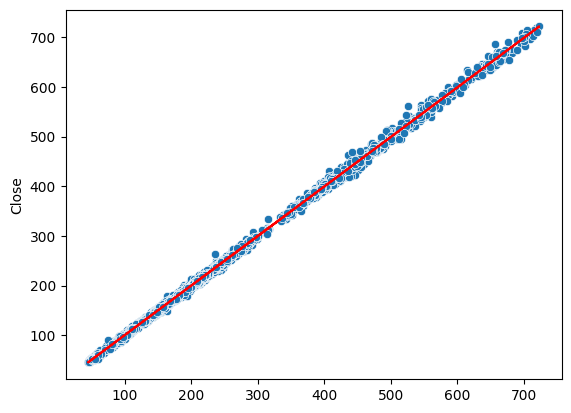

In [19]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),color='red')
plt.show()

In [20]:
pred=lr.predict(X_test)

In [21]:
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

In [22]:
import math
def find_RMSE(pred,actual):
    return math.sqrt(mean_squared_error(actual,pred))

def find_adj_r2(pred,actual):
    return 1-((1-r2_score(pred,actual))*(len(actual)-1)/(len(actual)-X_train.shape[1]-1))

In [23]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 2.7039099471991337
MSE : 14.850351566653277
RMSE : 3.853615389040956
R2 : 0.9992074346445047
Adj R2 : 0.9992072063403782


In [24]:
lr_mae=mean_absolute_error(y_test,pred)
lr_rmse=find_RMSE(pred,y_test)
lr_r2=r2_score(y_test,pred)

In [25]:
dt={
    'Companies' : ['Wipro'],
    'Simple_LinearReg' : [mean_absolute_error(y_test,pred)]}
mean_abs_err=pd.DataFrame(dt)
mean_abs_err

,Companies,Simple_LinearReg
0,Wipro,2.70391


In [26]:
dt={
    'Companies' : ['Wipro'],
    'Simple_LinearReg' : [find_RMSE(pred,y_test)]
}
root_mean_sq_err=pd.DataFrame(dt)
root_mean_sq_err

,Companies,Simple_LinearReg
0,Wipro,3.853615


In [27]:
dt={
    'Companies' : ['Wipro'],
    'Simple_LinearReg' : [r2_score(y_test,pred)]
}
R2_score=pd.DataFrame(dt)
R2_score

,Companies,Simple_LinearReg
0,Wipro,0.999207


## Ridge Regression

In [28]:
from sklearn.linear_model import Ridge

In [29]:
alph=[0.1,0.5,1,5,10]
for i in alph:
    rid=Ridge(alpha=i)
    rid.fit(X_train,y_train)
    y_pred=rid.predict(X_test)
    print(f"alpha = {i}, MSE = {mean_squared_error(y_test,y_pred)}, R2 = {r2_score(y_test,y_pred)}")

alpha = 0.1, MSE = 14.850351515056886, R2 = 0.9992074346472584
alpha = 0.5, MSE = 14.85035130867219, R2 = 0.9992074346582732
alpha = 1, MSE = 14.850351050693545, R2 = 0.9992074346720415
alpha = 5, MSE = 14.850348986952998, R2 = 0.9992074347821837
alpha = 10, MSE = 14.850346407498785, R2 = 0.9992074349198495


For alpha = 0.1 MSE is minimum and R2 value is maximum

In [30]:
rr=Ridge(alpha=0.1)

In [31]:
rr.fit(X_train,y_train)

Ridge(alpha=0.1)

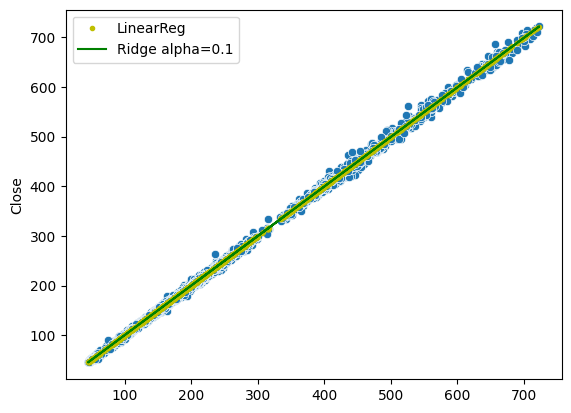

In [32]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'y.',label='LinearReg')
plt.plot(X_val,rr.predict(X_train),color='green',label='Ridge alpha=0.1')
plt.legend()
plt.show()

In [33]:
print(rr.coef_,rr.intercept_)

[0.99754489] 0.4063834030651492


In [34]:
y_pred=rr.predict(X_test)

In [35]:
print(f"MAE : {mean_absolute_error(y_test,y_pred)}\nMSE : {mean_squared_error(y_test,y_pred)}\nRMSE : {find_RMSE(y_pred,y_test)}\nR2 : {r2_score(y_test,y_pred)}\nAdj R2 : {find_adj_r2(y_pred,y_test)}")

MAE : 2.7039099462537886
MSE : 14.850351515056886
RMSE : 3.8536153823464123
R2 : 0.9992074346472584
Adj R2 : 0.9992072063405688


In [36]:
rr_mae=mean_absolute_error(y_test,y_pred)
rr_rmse=find_RMSE(y_pred,y_test)
rr_r2=r2_score(y_test,y_pred)

In [37]:
mean_abs_err['Ridge_alpha_0.1']=[mean_absolute_error(y_test,y_pred)]
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1
0,Wipro,2.70391,2.70391


In [38]:
root_mean_sq_err['Ridge_alpha_0.1']=[find_RMSE(y_pred,y_test)]
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1
0,Wipro,3.853615,3.853615


In [39]:
R2_score['Ridge_alpha_0.1']=[r2_score(y_test,y_pred)]
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1
0,Wipro,0.999207,0.999207


## Lasso Regression

In [40]:
from sklearn.linear_model import Lasso

In [41]:
alph=[0.1,0.5,1,5,10]
for i in alph:
    ls=Lasso(alpha=i)
    ls.fit(X_train,y_train)
    y_pred=ls.predict(X_test)
    print(f"alpha = {i}, MSE = {mean_squared_error(y_test,y_pred)}, R2 = {r2_score(y_test,y_pred)}")

alpha = 0.1, MSE = 14.850183986959367, R2 = 0.9992074435882565
alpha = 0.5, MSE = 14.849524098780591, R2 = 0.9992074788065817
alpha = 1, MSE = 14.848722707400121, R2 = 0.9992075215769526
alpha = 5, MSE = 14.843250330076103, R2 = 0.9992078136385014
alpha = 10, MSE = 14.838756742720577, R2 = 0.9992080534618917


For alpha 0.1 we are getting the best result

In [42]:
lsr=Lasso(alpha=0.1)

In [43]:
lsr.fit(X_train,y_train)

Lasso(alpha=0.1)

In [44]:
print(lsr.coef_,lsr.intercept_)

[0.99753964] 0.40767899663416074


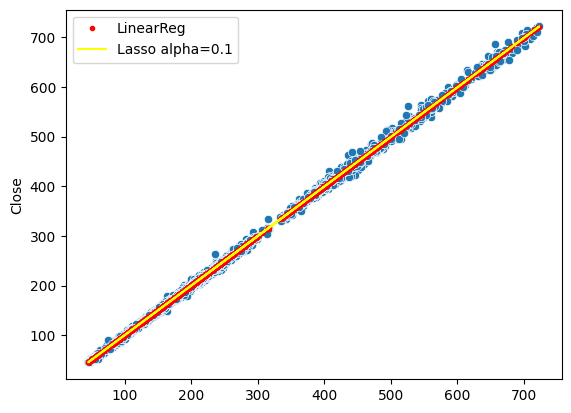

In [45]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'r.',label='LinearReg')
plt.plot(X_val,lsr.predict(X_train),color='yellow',label='Lasso alpha=0.1')
plt.legend()
plt.show()

In [46]:
yl_pred=lsr.predict(X_test)

In [47]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 2.703906867260842
MSE : 14.850183986959367
RMSE : 3.853593645801198
R2 : 0.9992074435882565
Adj R2 : 0.9992072069339235


In [48]:
lsr_mae=mean_absolute_error(y_test,yl_pred)
lsr_rmse=find_RMSE(yl_pred,y_test)
lsr_r2=r2_score(y_test,yl_pred)

In [49]:
mean_abs_err['Lasso_alpha_0.1']=[mean_absolute_error(y_test,yl_pred)]
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1
0,Wipro,2.70391,2.70391,2.703907


In [50]:
root_mean_sq_err['Lasso_alpha_0.1']=[find_RMSE(yl_pred,y_test)]
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1
0,Wipro,3.853615,3.853615,3.853594


In [51]:
R2_score['Lasso_alpha_0.1']=[r2_score(y_test,yl_pred)]
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1
0,Wipro,0.999207,0.999207,0.999207


## Polynomial Regression

In [52]:
from sklearn.preprocessing import PolynomialFeatures

In [53]:
for i in range(2,20):
    poly=PolynomialFeatures(degree=i)
    X_poly = poly.fit_transform(X_train)
    X_test1=poly.transform(X_test)
    poly.fit(X_poly,y_train)
    lreg=LinearRegression()
    lreg.fit(X_poly,y_train)
    temp=lreg.predict(X_test1)
    print(f"Degree : {i}, R2 score :{r2_score(y_test,temp)}, MSE : {mean_squared_error(y_test,temp)} ")

Degree : 2, R2 score :0.9992092995572738, MSE : 14.815408567858235 
Degree : 3, R2 score :0.9992063833577379, MSE : 14.87004959909416 
Degree : 4, R2 score :0.9992038131320492, MSE : 14.918208094565788 
Degree : 5, R2 score :0.9992032698233282, MSE : 14.928388107430512 
Degree : 6, R2 score :0.9990834499685392, MSE : 17.173460966022773 
Degree : 7, R2 score :0.9976394659374611, MSE : 44.229489051858614 
Degree : 8, R2 score :0.9927057411974464, MSE : 136.67302877297993 
Degree : 9, R2 score :0.9821336233168557, MSE : 334.76352849303885 
Degree : 10, R2 score :0.9628203136285267, MSE : 696.638340202538 
Degree : 11, R2 score :0.9370462986175728, MSE : 1179.5678318123075 
Degree : 12, R2 score :0.913332327919331, MSE : 1623.8981314758921 
Degree : 13, R2 score :0.8943900253101115, MSE : 1978.8213580318236 
Degree : 14, R2 score :0.8779773843672146, MSE : 2286.3461399937437 
Degree : 15, R2 score :0.8611422935008469, MSE : 2601.7863952214966 
Degree : 16, R2 score :0.8419550167123044, MSE

Polynomial of degree 4 has low MSE and high R square value

In [54]:
poly=PolynomialFeatures(degree=4)

In [55]:
X_poly = poly.fit_transform(X_train)
X_test1=poly.transform(X_test)
poly.fit(X_poly,y_train)
lin=LinearRegression()
lin.fit(X_poly,y_train)

LinearRegression()

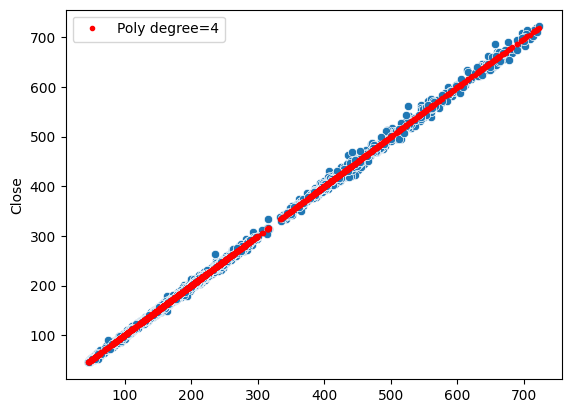

In [56]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'r.',label='Poly degree=4')
plt.legend()
plt.show()

In [57]:
yp_pred=lin.predict(X_test1)

In [58]:
print(f"MAE : {mean_absolute_error(y_test,yp_pred)}\nMSE : {mean_squared_error(y_test,yp_pred)}\nRMSE : {find_RMSE(yp_pred,y_test)}\nR2 : {r2_score(y_test,yp_pred)}\nAdj R2 : {find_adj_r2(yp_pred,y_test)}")

MAE : 2.7147725988026776
MSE : 14.918208094565788
RMSE : 3.862409622834661
R2 : 0.9992038131320492
Adj R2 : 0.9992038145493346


In [59]:
poly_mae=mean_absolute_error(y_test,yp_pred)
poly_rmse=find_RMSE(yp_pred,y_test)
poly_r2=r2_score(y_test,yp_pred)

In [60]:
mean_abs_err['Poly_deg_4']=[mean_absolute_error(y_test,yp_pred)]
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4
0,Wipro,2.70391,2.70391,2.703907,2.714773


In [61]:
root_mean_sq_err['Poly_deg_4']=[find_RMSE(yp_pred,y_test)]
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4
0,Wipro,3.853615,3.853615,3.853594,3.86241


In [62]:
R2_score['Poly_deg_4']=r2_score(y_test,yp_pred)
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4
0,Wipro,0.999207,0.999207,0.999207,0.999204


## Ridge on Polynomial of degree 4

In [63]:
alph=[0.1,0.5,1,5,10]
for i in alph:
    rid=Ridge(alpha=i)
    rid.fit(X_poly,y_train)
    y_pred=rid.predict(X_test1)
    print(f"alpha = {i}, MSE = {mean_squared_error(y_test,y_pred)}, R2 = {r2_score(y_test,y_pred)}")

alpha = 0.1, MSE = 14.91820869446658, R2 = 0.9992038131000324
alpha = 0.5, MSE = 14.918204587401895, R2 = 0.999203813319227
alpha = 1, MSE = 14.918199455363041, R2 = 0.9992038135931246
alpha = 5, MSE = 14.918158470761165, R2 = 0.9992038157804786
alpha = 10, MSE = 14.9181074192393, R2 = 0.9992038185051055


C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=2.18117e-26): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=1.09059e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=2.18117e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=1.09059e-24

alpha = 0.1 is best having low MSE and high R square value

In [64]:
ridp=Ridge(alpha=0.1)
ridp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=2.18117e-26): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Ridge(alpha=0.1)

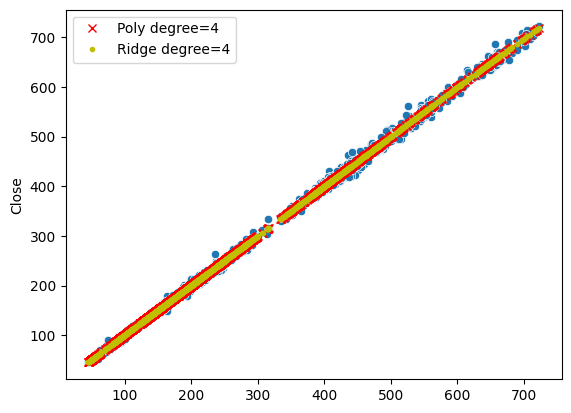

In [65]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'rx',label='Poly degree=4')
plt.plot(X_val,ridp.predict(X_poly),'y.',label='Ridge degree=4')
plt.legend()
plt.show()

In [66]:
yr_pred=ridp.predict(X_test1)

In [67]:
print(f"MAE : {mean_absolute_error(y_test,yr_pred)}\nMSE : {mean_squared_error(y_test,yr_pred)}\nRMSE : {find_RMSE(yr_pred,y_test)}\nR2 : {r2_score(y_test,yr_pred)}\nAdj R2 : {find_adj_r2(yr_pred,y_test)}")

MAE : 2.7147728380533103
MSE : 14.91820869446658
RMSE : 3.862409700493538
R2 : 0.9992038131000324
Adj R2 : 0.9992038145674793


In [68]:
prr_mae=mean_absolute_error(y_test,yr_pred)
prr_rmse=find_RMSE(yr_pred,y_test)
prr_r2=r2_score(y_test,yr_pred)

In [69]:
mean_abs_err['Ridge_0.1_Poly_4']=[mean_absolute_error(y_test,yr_pred)]
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4
0,Wipro,2.70391,2.70391,2.703907,2.714773,2.714773


In [70]:
root_mean_sq_err['Ridge_0.1_Poly_4']=[find_RMSE(yr_pred,y_test)]
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.86241,3.86241


In [71]:
R2_score['Ridge_0.1_Poly_4']=[r2_score(y_test,yr_pred)]
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204


## Lasso on polynomial of degree 4

In [72]:
alph=[0.1,0.5,1,5,10]
for i in alph:
    lsp=Lasso(alpha=i)
    lsp.fit(X_poly,y_train)
    y_pred=lsp.predict(X_test1)
    print(f"alpha = {i}, MSE = {mean_squared_error(y_test,y_pred)}, R2 = {r2_score(y_test,y_pred)}")

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.868e+04, tolerance: 6.160e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.997e+04, tolerance: 6.160e+03
  model = cd_fast.enet_coordinate_descent(
C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase 

alpha = 0.1, MSE = 14.894498550720803, R2 = 0.9992050785137447
alpha = 0.5, MSE = 14.907300014119114, R2 = 0.9992043952978396
alpha = 1, MSE = 14.924701673585078, R2 = 0.999203466568822
alpha = 5, MSE = 15.119896440738767, R2 = 0.9991930489965964
alpha = 10, MSE = 15.50384718465374, R2 = 0.9991725574912959


C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.949e+04, tolerance: 6.160e+03
  model = cd_fast.enet_coordinate_descent(


alpha = 0.1 has low MSE and high R squarre value

In [73]:
lsp=Lasso(alpha=0.1)
lsp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.868e+04, tolerance: 6.160e+03
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.1)

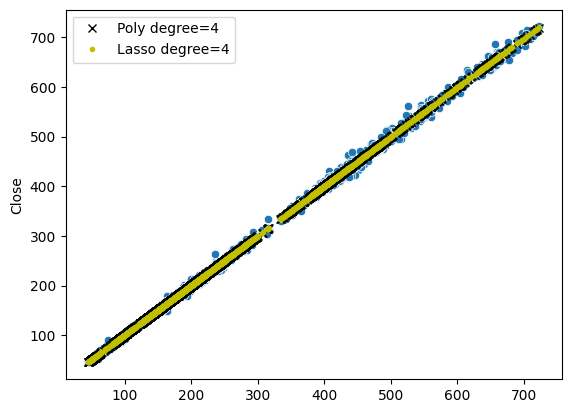

In [74]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'kx',label='Poly degree=4')
plt.plot(X_val,lsp.predict(X_poly),'y.',label='Lasso degree=4')
plt.legend()
plt.show()

In [75]:
yl_pred=lsp.predict(X_test1)

In [76]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 2.7204064068888663
MSE : 14.894498550720803
RMSE : 3.859339133934825
R2 : 0.9992050785137447
Adj R2 : 0.9992049160329532


In [77]:
plsr_mae=mean_absolute_error(y_test,yl_pred)
plsr_rmse=find_RMSE(yl_pred,y_test)
plsr_r2=r2_score(y_test,yl_pred)

In [78]:
mean_abs_err['Lasso_0.1_Poly_4']=[mean_absolute_error(y_test,yl_pred)]
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,2.70391,2.70391,2.703907,2.714773,2.714773,2.720406


In [79]:
root_mean_sq_err['Lasso_0.1_Poly_4']=[find_RMSE(yl_pred,y_test)]
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.86241,3.86241,3.859339


In [80]:
R2_score['Lasso_0.1_Poly_4']=[r2_score(y_test,yl_pred)]
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204,0.999205


## Multiple Linear Regression

In [81]:
df

,Open,High,Low,Close,Adj Close,Volume
0,119.036255,119.036255,115.875008,116.100006,99.556625,1491382.0
1,116.550003,116.662506,112.983757,115.053757,98.659454,2493253.0
2,115.053757,115.053757,111.150002,111.645004,95.736443,3650897.0
3,110.250008,112.927505,109.125008,111.746254,95.823273,4050933.0
4,110.475006,111.150002,108.000008,108.551254,93.083527,3127475.0
...,...,...,...,...,...,...
4065,490.100006,494.899994,489.450012,490.549988,490.549988,4967259.0
4066,490.549988,498.000000,489.299988,496.850006,496.850006,4629105.0
4067,496.850006,499.899994,493.799988,495.200012,495.200012,6406045.0
4068,492.149994,511.950012,489.200012,510.799988,510.799988,21068569.0


as high and low has high corelation with open so to avoid milticolinearity we will drop the columns high and low and try to train our model using two independent feature open and volume

In [82]:
df.drop(columns=['High','Low','Adj Close'],inplace=True)
df

,Open,Close,Volume
0,119.036255,116.100006,1491382.0
1,116.550003,115.053757,2493253.0
2,115.053757,111.645004,3650897.0
3,110.250008,111.746254,4050933.0
4,110.475006,108.551254,3127475.0
...,...,...,...
4065,490.100006,490.549988,4967259.0
4066,490.549988,496.850006,4629105.0
4067,496.850006,495.200012,6406045.0
4068,492.149994,510.799988,21068569.0


In [83]:
X=df.drop(columns=['Close'])
X

,Open,Volume
0,119.036255,1491382.0
1,116.550003,2493253.0
2,115.053757,3650897.0
3,110.250008,4050933.0
4,110.475006,3127475.0
...,...,...
4065,490.100006,4967259.0
4066,490.549988,4629105.0
4067,496.850006,6406045.0
4068,492.149994,21068569.0


In [84]:
y=df['Close']
y

0       116.100006
1       115.053757
2       111.645004
3       111.746254
4       108.551254
           ...    
4065    490.549988
4066    496.850006
4067    495.200012
4068    510.799988
4069    514.849976
Name: Close, Length: 4063, dtype: float64

In [85]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [86]:
mlin=LinearRegression()

In [87]:
mlin.fit(X_train,y_train)

LinearRegression()

In [88]:
cdf=pd.DataFrame(mlin.coef_,X.columns,columns=['coef_lin'])
cdf

,coef_lin
Open,9.963173e-01
Volume,1.254410e-07


In [89]:
mlin.intercept_

-0.025517002394281008

In [90]:
pred=mlin.predict(X_test)

In [91]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 2.730339050649436
MSE : 15.135654963533772
RMSE : 3.890456909353164
R2 : 0.9991922079620146
Adj R2 : 0.9991904756384923


In [92]:
mlr_mae=mean_absolute_error(y_test,pred)
mlr_rmse=find_RMSE(pred,y_test)
mlr_r2=r2_score(y_test,pred)

In [93]:
dt={
    'Companies' : ['Wipro'],
    'Mul_LinearReg' : [mean_absolute_error(y_test,pred)]}
mul_mean_abs_err=pd.DataFrame(dt)
mul_mean_abs_err

,Companies,Mul_LinearReg
0,Wipro,2.730339


In [94]:
dt={
    'Companies' : ['Wipro'],
    'Mul_LinearReg' : [find_RMSE(pred,y_test)]
}
mul_root_mean_sq_err=pd.DataFrame(dt)
mul_root_mean_sq_err

,Companies,Mul_LinearReg
0,Wipro,3.890457


In [95]:
dt={
    'Companies' : ['Wipro'],
    'Mul_LinearReg' : [r2_score(y_test,pred)]
}
mul_R2_score=pd.DataFrame(dt)
mul_R2_score

,Companies,Mul_LinearReg
0,Wipro,0.999192


## Applying Ridge Regression on Multiple Linear Regression

In [96]:
alp=[0.1,0.5,1,5,10]
for i in alp:
    rreg=Ridge(alpha=i)
    rreg.fit(X_train,y_train)
    temp=rreg.predict(X_test)
    print(f"alpha = {i}, MSE = {mean_squared_error(y_test,temp)}, R2 = {r2_score(y_test,temp)}")

alpha = 0.1, MSE = 15.13565496459514, R2 = 0.9991922079619578
alpha = 0.5, MSE = 15.135654968841532, R2 = 0.9991922079617312
alpha = 1, MSE = 15.135654974151795, R2 = 0.9991922079614478
alpha = 5, MSE = 15.135655016726082, R2 = 0.9991922079591756
alpha = 10, MSE = 15.135655070174199, R2 = 0.9991922079563231


In [97]:
ridm=Ridge(alpha=0.1)
ridm.fit(X_train,y_train)

Ridge(alpha=0.1)

In [98]:
cdf['coef_ridge']=ridm.coef_
cdf

,coef_lin,coef_ridge
Open,9.963173e-01,9.963173e-01
Volume,1.254410e-07,1.254410e-07


In [99]:
ridm.intercept_

-0.025516631640158494

In [100]:
pred=ridm.predict(X_test)

In [101]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 2.7303390554298663
MSE : 15.13565496459514
RMSE : 3.8904569094895707
R2 : 0.9991922079619578
Adj R2 : 0.9991904756357899


In [102]:
mrr_mae=mean_absolute_error(y_test,pred)
mrr_rmse=find_RMSE(pred,y_test)
mrr_r2=r2_score(y_test,pred)

In [103]:
mul_mean_abs_err['Mul_Ridge_0.1']=[mean_absolute_error(y_test,pred)]
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1
0,Wipro,2.730339,2.730339


In [104]:
mul_root_mean_sq_err['Mul_Ridge_0.1']=[find_RMSE(pred,y_test)]
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1
0,Wipro,3.890457,3.890457


In [105]:
mul_R2_score['Mul_Ridge_0.1']=[r2_score(y_test,pred)]
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1
0,Wipro,0.999192,0.999192


## Applying Lasso Regression on Multiple Linear Regression

In [106]:
alp=[0.1,0.5,1,5,10]
for i in alp:
    lreg=Lasso(alpha=i)
    lreg.fit(X_train,y_train)
    temp=lreg.predict(X_test)
    print(f"alpha = {i}, MSE = {mean_squared_error(y_test,temp)}, R2 = {r2_score(y_test,temp)}")

alpha = 0.1, MSE = 15.135657034272526, R2 = 0.9991922078514989
alpha = 0.5, MSE = 15.135681954434496, R2 = 0.9991922065215063
alpha = 1, MSE = 15.135737600691675, R2 = 0.9991922035516578
alpha = 5, MSE = 15.137162612937514, R2 = 0.9991921274985535
alpha = 10, MSE = 15.141393483716092, R2 = 0.9991919016963838


In [107]:
lso=Lasso(alpha=0.1)
lso.fit(X_train,y_train)

Lasso(alpha=0.1)

In [108]:
cdf['coef_lasso']=lso.coef_
cdf

,coef_lin,coef_ridge,coef_lasso
Open,9.963173e-01,9.963173e-01,9.963143e-01
Volume,1.254410e-07,1.254410e-07,1.254549e-07


In [109]:
lso.intercept_

-0.02484782184069445

In [110]:
pred=lso.predict(X_test)

In [111]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 2.7303476779181945
MSE : 15.135657034272526
RMSE : 3.8904571754836894
R2 : 0.9991922078514989
Adj R2 : 0.9991904707526724


In [112]:
mlsr_mae=mean_absolute_error(y_test,pred)
mlsr_rmse=find_RMSE(pred,y_test)
mlsr_r2=r2_score(y_test,pred)

In [113]:
mul_mean_abs_err['Mul_Lasso_0.1']=[mean_absolute_error(y_test,pred)]
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,2.730339,2.730339,2.730348


In [114]:
mul_root_mean_sq_err['Mul_Lasso_0.1']=[find_RMSE(pred,y_test)]
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,3.890457,3.890457,3.890457


In [115]:
mul_R2_score['Mul_Lasso_0.1']=[r2_score(y_test,pred)]
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,0.999192,0.999192,0.999192


In [116]:
wipro_mae=pd.DataFrame()
wipro_mae['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
wipro_mae['MAE']=[lr_mae,rr_mae,lsr_mae,poly_mae,prr_mae,plsr_mae,mlr_mae,mrr_mae,mlsr_mae]
wipro_mae

,Models,MAE
0,Simple_LinearReg,2.703910
1,Ridge_alpha_0.1,2.703910
2,Lasso_alpha_0.1,2.703907
3,Poly_deg_4,2.714773
4,Ridge_0.1_Poly_4,2.714773
5,Lasso_0.1_Poly_4,2.720406
6,Mul_LinearReg,2.730339
7,Mul_Ridge_0.1,2.730339
8,Mul_Lasso_0.1,2.730348


In [117]:
wipro_rmse=pd.DataFrame()
wipro_rmse['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
wipro_rmse['RMSE']=[lr_rmse,rr_rmse,lsr_rmse,poly_rmse,prr_rmse,plsr_rmse,mlr_rmse,mrr_rmse,mlsr_rmse]
wipro_rmse

,Models,RMSE
0,Simple_LinearReg,3.853615
1,Ridge_alpha_0.1,3.853615
2,Lasso_alpha_0.1,3.853594
3,Poly_deg_4,3.862410
4,Ridge_0.1_Poly_4,3.862410
5,Lasso_0.1_Poly_4,3.859339
6,Mul_LinearReg,3.890457
7,Mul_Ridge_0.1,3.890457
8,Mul_Lasso_0.1,3.890457


In [118]:
wipro_r2=pd.DataFrame()
wipro_r2['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
wipro_r2['R2_score']=[lr_r2,rr_r2,lsr_r2,poly_r2,prr_r2,plsr_r2,mlr_r2,mrr_r2,mlsr_r2]
wipro_r2

,Models,R2_score
0,Simple_LinearReg,0.999207
1,Ridge_alpha_0.1,0.999207
2,Lasso_alpha_0.1,0.999207
3,Poly_deg_4,0.999204
4,Ridge_0.1_Poly_4,0.999204
5,Lasso_0.1_Poly_4,0.999205
6,Mul_LinearReg,0.999192
7,Mul_Ridge_0.1,0.999192
8,Mul_Lasso_0.1,0.999192


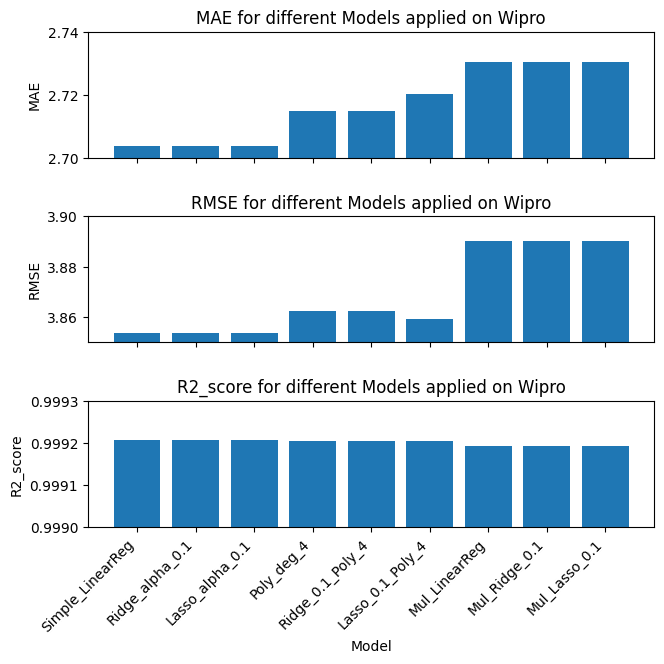

In [119]:
fig,ax=plt.subplots(nrows=3,ncols=1,sharex=True,figsize=(7, 7))
ax[0].bar(wipro_mae['Models'], wipro_mae['MAE'])
ax[0].set_xticks(range(len(wipro_mae['Models'])))  # Ensure ticks match the bar positions
ax[0].set_xticklabels(wipro_mae['Models'], rotation=45, ha='right')  # Correct usage to rotate labels
# ax[0].set_xlabel('Model')
ax[0].set_ylabel('MAE')
ax[0].set_title('MAE for different Models applied on Wipro')
ax[0].set_ylim(2.7, 2.74)

ax[1].bar(wipro_rmse['Models'], wipro_rmse['RMSE'])
ax[1].set_xticks(range(len(wipro_rmse['Models'])))  # Ensure ticks match the bar positions
ax[1].set_xticklabels(wipro_rmse['Models'], rotation=45, ha='right')  # Correct usage to rotate labels
# ax[1].set_xlabel('Model')
ax[1].set_ylabel('RMSE')
ax[1].set_title('RMSE for different Models applied on Wipro')
ax[1].set_ylim(3.85, 3.9)

ax[2].bar(wipro_r2['Models'], wipro_r2['R2_score'])
ax[2].set_xticks(range(len(wipro_r2['Models'])))  # Ensure ticks match the bar positions
ax[2].set_xticklabels(wipro_r2['Models'], rotation=45, ha='right')  # Correct usage to rotate labels
ax[2].set_xlabel('Model')
ax[2].set_ylabel('R2_score')
ax[2].set_title('R2_score for different Models applied on Wipro')
ax[2].set_ylim(0.999,0.9993)
plt.tight_layout(pad=2.0)
plt.show()

## Elasticnet

In [120]:
# from sklearn.linear_model import ElasticNet
# eln=ElasticNet(alpha=1,l1_ratio=0.5)

In [121]:
# eln.fit(X_train,y_train)

In [122]:
# cdf['coef_elnet']=eln.coef_
# cdf

In [123]:
# eln.intercept_

In [124]:
# pred=eln.predict(X_test)

In [125]:
# print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

In [126]:
# mul_mean_abs_err['ElasticNet']=[mean_absolute_error(y_test,pred)]
# mul_mean_abs_err

In [127]:
# mul_root_mean_sq_err['ElasticNet']=[find_RMSE(pred,y_test)]
# mul_root_mean_sq_err

In [128]:
# mul_R2_score['ElasticNet']=[r2_score(y_test,pred)]
# mul_R2_score

## HCL Tech

In [129]:
data=pd.read_csv('HCLTECH.NS.csv')
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2008-01-01,83.000000,83.612503,80.074997,80.512497,54.561787,730260.0
1,2008-01-02,80.487503,81.474998,78.262497,78.587502,53.257256,1896700.0
2,2008-01-03,79.000000,79.187500,77.012497,77.500000,52.520294,2943936.0
3,2008-01-04,77.750000,79.237503,77.012497,78.762497,53.375851,2431480.0
4,2008-01-07,79.000000,79.000000,74.400002,74.824997,50.707485,5565516.0
...,...,...,...,...,...,...,...
4065,2024-06-24,1437.849976,1443.949951,1426.599976,1440.849976,1440.849976,1988692.0
4066,2024-06-25,1440.949951,1450.099976,1426.449951,1447.949951,1447.949951,2079037.0
4067,2024-06-26,1447.949951,1453.300049,1438.199951,1443.699951,1443.699951,1917424.0
4068,2024-06-27,1435.000000,1460.550049,1423.500000,1454.900024,1454.900024,6613193.0


In [130]:
data.shape

(4070, 7)

In [131]:
data.isnull().sum()

Date         0
Open         6
High         6
Low          6
Close        6
Adj Close    6
Volume       6
dtype: int64

In [132]:
data=data.dropna()
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [133]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,4064.000000,4064.000000,4064.000000,4064.000000,4064.000000,4.064000e+03
mean,488.613936,494.452344,482.427356,488.367138,428.158999,4.273730e+06
std,399.144922,403.022273,394.758817,398.791275,384.386532,3.253513e+06
min,21.775000,23.687500,21.662500,22.424999,16.247818,0.000000e+00
25%,122.843748,124.500000,121.037498,122.990625,92.759548,2.387086e+06
50%,422.000000,426.875000,417.100006,421.412491,344.226059,3.413020e+06
75%,585.000000,592.400009,578.287506,584.099991,501.127785,5.126951e+06
max,1697.000000,1697.349976,1663.449951,1686.400024,1664.060303,4.151112e+07


In [134]:
df=data.drop(columns=['Date'])
df

,Open,High,Low,Close,Adj Close,Volume
0,83.000000,83.612503,80.074997,80.512497,54.561787,730260.0
1,80.487503,81.474998,78.262497,78.587502,53.257256,1896700.0
2,79.000000,79.187500,77.012497,77.500000,52.520294,2943936.0
3,77.750000,79.237503,77.012497,78.762497,53.375851,2431480.0
4,79.000000,79.000000,74.400002,74.824997,50.707485,5565516.0
...,...,...,...,...,...,...
4065,1437.849976,1443.949951,1426.599976,1440.849976,1440.849976,1988692.0
4066,1440.949951,1450.099976,1426.449951,1447.949951,1447.949951,2079037.0
4067,1447.949951,1453.300049,1438.199951,1443.699951,1443.699951,1917424.0
4068,1435.000000,1460.550049,1423.500000,1454.900024,1454.900024,6613193.0


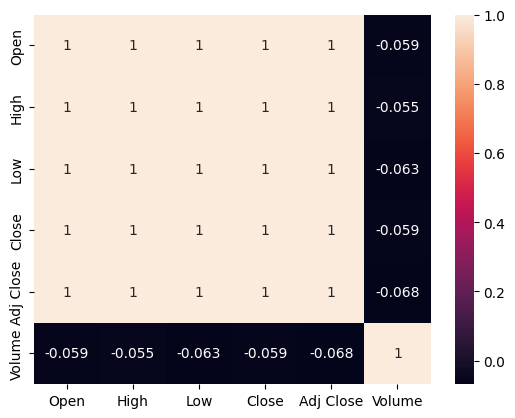

In [135]:
sns.heatmap(df.corr(),annot=True)
plt.show()

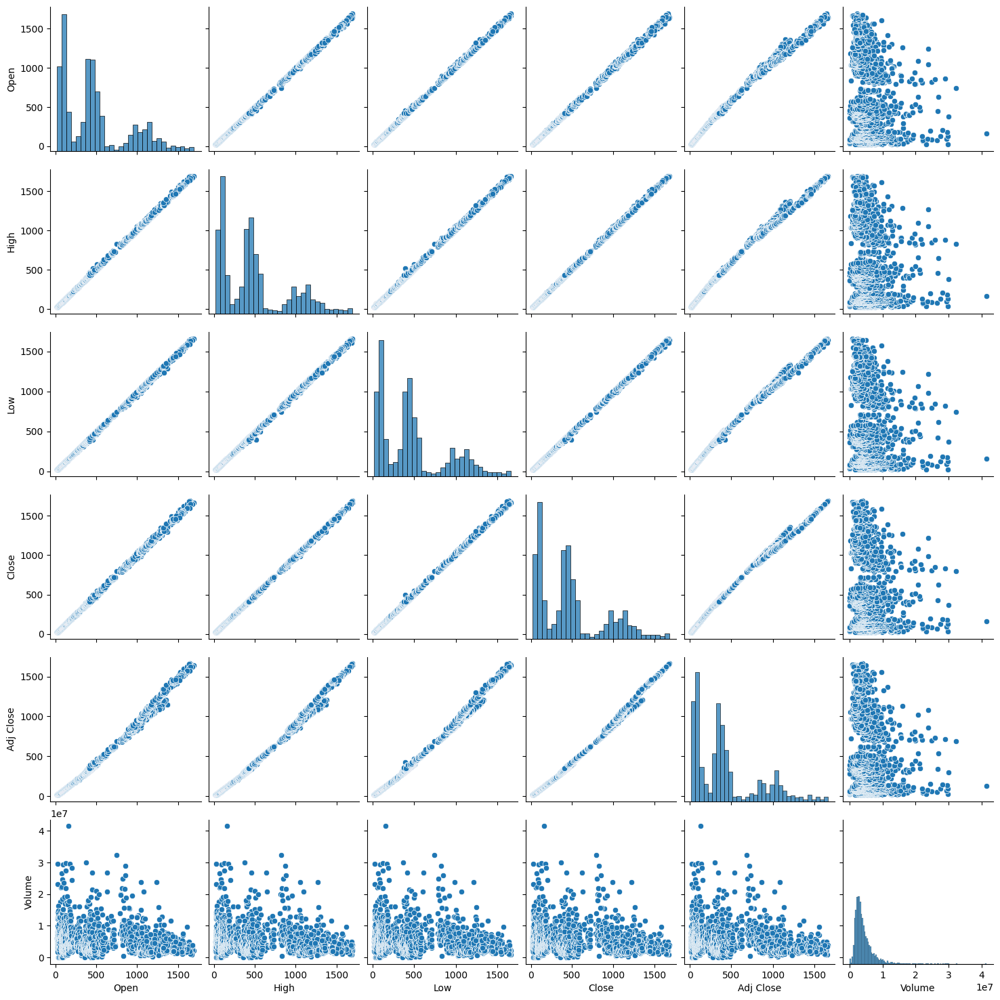

In [136]:
sns.pairplot(df,kind='scatter')
plt.show()

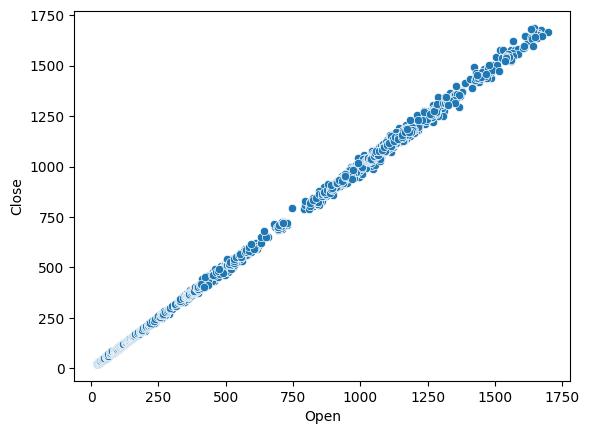

In [137]:
sns.scatterplot(x=df['Open'],y=df['Close'])
plt.show()

## Simple Linear Regression

In [138]:
# independent feature
X=df[['Open']]
X

,Open
0,83.000000
1,80.487503
2,79.000000
3,77.750000
4,79.000000
...,...
4065,1437.849976
4066,1440.949951
4067,1447.949951
4068,1435.000000


In [139]:
# dependent feature
y=df['Close']
y

0         80.512497
1         78.587502
2         77.500000
3         78.762497
4         74.824997
           ...     
4065    1440.849976
4066    1447.949951
4067    1443.699951
4068    1454.900024
4069    1459.599976
Name: Close, Length: 4064, dtype: float64

In [140]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [141]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [142]:
print(f"Coefficient : {lr.coef_}\nintercept : {lr.intercept_}")

Coefficient : [0.998862]
intercept : 0.3547984750763362


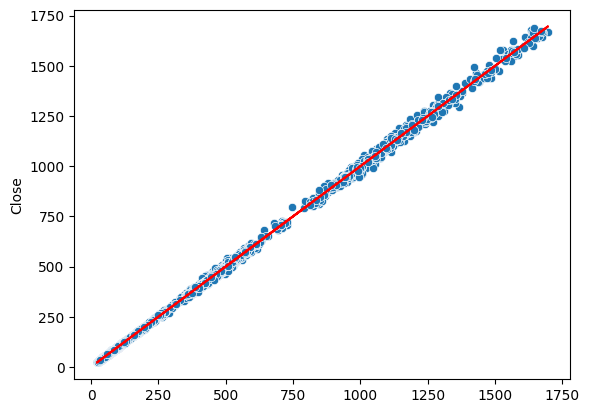

In [143]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),color='red')
plt.show()

In [144]:
pred=lr.predict(X_test)

In [145]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 5.246393155135348
MSE : 71.0293086344395
RMSE : 8.427888741223361
R2 : 0.9995459057055675
Adj R2 : 0.9995452206007487


In [146]:
lr_mae=mean_absolute_error(y_test,pred)
lr_rmse=find_RMSE(pred,y_test)
lr_r2=r2_score(y_test,pred)

## Ridge

In [147]:
rr=Ridge(alpha=0.1)
rr.fit(X_train,y_train)

Ridge(alpha=0.1)

In [148]:
print(rr.coef_,rr.intercept_)

[0.998862] 0.3547985696786782


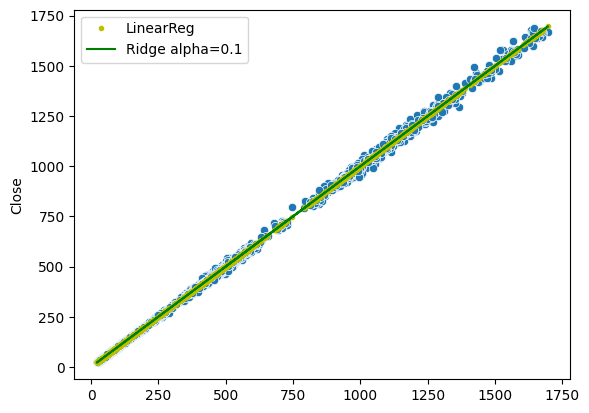

In [149]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'y.',label='LinearReg')
plt.plot(X_val,rr.predict(X_train),color='green',label='Ridge alpha=0.1')
plt.legend()
plt.show()

In [150]:
y_pred=rr.predict(X_test)

In [151]:
print(f"MAE : {mean_absolute_error(y_test,y_pred)}\nMSE : {mean_squared_error(y_test,y_pred)}\nRMSE : {find_RMSE(y_pred,y_test)}\nR2 : {r2_score(y_test,y_pred)}\nAdj R2 : {find_adj_r2(y_pred,y_test)}")

MAE : 5.246393156127266
MSE : 71.02930863062805
RMSE : 8.42788874099724
R2 : 0.9995459057055918
Adj R2 : 0.999545220600598


In [152]:
rr_mae=mean_absolute_error(y_test,y_pred)
rr_rmse=find_RMSE(y_pred,y_test)
rr_r2=r2_score(y_test,y_pred)

## Lasso

In [153]:
lsr=Lasso(alpha=0.1)
lsr.fit(X_train,y_train)

Lasso(alpha=0.1)

In [154]:
print(lsr.coef_,lsr.intercept_)

[0.99886138] 0.3551063771259919


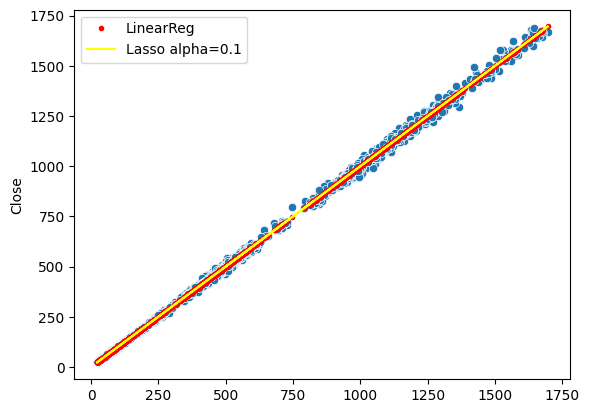

In [155]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'r.',label='LinearReg')
plt.plot(X_val,lsr.predict(X_train),color='yellow',label='Lasso alpha=0.1')
plt.legend()
plt.show()

In [156]:
yl_pred=lsr.predict(X_test)

In [157]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 5.246396383531021
MSE : 71.02929629093958
RMSE : 8.427888008922496
R2 : 0.9995459057844801
Adj R2 : 0.9995452201101244


In [158]:
lsr_mae=mean_absolute_error(y_test,yl_pred)
lsr_rmse=find_RMSE(yl_pred,y_test)
lsr_r2=r2_score(y_test,yl_pred)

## Polynomial of degree 4

In [159]:
poly=PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X_train)
X_test1=poly.transform(X_test)
poly.fit(X_poly,y_train)
lin=LinearRegression()
lin.fit(X_poly,y_train)

LinearRegression()

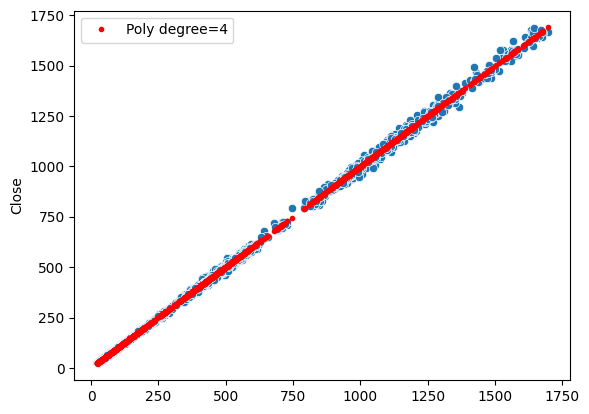

In [160]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'r.',label='Poly degree=4')
plt.legend()
plt.show()

In [161]:
yp_pred=lin.predict(X_test1)

In [162]:
print(f"MAE : {mean_absolute_error(y_test,yp_pred)}\nMSE : {mean_squared_error(y_test,yp_pred)}\nRMSE : {find_RMSE(yp_pred,y_test)}\nR2 : {r2_score(y_test,yp_pred)}\nAdj R2 : {find_adj_r2(yp_pred,y_test)}")

MAE : 5.261852339590396
MSE : 71.49387713825621
RMSE : 8.455405202487709
R2 : 0.9995429356934554
Adj R2 : 0.9995424575123856


In [163]:
poly_mae=mean_absolute_error(y_test,yp_pred)
poly_rmse=find_RMSE(yp_pred,y_test)
poly_r2=r2_score(y_test,yp_pred)

## Ridge on polynomial of degree 4

In [164]:
ridp=Ridge(alpha=0.1)
ridp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=2.3729e-29): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Ridge(alpha=0.1)

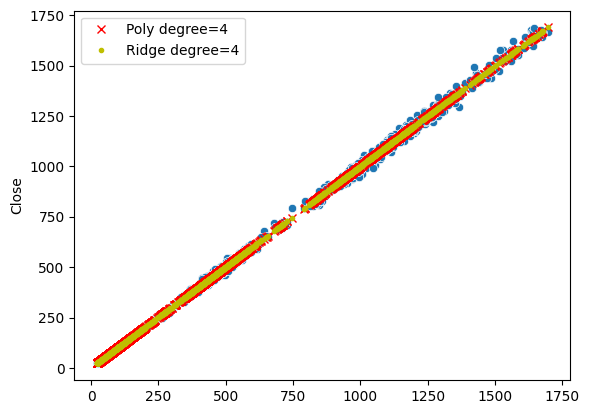

In [165]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'rx',label='Poly degree=4')
plt.plot(X_val,ridp.predict(X_poly),'y.',label='Ridge degree=4')
plt.legend()
plt.show()

In [166]:
yr_pred=ridp.predict(X_test1)

In [167]:
print(f"MAE : {mean_absolute_error(y_test,yr_pred)}\nMSE : {mean_squared_error(y_test,yr_pred)}\nRMSE : {find_RMSE(yr_pred,y_test)}\nR2 : {r2_score(y_test,yr_pred)}\nAdj R2 : {find_adj_r2(yr_pred,y_test)}")

MAE : 5.261850836478188
MSE : 71.49385614757193
RMSE : 8.455403961229289
R2 : 0.99954293582765
Adj R2 : 0.999542457636434


In [168]:
ridp_mae=mean_absolute_error(y_test,yr_pred)
ridp_rmse=find_RMSE(yr_pred,y_test)
ridp_r2=r2_score(y_test,yr_pred)

## Lasso on Polynomial of degree 4

In [169]:
lsp=Lasso(alpha=0.1)
lsp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.427e+05, tolerance: 5.188e+04
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.1)

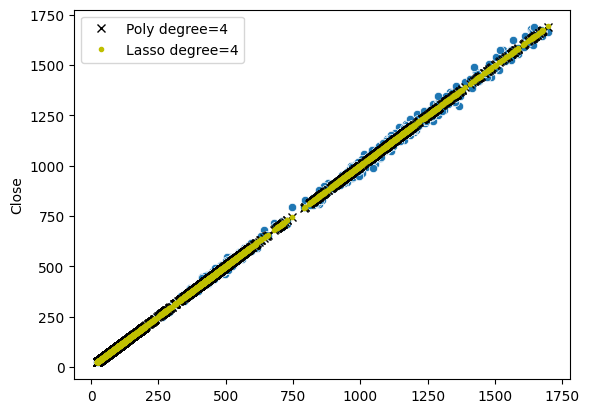

In [170]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'kx',label='Poly degree=4')
plt.plot(X_val,lsp.predict(X_poly),'y.',label='Lasso degree=4')
plt.legend()
plt.show()

In [171]:
yl_pred=lsp.predict(X_test1)

In [172]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 5.271076174535001
MSE : 71.61345390650602
RMSE : 8.462473273606602
R2 : 0.9995421712325694
Adj R2 : 0.999541635222766


In [173]:
lsp_mae=mean_absolute_error(y_test,yl_pred)
lsp_rmse=find_RMSE(yl_pred,y_test)
lsp_r2=r2_score(y_test,yl_pred)

## Multiple Linear Regression

In [174]:
df

,Open,High,Low,Close,Adj Close,Volume
0,83.000000,83.612503,80.074997,80.512497,54.561787,730260.0
1,80.487503,81.474998,78.262497,78.587502,53.257256,1896700.0
2,79.000000,79.187500,77.012497,77.500000,52.520294,2943936.0
3,77.750000,79.237503,77.012497,78.762497,53.375851,2431480.0
4,79.000000,79.000000,74.400002,74.824997,50.707485,5565516.0
...,...,...,...,...,...,...
4065,1437.849976,1443.949951,1426.599976,1440.849976,1440.849976,1988692.0
4066,1440.949951,1450.099976,1426.449951,1447.949951,1447.949951,2079037.0
4067,1447.949951,1453.300049,1438.199951,1443.699951,1443.699951,1917424.0
4068,1435.000000,1460.550049,1423.500000,1454.900024,1454.900024,6613193.0


as high and low has high corelation with open so to avoid milticolinearity we will drop the columns high and low and try to train our model using two independent feature open and volume

In [175]:
df.drop(columns=['High','Low','Adj Close'],inplace=True)
df

,Open,Close,Volume
0,83.000000,80.512497,730260.0
1,80.487503,78.587502,1896700.0
2,79.000000,77.500000,2943936.0
3,77.750000,78.762497,2431480.0
4,79.000000,74.824997,5565516.0
...,...,...,...
4065,1437.849976,1440.849976,1988692.0
4066,1440.949951,1447.949951,2079037.0
4067,1447.949951,1443.699951,1917424.0
4068,1435.000000,1454.900024,6613193.0


In [176]:
X=df.drop(columns=['Close'])
X

,Open,Volume
0,83.000000,730260.0
1,80.487503,1896700.0
2,79.000000,2943936.0
3,77.750000,2431480.0
4,79.000000,5565516.0
...,...,...
4065,1437.849976,1988692.0
4066,1440.949951,2079037.0
4067,1447.949951,1917424.0
4068,1435.000000,6613193.0


In [177]:
y=df['Close']
y

0         80.512497
1         78.587502
2         77.500000
3         78.762497
4         74.824997
           ...     
4065    1440.849976
4066    1447.949951
4067    1443.699951
4068    1454.900024
4069    1459.599976
Name: Close, Length: 4064, dtype: float64

In [178]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [179]:
mlin=LinearRegression()
mlin.fit(X_train,y_train)

LinearRegression()

In [180]:
cdf=pd.DataFrame(mlin.coef_,X.columns,columns=['coef_lin'])
cdf

,coef_lin
Open,9.988730e-01
Volume,2.480014e-08


In [181]:
mlin.intercept_

0.24308721027608726

In [182]:
pred=mlin.predict(X_test)

In [183]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 5.243259818967387
MSE : 71.09496287974905
RMSE : 8.431782900416083
R2 : 0.9995454859743498
Adj R2 : 0.9995442333679749


In [184]:
mlin_mae=mean_absolute_error(y_test,pred)
mlin_rmse=find_RMSE(pred,y_test)
mlin_r2=r2_score(y_test,pred)

## Applying Ridge Regression on multiple linear regression

In [185]:
ridm=Ridge(alpha=0.1)
ridm.fit(X_train,y_train)

Ridge(alpha=0.1)

In [186]:
cdf['coef_ridge']=ridm.coef_
cdf

,coef_lin,coef_ridge
Open,9.988730e-01,9.988730e-01
Volume,2.480014e-08,2.480014e-08


In [187]:
ridm.intercept_

0.2430873107101661

In [188]:
pred=ridm.predict(X_test)

In [189]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 5.243259819813995
MSE : 71.09496287248218
RMSE : 8.431782899985162
R2 : 0.9995454859743963
Adj R2 : 0.9995442333678464


In [190]:
ridm_mae=mean_absolute_error(y_test,pred)
ridm_rmse=find_RMSE(pred,y_test)
ridm_r2=r2_score(y_test,pred)

## Applying Lasso Regression on Multiple Linear Regression

In [191]:
lso=Lasso(alpha=0.1)
lso.fit(X_train,y_train)

Lasso(alpha=0.1)

In [192]:
cdf['coef_lasso']=lso.coef_
cdf

,coef_lin,coef_ridge,coef_lasso
Open,9.988730e-01,9.988730e-01,9.988723e-01
Volume,2.480014e-08,2.480014e-08,2.479570e-08


In [193]:
lso.intercept_

0.24343116951160937

In [194]:
pred=lso.predict(X_test)

In [195]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 5.2432627190787455
MSE : 71.09493803561763
RMSE : 8.431781427172886
R2 : 0.9995454861331797
Adj R2 : 0.99954423292746


In [196]:
lso_mae=mean_absolute_error(y_test,pred)
lso_rmse=find_RMSE(pred,y_test)
lso_r2=r2_score(y_test,pred)

In [197]:
hcl_mae=pd.DataFrame()
hcl_mae['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
hcl_mae['MAE']=[lr_mae,rr_mae,lsr_mae,poly_mae,ridp_mae,lsp_mae,mlin_mae,ridm_mae,lso_mae]
hcl_mae

,Models,MAE
0,Simple_LinearReg,5.246393
1,Ridge_alpha_0.1,5.246393
2,Lasso_alpha_0.1,5.246396
3,Poly_deg_4,5.261852
4,Ridge_0.1_Poly_4,5.261851
5,Lasso_0.1_Poly_4,5.271076
6,Mul_LinearReg,5.243260
7,Mul_Ridge_0.1,5.243260
8,Mul_Lasso_0.1,5.243263


In [198]:
hcl_rmse=pd.DataFrame()
hcl_rmse['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
hcl_rmse['RMSE']=[lr_rmse,rr_rmse,lsr_rmse,poly_rmse,ridp_rmse,lsp_rmse,mlin_rmse,ridm_rmse,lso_rmse]
hcl_rmse

,Models,RMSE
0,Simple_LinearReg,8.427889
1,Ridge_alpha_0.1,8.427889
2,Lasso_alpha_0.1,8.427888
3,Poly_deg_4,8.455405
4,Ridge_0.1_Poly_4,8.455404
5,Lasso_0.1_Poly_4,8.462473
6,Mul_LinearReg,8.431783
7,Mul_Ridge_0.1,8.431783
8,Mul_Lasso_0.1,8.431781


In [199]:
hcl_r2=pd.DataFrame()
hcl_r2['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
hcl_r2['R2_score']=[lr_r2,rr_r2,lsr_r2,poly_r2,ridp_r2,lsp_r2,mlin_r2,ridm_r2,lso_r2]
hcl_r2

,Models,R2_score
0,Simple_LinearReg,0.999546
1,Ridge_alpha_0.1,0.999546
2,Lasso_alpha_0.1,0.999546
3,Poly_deg_4,0.999543
4,Ridge_0.1_Poly_4,0.999543
5,Lasso_0.1_Poly_4,0.999542
6,Mul_LinearReg,0.999545
7,Mul_Ridge_0.1,0.999545
8,Mul_Lasso_0.1,0.999545


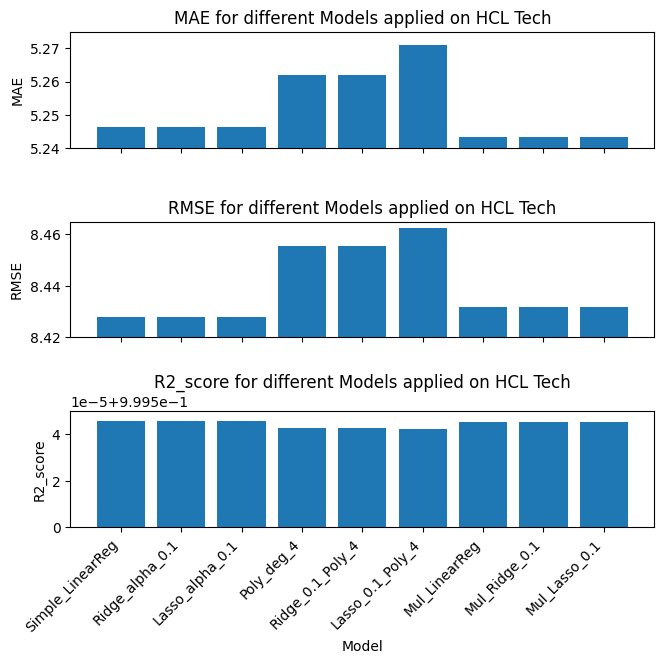

In [200]:
fig,ax=plt.subplots(nrows=3,ncols=1,sharex=True,figsize=(7, 7))
ax[0].bar(hcl_mae['Models'], hcl_mae['MAE'])
ax[0].set_xticks(range(len(hcl_mae['Models'])))  
ax[0].set_xticklabels(hcl_mae['Models'], rotation=45, ha='right')  
ax[0].set_ylabel('MAE')
ax[0].set_title('MAE for different Models applied on HCL Tech')
ax[0].set_ylim(5.24, 5.275)

ax[1].bar(hcl_rmse['Models'], hcl_rmse['RMSE'])
ax[1].set_xticks(range(len(hcl_rmse['Models']))) 
ax[1].set_xticklabels(hcl_rmse['Models'], rotation=45, ha='right')  
ax[1].set_ylabel('RMSE')
ax[1].set_title('RMSE for different Models applied on HCL Tech')
ax[1].set_ylim(8.42, 8.465)

ax[2].bar(hcl_r2['Models'], hcl_r2['R2_score'])
ax[2].set_xticks(range(len(hcl_r2['Models'])))  
ax[2].set_xticklabels(hcl_r2['Models'], rotation=45, ha='right') 
ax[2].set_xlabel('Model')
ax[2].set_ylabel('R2_score')
ax[2].set_title('R2_score for different Models applied on HCL Tech')
ax[2].set_ylim(0.9995,0.99955)
plt.tight_layout(pad=2.0)
plt.show()

## ElasticNet

In [201]:
# eln=ElasticNet(alpha=1,l1_ratio=0.5)
# eln.fit(X_train,y_train)

In [202]:
# cdf['coef_elnet']=eln.coef_
# cdf

In [203]:
# eln.intercept_

In [204]:
# pred=eln.predict(X_test)

In [205]:
# print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

In [206]:
# eln_mae=mean_absolute_error(y_test,pred)
# eln_rmse=find_RMSE(pred,y_test)
# eln_r2=r2_score(y_test,pred)

## Comparisons

In [207]:
new_row=pd.DataFrame({
    'Companies' : ['HCL Tech'],
    'Simple_LinearReg' : [lr_mae],
    'Ridge_alpha_0.1' : [rr_mae],
    'Lasso_alpha_0.1' : [lsr_mae],
    'Poly_deg_4' : [poly_mae],
    'Ridge_0.1_Poly_4' : [ridp_mae],
    'Lasso_0.1_Poly_4' : [lsp_mae],
   })
mean_abs_err=pd.concat([mean_abs_err,new_row],ignore_index=True)
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,2.703910,2.703910,2.703907,2.714773,2.714773,2.720406
1,HCL Tech,5.246393,5.246393,5.246396,5.261852,5.261851,5.271076


In [208]:
new_row=pd.DataFrame({
    'Companies' : ['HCL Tech'],
    'Mul_LinearReg' : [mlin_mae],
    'Mul_Ridge_0.1' : [ridm_mae],
    'Mul_Lasso_0.1' : [lso_mae]
    # 'ElasticNet' : [eln_mae],
})
mul_mean_abs_err=pd.concat([mul_mean_abs_err,new_row],ignore_index=True)
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,2.730339,2.730339,2.730348
1,HCL Tech,5.243260,5.243260,5.243263


In [209]:
new_row=pd.DataFrame({
    'Companies' : ['HCL Tech'],
    'Simple_LinearReg' : [lr_rmse],
    'Ridge_alpha_0.1' : [rr_rmse],
    'Lasso_alpha_0.1' : [lsr_rmse],
    'Poly_deg_4' : [poly_rmse],
    'Ridge_0.1_Poly_4' : [ridp_rmse],
    'Lasso_0.1_Poly_4' : [lsp_rmse],
    })
root_mean_sq_err=pd.concat([root_mean_sq_err,new_row],ignore_index=True)
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.862410,3.862410,3.859339
1,HCL Tech,8.427889,8.427889,8.427888,8.455405,8.455404,8.462473


In [210]:
new_row=pd.DataFrame({
    'Companies' : ['HCL Tech'],
    'Mul_LinearReg' : [mlin_rmse],
    'Mul_Ridge_0.1' : [ridm_rmse],
    'Mul_Lasso_0.1' : [lso_rmse]
    # 'ElasticNet' : [eln_rmse],
})
mul_root_mean_sq_err=pd.concat([mul_root_mean_sq_err,new_row],ignore_index=True)
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,3.890457,3.890457,3.890457
1,HCL Tech,8.431783,8.431783,8.431781


In [211]:
new_row=pd.DataFrame({
    'Companies' : ['HCL Tech'],
    'Simple_LinearReg' : [lr_r2],
    'Ridge_alpha_0.1' : [rr_r2],
    'Lasso_alpha_0.1' : [lsr_r2],
    'Poly_deg_4' : [poly_r2],
    'Ridge_0.1_Poly_4' : [ridp_r2],
    'Lasso_0.1_Poly_4' : [lsp_r2],
    })
R2_score=pd.concat([R2_score,new_row],ignore_index=True)
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204,0.999205
1,HCL Tech,0.999546,0.999546,0.999546,0.999543,0.999543,0.999542


In [212]:
new_row=pd.DataFrame({
    'Companies' : ['HCL Tech'],
    'Mul_LinearReg' : [mlin_r2],
    'Mul_Ridge_0.1' : [ridm_r2],
    'Mul_Lasso_0.1' : [lso_r2]
    # 'ElasticNet' : [eln_r2]
})
mul_R2_score=pd.concat([mul_R2_score,new_row],ignore_index=True)
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,0.999192,0.999192,0.999192
1,HCL Tech,0.999545,0.999545,0.999545


## Infosys

In [213]:
data=pd.read_csv('INFY.NS.csv')
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2008-01-01,220.824997,222.324997,217.781250,218.356247,154.427414,2001624.0
1,2008-01-02,218.750000,219.918747,214.050003,218.537506,154.555603,6155056.0
2,2008-01-03,224.625000,224.625000,211.250000,213.631256,151.085754,12425960.0
3,2008-01-04,218.425003,218.425003,210.000000,211.862503,149.834854,6166320.0
4,2008-01-07,208.750000,211.250000,202.875000,204.606247,144.703003,13254200.0
...,...,...,...,...,...,...,...
4065,2024-06-24,1524.550049,1529.099976,1515.400024,1527.150024,1527.150024,5564989.0
4066,2024-06-25,1526.000000,1543.900024,1520.349976,1541.949951,1541.949951,4551525.0
4067,2024-06-26,1541.000000,1548.849976,1535.000000,1540.699951,1540.699951,4851004.0
4068,2024-06-27,1538.449951,1578.400024,1532.050049,1573.349976,1573.349976,14757754.0


In [214]:
data.shape

(4070, 7)

In [215]:
data.isnull().sum()

Date         0
Open         7
High         7
Low          7
Close        7
Adj Close    7
Volume       7
dtype: int64

In [216]:
data=data.dropna()
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [217]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,4063.000000,4063.000000,4063.000000,4063.000000,4063.000000,4.063000e+03
mean,689.492306,696.605874,682.153511,689.394149,611.427180,9.167400e+06
std,471.920340,475.745124,467.718853,471.717439,479.114413,7.697152e+06
min,137.875000,139.949997,130.000000,137.787506,99.602066,0.000000e+00
25%,348.328125,351.071869,344.850006,348.409378,260.656250,5.474066e+06
50%,508.950012,514.112488,503.475006,508.299988,419.397705,7.325904e+06
75%,790.574982,799.500000,784.200012,792.725006,711.789520,1.045710e+07
max,1938.550049,1953.900024,1930.500000,1939.500000,1838.948853,1.663204e+08


In [218]:
df=data.drop(columns=['Date'])
df

,Open,High,Low,Close,Adj Close,Volume
0,220.824997,222.324997,217.781250,218.356247,154.427414,2001624.0
1,218.750000,219.918747,214.050003,218.537506,154.555603,6155056.0
2,224.625000,224.625000,211.250000,213.631256,151.085754,12425960.0
3,218.425003,218.425003,210.000000,211.862503,149.834854,6166320.0
4,208.750000,211.250000,202.875000,204.606247,144.703003,13254200.0
...,...,...,...,...,...,...
4065,1524.550049,1529.099976,1515.400024,1527.150024,1527.150024,5564989.0
4066,1526.000000,1543.900024,1520.349976,1541.949951,1541.949951,4551525.0
4067,1541.000000,1548.849976,1535.000000,1540.699951,1540.699951,4851004.0
4068,1538.449951,1578.400024,1532.050049,1573.349976,1573.349976,14757754.0


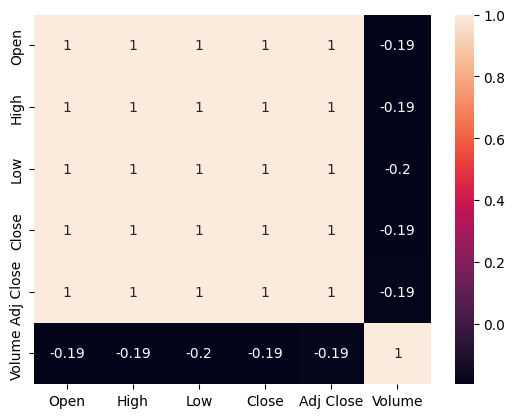

In [219]:
sns.heatmap(df.corr(),annot=True)
plt.show()

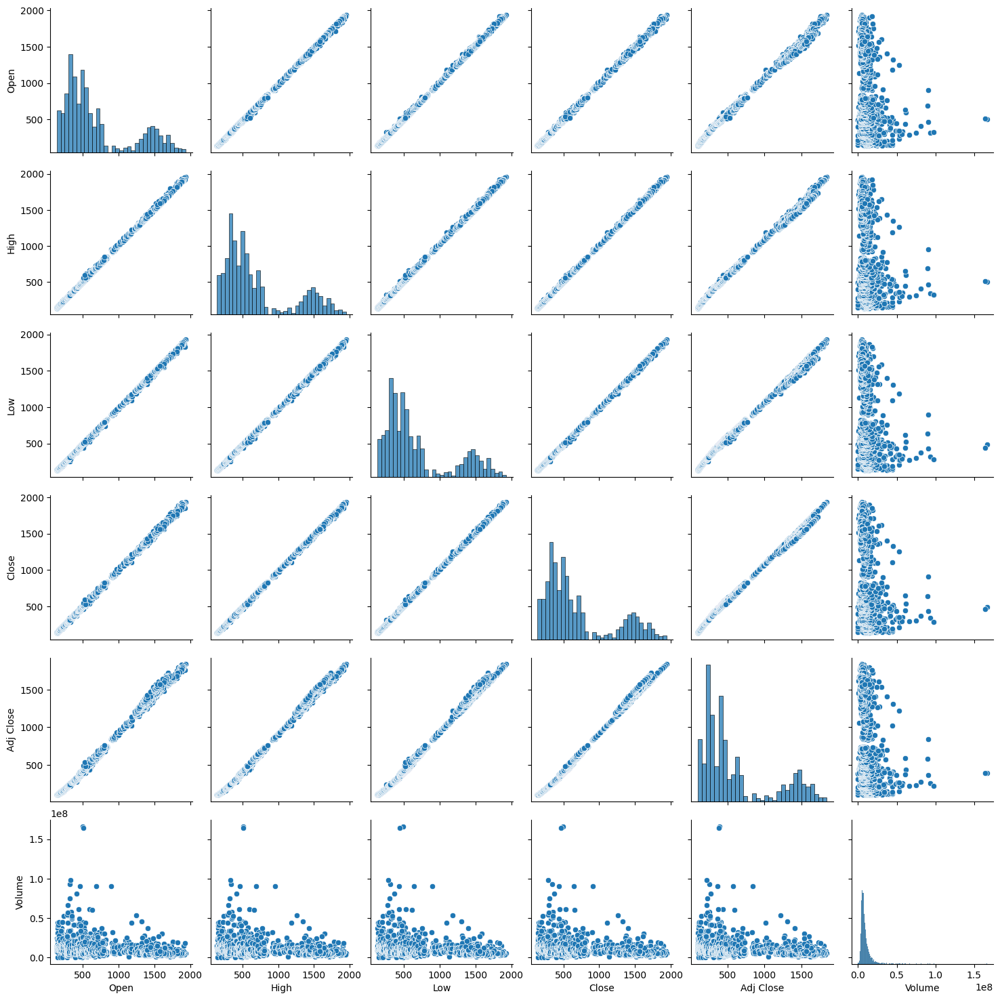

In [220]:
sns.pairplot(df,kind='scatter')
plt.show()

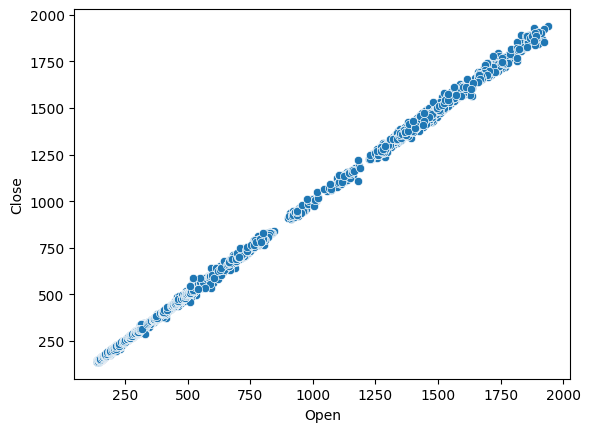

In [221]:
sns.scatterplot(x=df['Open'],y=df['Close'])
plt.show()

##  Simple Linear Regression

In [222]:
# independent feature
X=df[['Open']]
X

,Open
0,220.824997
1,218.750000
2,224.625000
3,218.425003
4,208.750000
...,...
4065,1524.550049
4066,1526.000000
4067,1541.000000
4068,1538.449951


In [223]:
# dependent feature
y=df['Close']
y

0        218.356247
1        218.537506
2        213.631256
3        211.862503
4        204.606247
           ...     
4065    1527.150024
4066    1541.949951
4067    1540.699951
4068    1573.349976
4069    1566.750000
Name: Close, Length: 4063, dtype: float64

In [224]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [225]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [226]:
print(f"Coefficient : {lr.coef_}\nintercept : {lr.intercept_}")

Coefficient : [0.99919024]
intercept : 0.5046269466697595


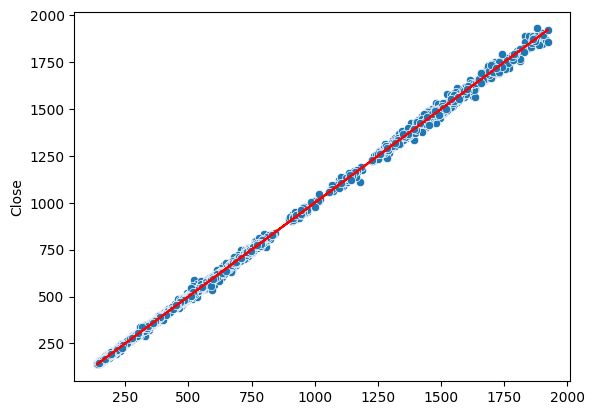

In [227]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),color='red')
plt.show()

In [228]:
pred=lr.predict(X_test)

In [229]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 6.62000788274759
MSE : 104.3730677192525
RMSE : 10.21631380289645
R2 : 0.9995339279811382
Adj R2 : 0.9995325715293583


In [230]:
lr_mae=mean_absolute_error(y_test,pred)
lr_rmse=find_RMSE(pred,y_test)
lr_r2=r2_score(y_test,pred)

## Ridge 

In [231]:
rr=Ridge(alpha=0.1)
rr.fit(X_train,y_train)

Ridge(alpha=0.1)

In [232]:
print(rr.coef_,rr.intercept_)

[0.99919024] 0.5046270426780666


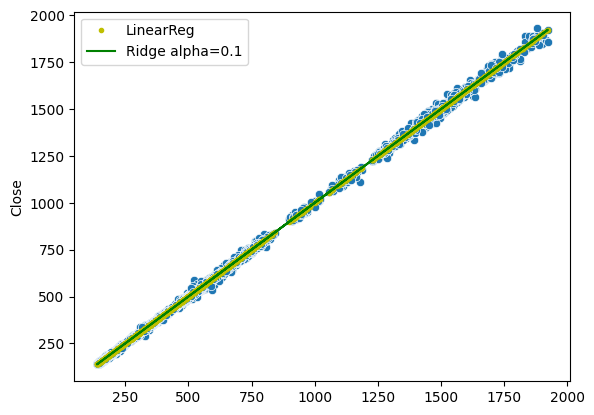

In [233]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'y.',label='LinearReg')
plt.plot(X_val,rr.predict(X_train),color='green',label='Ridge alpha=0.1')
plt.legend()
plt.show()

In [234]:
y_pred=rr.predict(X_test)

In [235]:
print(f"MAE : {mean_absolute_error(y_test,y_pred)}\nMSE : {mean_squared_error(y_test,y_pred)}\nRMSE : {find_RMSE(y_pred,y_test)}\nR2 : {r2_score(y_test,y_pred)}\nAdj R2 : {find_adj_r2(y_pred,y_test)}")

MAE : 6.620007883304438
MSE : 104.37306775804802
RMSE : 10.216313804795153
R2 : 0.9995339279809649
Adj R2 : 0.999532571529055


In [236]:
rr_mae=mean_absolute_error(y_test,y_pred)
rr_rmse=find_RMSE(y_pred,y_test)
rr_r2=r2_score(y_test,y_pred)

## Lasso

In [237]:
lsr=Lasso(alpha=0.1)
lsr.fit(X_train,y_train)

Lasso(alpha=0.1)

In [238]:
print(lsr.coef_,lsr.intercept_)

[0.99918979] 0.5049392284391843


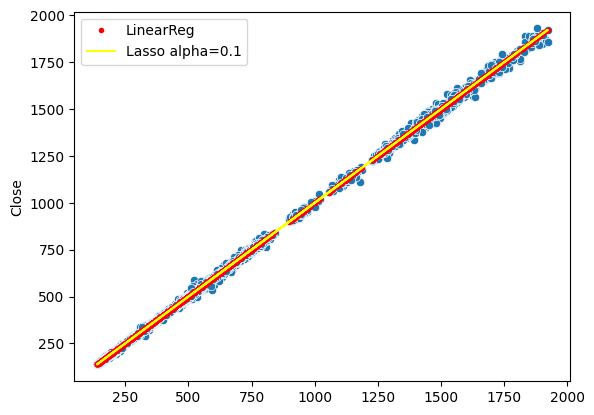

In [239]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'r.',label='LinearReg')
plt.plot(X_val,lsr.predict(X_train),color='yellow',label='Lasso alpha=0.1')
plt.legend()
plt.show()

In [240]:
yl_pred=lsr.predict(X_test)

In [241]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 6.620009693973936
MSE : 104.37319395288654
RMSE : 10.216319980936705
R2 : 0.999533927417449
Adj R2 : 0.9995325705430226


In [242]:
lsr_mae=mean_absolute_error(y_test,yl_pred)
lsr_rmse=find_RMSE(yl_pred,y_test)
lsr_r2=r2_score(y_test,yl_pred)

## Polynomial of Degree 4

In [243]:
poly=PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X_train)
X_test1=poly.transform(X_test)
poly.fit(X_poly,y_train)
lin=LinearRegression()
lin.fit(X_poly,y_train)

LinearRegression()

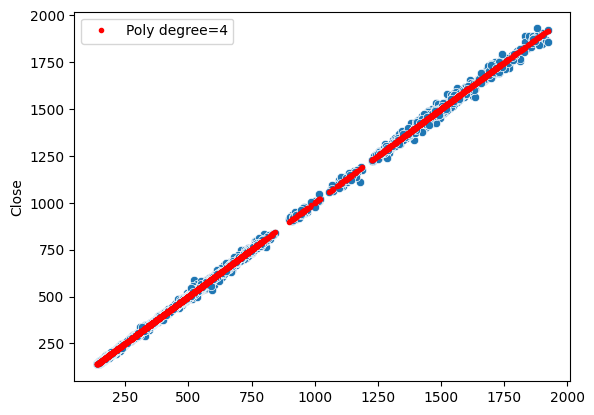

In [244]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'r.',label='Poly degree=4')
plt.legend()
plt.show()

In [245]:
yp_pred=lin.predict(X_test1)

In [246]:
print(f"MAE : {mean_absolute_error(y_test,yp_pred)}\nMSE : {mean_squared_error(y_test,yp_pred)}\nRMSE : {find_RMSE(yp_pred,y_test)}\nR2 : {r2_score(y_test,yp_pred)}\nAdj R2 : {find_adj_r2(yp_pred,y_test)}")

MAE : 6.629635326106509
MSE : 104.33386854148138
RMSE : 10.214395162782836
R2 : 0.999534103022845
Adj R2 : 0.9995327767637524


In [247]:
poly_mae=mean_absolute_error(y_test,yp_pred)
poly_rmse=find_RMSE(yp_pred,y_test)
poly_r2=r2_score(y_test,yp_pred)

## Ridge on Polynomial of degree 4

In [248]:
ridp=Ridge(alpha=0.1)
ridp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=4.672e-30): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Ridge(alpha=0.1)

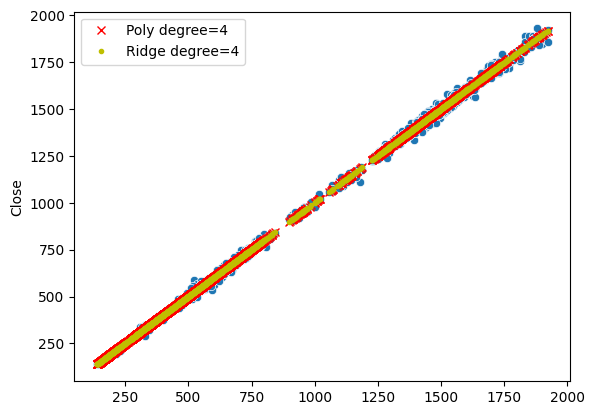

In [249]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'rx',label='Poly degree=4')
plt.plot(X_val,ridp.predict(X_poly),'y.',label='Ridge degree=4')
plt.legend()
plt.show()

In [250]:
yr_pred=ridp.predict(X_test1)

In [251]:
print(f"MAE : {mean_absolute_error(y_test,yr_pred)}\nMSE : {mean_squared_error(y_test,yr_pred)}\nRMSE : {find_RMSE(yr_pred,y_test)}\nR2 : {r2_score(y_test,yr_pred)}\nAdj R2 : {find_adj_r2(yr_pred,y_test)}")

MAE : 6.629620432307856
MSE : 104.33322809672757
RMSE : 10.214363812628154
R2 : 0.9995341058827147
Adj R2 : 0.9995327809169027


In [252]:
ridp_mae=mean_absolute_error(y_test,yr_pred)
ridp_rmse=find_RMSE(yr_pred,y_test)
ridp_r2=r2_score(y_test,yr_pred)

## Lasso on Polynomial of degree 4

In [253]:
lsp=Lasso(alpha=0.1)
lsp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.879e+05, tolerance: 7.215e+04
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.1)

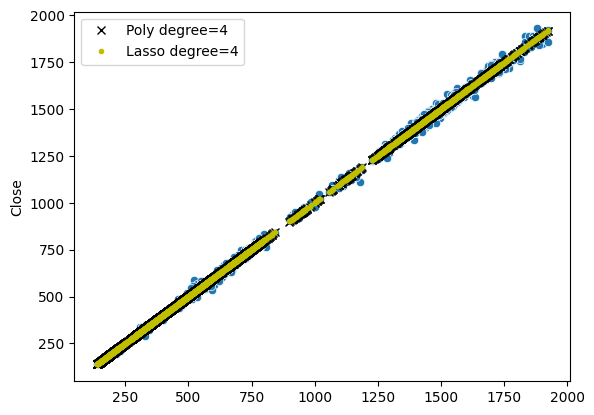

In [254]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'kx',label='Poly degree=4')
plt.plot(X_val,lsp.predict(X_poly),'y.',label='Lasso degree=4')
plt.legend()
plt.show()

In [255]:
yl_pred=lsp.predict(X_test1)

In [256]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 6.635311303233549
MSE : 104.35096517669665
RMSE : 10.215232017761352
R2 : 0.9995340266787893
Adj R2 : 0.9995326715154338


In [257]:
lsp_mae=mean_absolute_error(y_test,yl_pred)
lsp_rmse=find_RMSE(yl_pred,y_test)
lsp_r2=r2_score(y_test,yl_pred)

## Multiple Linear Regressiom

In [258]:
df

,Open,High,Low,Close,Adj Close,Volume
0,220.824997,222.324997,217.781250,218.356247,154.427414,2001624.0
1,218.750000,219.918747,214.050003,218.537506,154.555603,6155056.0
2,224.625000,224.625000,211.250000,213.631256,151.085754,12425960.0
3,218.425003,218.425003,210.000000,211.862503,149.834854,6166320.0
4,208.750000,211.250000,202.875000,204.606247,144.703003,13254200.0
...,...,...,...,...,...,...
4065,1524.550049,1529.099976,1515.400024,1527.150024,1527.150024,5564989.0
4066,1526.000000,1543.900024,1520.349976,1541.949951,1541.949951,4551525.0
4067,1541.000000,1548.849976,1535.000000,1540.699951,1540.699951,4851004.0
4068,1538.449951,1578.400024,1532.050049,1573.349976,1573.349976,14757754.0


as high and low has high corelation with open so to avoid milticolinearity we will drop the columns high and low and try to train our model using two independent feature open and volume

In [259]:
df.drop(columns=['High','Low','Adj Close'],inplace=True)
df

,Open,Close,Volume
0,220.824997,218.356247,2001624.0
1,218.750000,218.537506,6155056.0
2,224.625000,213.631256,12425960.0
3,218.425003,211.862503,6166320.0
4,208.750000,204.606247,13254200.0
...,...,...,...
4065,1524.550049,1527.150024,5564989.0
4066,1526.000000,1541.949951,4551525.0
4067,1541.000000,1540.699951,4851004.0
4068,1538.449951,1573.349976,14757754.0


In [260]:
X=df.drop(columns=['Close'])
X

,Open,Volume
0,220.824997,2001624.0
1,218.750000,6155056.0
2,224.625000,12425960.0
3,218.425003,6166320.0
4,208.750000,13254200.0
...,...,...
4065,1524.550049,5564989.0
4066,1526.000000,4551525.0
4067,1541.000000,4851004.0
4068,1538.449951,14757754.0


In [261]:
y=df['Close']
y

0        218.356247
1        218.537506
2        213.631256
3        211.862503
4        204.606247
           ...     
4065    1527.150024
4066    1541.949951
4067    1540.699951
4068    1573.349976
4069    1566.750000
Name: Close, Length: 4063, dtype: float64

In [262]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [263]:
mlin=LinearRegression()
mlin.fit(X_train,y_train)

LinearRegression()

In [264]:
cdf=pd.DataFrame(mlin.coef_,X.columns,columns=['coef_lin'])
cdf

,coef_lin
Open,9.991969e-01
Volume,2.246321e-09


In [265]:
mlin.intercept_

0.47956020716571857

In [266]:
pred=mlin.predict(X_test)

In [267]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 6.620607953176167
MSE : 104.44998105267193
RMSE : 10.220077350620784
R2 : 0.9995335845290065
Adj R2 : 0.9995316477611796


In [268]:
mlin_mae=mean_absolute_error(y_test,pred)
mlin_rmse=find_RMSE(pred,y_test)
mlin_r2=r2_score(y_test,pred)

## Applying Ridge Regression on Multiple Linear Regression

In [269]:
ridm=Ridge(alpha=0.1)
ridm.fit(X_train,y_train)

Ridge(alpha=0.1)

In [270]:
cdf['coef_ridge']=ridm.coef_
cdf

,coef_lin,coef_ridge
Open,9.991969e-01,9.991969e-01
Volume,2.246321e-09,2.246319e-09


In [271]:
ridm.intercept_

0.47956032289891937

In [272]:
pred=ridm.predict(X_test)

In [273]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 6.62060795326084
MSE : 104.44998103075496
RMSE : 10.220077349548532
R2 : 0.9995335845291045
Adj R2 : 0.9995316477611497


In [274]:
ridm_mae=mean_absolute_error(y_test,pred)
ridm_rmse=find_RMSE(pred,y_test)
ridm_r2=r2_score(y_test,pred)

## Applying Lasso Regression on Multiple Linear Regression

In [275]:
lso=Lasso(alpha=0.1)
lso.fit(X_train,y_train)

Lasso(alpha=0.1)

In [276]:
cdf['coef_lasso']=lso.coef_
cdf

,coef_lin,coef_ridge,coef_lasso
Open,9.991969e-01,9.991969e-01,9.991962e-01
Volume,2.246321e-09,2.246319e-09,2.237599e-09


In [277]:
lso.intercept_

0.48013122165139066

In [278]:
pred=lso.predict(X_test)

In [279]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 6.62060837040625
MSE : 104.44987296301613
RMSE : 10.22007206251581
R2 : 0.9995335850116748
Adj R2 : 0.9995316476130544


In [280]:
lso_mae=mean_absolute_error(y_test,pred)
lso_rmse=find_RMSE(pred,y_test)
lso_r2=r2_score(y_test,pred)

In [281]:
info_mae=pd.DataFrame()
info_mae['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
info_mae['MAE']=[lr_mae,rr_mae,lsr_mae,poly_mae,ridp_mae,lsp_mae,mlin_mae,ridm_mae,lso_mae]
info_mae

,Models,MAE
0,Simple_LinearReg,6.620008
1,Ridge_alpha_0.1,6.620008
2,Lasso_alpha_0.1,6.620010
3,Poly_deg_4,6.629635
4,Ridge_0.1_Poly_4,6.629620
5,Lasso_0.1_Poly_4,6.635311
6,Mul_LinearReg,6.620608
7,Mul_Ridge_0.1,6.620608
8,Mul_Lasso_0.1,6.620608


In [282]:
info_rmse=pd.DataFrame()
info_rmse['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
info_rmse['RMSE']=[lr_rmse,rr_rmse,lsr_rmse,poly_rmse,ridp_rmse,lsp_rmse,mlin_rmse,ridm_rmse,lso_rmse]
info_rmse

,Models,RMSE
0,Simple_LinearReg,10.216314
1,Ridge_alpha_0.1,10.216314
2,Lasso_alpha_0.1,10.216320
3,Poly_deg_4,10.214395
4,Ridge_0.1_Poly_4,10.214364
5,Lasso_0.1_Poly_4,10.215232
6,Mul_LinearReg,10.220077
7,Mul_Ridge_0.1,10.220077
8,Mul_Lasso_0.1,10.220072


In [283]:
info_r2=pd.DataFrame()
info_r2['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
info_r2['R2_score']=[lr_r2,rr_r2,lsr_r2,poly_r2,ridp_r2,lsp_r2,mlin_r2,ridm_r2,lso_r2]
info_r2

,Models,R2_score
0,Simple_LinearReg,0.999534
1,Ridge_alpha_0.1,0.999534
2,Lasso_alpha_0.1,0.999534
3,Poly_deg_4,0.999534
4,Ridge_0.1_Poly_4,0.999534
5,Lasso_0.1_Poly_4,0.999534
6,Mul_LinearReg,0.999534
7,Mul_Ridge_0.1,0.999534
8,Mul_Lasso_0.1,0.999534


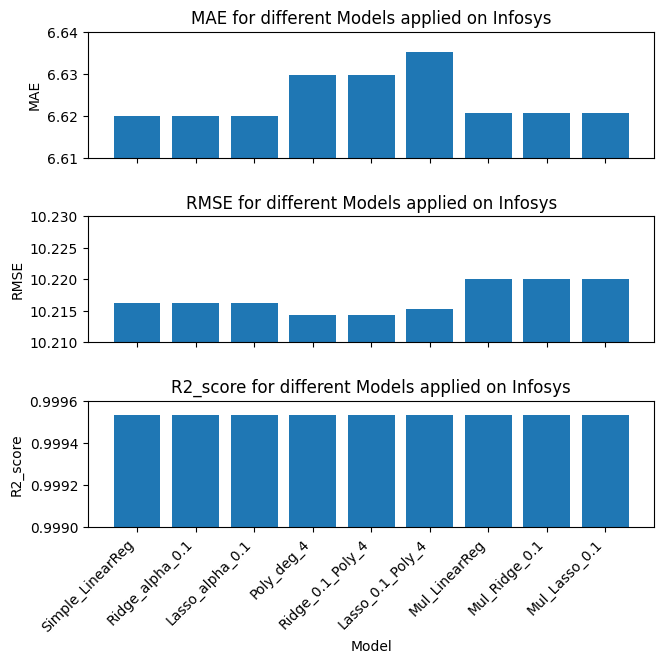

In [284]:
fig,ax=plt.subplots(nrows=3,ncols=1,sharex=True,figsize=(7, 7))
ax[0].bar(info_mae['Models'], info_mae['MAE'])
ax[0].set_xticks(range(len(info_mae['Models'])))  
ax[0].set_xticklabels(info_mae['Models'], rotation=45, ha='right')  
ax[0].set_ylabel('MAE')
ax[0].set_title('MAE for different Models applied on Infosys')
ax[0].set_ylim(6.61, 6.64)

ax[1].bar(info_rmse['Models'], info_rmse['RMSE'])
ax[1].set_xticks(range(len(info_rmse['Models']))) 
ax[1].set_xticklabels(info_rmse['Models'], rotation=45, ha='right')  
ax[1].set_ylabel('RMSE')
ax[1].set_title('RMSE for different Models applied on Infosys')
ax[1].set_ylim(10.21, 10.23)

ax[2].bar(info_r2['Models'], info_r2['R2_score'])
ax[2].set_xticks(range(len(info_r2['Models'])))  
ax[2].set_xticklabels(info_r2['Models'], rotation=45, ha='right') 
ax[2].set_xlabel('Model')
ax[2].set_ylabel('R2_score')
ax[2].set_title('R2_score for different Models applied on Infosys')
ax[2].set_ylim(0.999,0.9996)
plt.tight_layout(pad=2.0)
plt.show()

## ElasticNet

In [285]:
# eln=ElasticNet(alpha=1,l1_ratio=0.5)
# eln.fit(X_train,y_train)

In [286]:
# cdf['coef_elnet']=eln.coef_
# cdf

In [287]:
# eln.intercept_

In [288]:
# pred=eln.predict(X_test)

In [289]:
# print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

In [290]:
# eln_mae=mean_absolute_error(y_test,pred)
# eln_rmse=find_RMSE(pred,y_test)
# eln_r2=r2_score(y_test,pred)

## Comparisons

In [291]:
new_row=pd.DataFrame({
    'Companies' : ['INFY'],
    'Simple_LinearReg' : [lr_mae],
    'Ridge_alpha_0.1' : [rr_mae],
    'Lasso_alpha_0.1' : [lsr_mae],
    'Poly_deg_4' : [poly_mae],
    'Ridge_0.1_Poly_4' : [ridp_mae],
    'Lasso_0.1_Poly_4' : [lsp_mae],
   })
mean_abs_err=pd.concat([mean_abs_err,new_row],ignore_index=True)
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,2.703910,2.703910,2.703907,2.714773,2.714773,2.720406
1,HCL Tech,5.246393,5.246393,5.246396,5.261852,5.261851,5.271076
2,INFY,6.620008,6.620008,6.620010,6.629635,6.629620,6.635311


In [292]:
new_row=pd.DataFrame({
    'Companies' : ['INFY'],
    'Mul_LinearReg' : [mlin_mae],
    'Mul_Ridge_0.1' : [ridm_mae],
    'Mul_Lasso_0.1' : [lso_mae]
    # 'ElasticNet' : [eln_mae]
})
mul_mean_abs_err=pd.concat([mul_mean_abs_err,new_row],ignore_index=True)
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,2.730339,2.730339,2.730348
1,HCL Tech,5.243260,5.243260,5.243263
2,INFY,6.620608,6.620608,6.620608


In [293]:
new_row=pd.DataFrame({
    'Companies' : ['INFY'],
    'Simple_LinearReg' : [lr_rmse],
    'Ridge_alpha_0.1' : [rr_rmse],
    'Lasso_alpha_0.1' : [lsr_rmse],
    'Poly_deg_4' : [poly_rmse],
    'Ridge_0.1_Poly_4' : [ridp_rmse],
    'Lasso_0.1_Poly_4' : [lsp_rmse],
    })
root_mean_sq_err=pd.concat([root_mean_sq_err,new_row],ignore_index=True)
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.862410,3.862410,3.859339
1,HCL Tech,8.427889,8.427889,8.427888,8.455405,8.455404,8.462473
2,INFY,10.216314,10.216314,10.216320,10.214395,10.214364,10.215232


In [294]:
new_row=pd.DataFrame({
    'Companies' : ['INFY'],
    'Mul_LinearReg' : [mlin_rmse],
    'Mul_Ridge_0.1' : [ridm_rmse],
    'Mul_Lasso_0.1' : [lso_rmse]
    # 'ElasticNet' : [eln_rmse]
})
mul_root_mean_sq_err=pd.concat([mul_root_mean_sq_err,new_row],ignore_index=True)
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,3.890457,3.890457,3.890457
1,HCL Tech,8.431783,8.431783,8.431781
2,INFY,10.220077,10.220077,10.220072


In [295]:
new_row=pd.DataFrame({
    'Companies' : ['INFY'],
    'Simple_LinearReg' : [lr_r2],
    'Ridge_alpha_0.1' : [rr_r2],
    'Lasso_alpha_0.1' : [lsr_r2],
    'Poly_deg_4' : [poly_r2],
    'Ridge_0.1_Poly_4' : [ridp_r2],
    'Lasso_0.1_Poly_4' : [lsp_r2],
    })
R2_score=pd.concat([R2_score,new_row],ignore_index=True)
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204,0.999205
1,HCL Tech,0.999546,0.999546,0.999546,0.999543,0.999543,0.999542
2,INFY,0.999534,0.999534,0.999534,0.999534,0.999534,0.999534


In [296]:
new_row=pd.DataFrame({
    'Companies' : ['INFY'],
    'Mul_LinearReg' : [mlin_r2],
    'Mul_Ridge_0.1' : [ridm_r2],
    'Mul_Lasso_0.1' : [lso_r2]
    # 'ElasticNet' : [eln_r2]
})
mul_R2_score=pd.concat([mul_R2_score,new_row],ignore_index=True)
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,0.999192,0.999192,0.999192
1,HCL Tech,0.999545,0.999545,0.999545
2,INFY,0.999534,0.999534,0.999534


## Tech Mahindra

In [297]:
data=pd.read_csv('TECHM.NS.csv')
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2008-01-01,283.000000,289.937500,282.500000,284.937500,217.154358,365616.0
1,2008-01-02,285.000000,287.212494,275.500000,280.987488,214.144012,299552.0
2,2008-01-03,280.000000,287.000000,278.750000,283.137512,215.782578,295284.0
3,2008-01-04,283.250000,286.750000,277.500000,280.000000,213.391434,341468.0
4,2008-01-07,272.500000,278.750000,270.750000,271.362488,206.808670,384676.0
...,...,...,...,...,...,...,...
4065,2024-06-24,1390.000000,1409.000000,1381.000000,1401.699951,1401.699951,1111433.0
4066,2024-06-25,1398.800049,1432.000000,1394.750000,1427.750000,1427.750000,2201375.0
4067,2024-06-26,1432.800049,1434.800049,1410.000000,1413.050049,1413.050049,1565878.0
4068,2024-06-27,1404.349976,1443.800049,1392.000000,1432.250000,1432.250000,4286657.0


In [298]:
data.shape

(4070, 7)

In [299]:
data.isnull().sum()

Date         0
Open         7
High         7
Low          7
Close        7
Adj Close    7
Volume       7
dtype: int64

In [300]:
data=data.dropna()
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [301]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,4063.000000,4063.000000,4063.000000,4063.000000,4063.000000,4.063000e+03
mean,579.381965,587.176551,571.124652,578.959525,511.303136,2.569831e+06
std,390.372804,394.598638,385.711431,390.262286,383.749861,2.604674e+06
min,53.812500,55.825001,51.250000,52.325001,40.701889,0.000000e+00
25%,225.625000,229.337502,221.625000,225.875000,175.630569,1.098220e+06
50%,503.000000,508.549988,496.000000,502.500000,410.250519,2.001200e+06
75%,785.924988,794.000000,775.850006,785.674988,681.557617,3.245442e+06
max,1800.500000,1838.000000,1786.000000,1806.099976,1686.896729,4.109539e+07


In [302]:
df=data.drop(columns=['Date'])
df

,Open,High,Low,Close,Adj Close,Volume
0,283.000000,289.937500,282.500000,284.937500,217.154358,365616.0
1,285.000000,287.212494,275.500000,280.987488,214.144012,299552.0
2,280.000000,287.000000,278.750000,283.137512,215.782578,295284.0
3,283.250000,286.750000,277.500000,280.000000,213.391434,341468.0
4,272.500000,278.750000,270.750000,271.362488,206.808670,384676.0
...,...,...,...,...,...,...
4065,1390.000000,1409.000000,1381.000000,1401.699951,1401.699951,1111433.0
4066,1398.800049,1432.000000,1394.750000,1427.750000,1427.750000,2201375.0
4067,1432.800049,1434.800049,1410.000000,1413.050049,1413.050049,1565878.0
4068,1404.349976,1443.800049,1392.000000,1432.250000,1432.250000,4286657.0


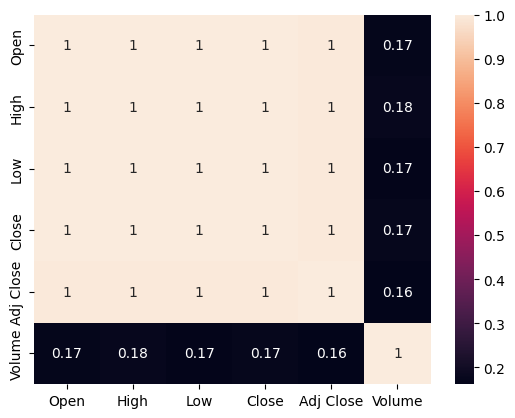

In [303]:
sns.heatmap(df.corr(),annot=True)
plt.show()

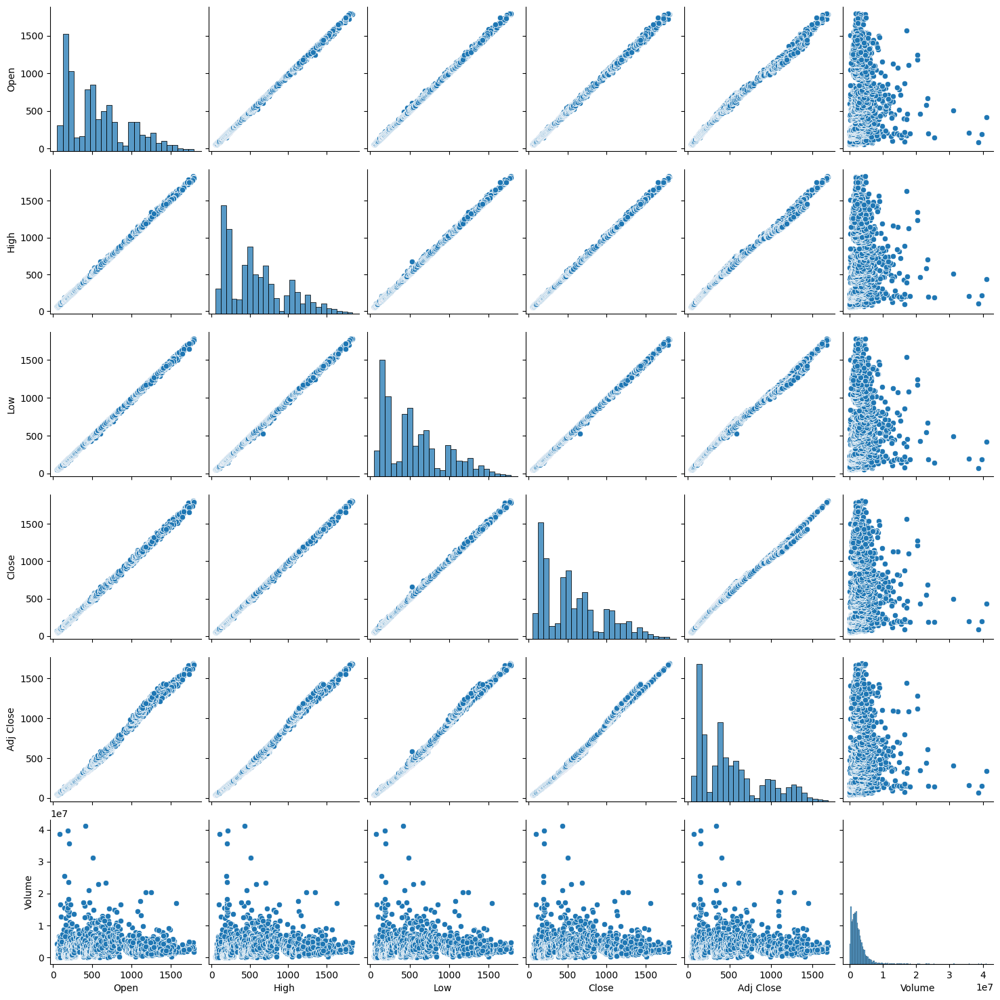

In [304]:
sns.pairplot(df,kind='scatter')
plt.show()

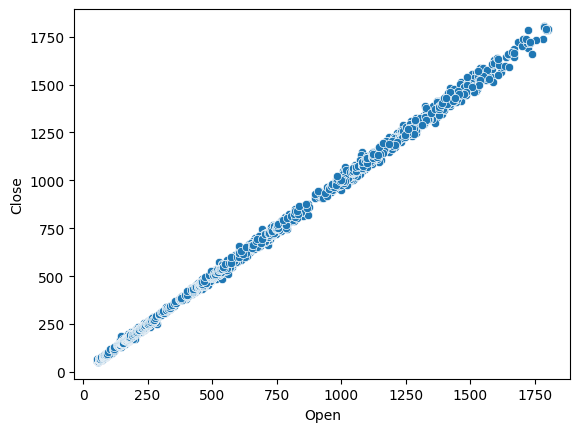

In [305]:
sns.scatterplot(x=df['Open'],y=df['Close'])
plt.show()

## Simple Linear Regression

In [306]:
# independent feature
X=df[['Open']]
X

,Open
0,283.000000
1,285.000000
2,280.000000
3,283.250000
4,272.500000
...,...
4065,1390.000000
4066,1398.800049
4067,1432.800049
4068,1404.349976


In [307]:
# dependent feature
y=df['Close']
y

0        284.937500
1        280.987488
2        283.137512
3        280.000000
4        271.362488
           ...     
4065    1401.699951
4066    1427.750000
4067    1413.050049
4068    1432.250000
4069    1430.349976
Name: Close, Length: 4063, dtype: float64

In [308]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [309]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [310]:
print(f"Coefficient : {lr.coef_}\nintercept : {lr.intercept_}")

Coefficient : [0.99918766]
intercept : 0.010261355155193996


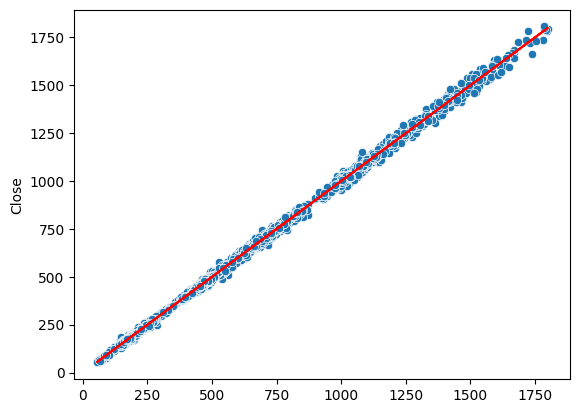

In [311]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),color='red')
plt.show()

In [312]:
pred=lr.predict(X_test)

In [313]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 7.289614893633044
MSE : 122.68373918859389
RMSE : 11.076269190869004
R2 : 0.9992021214489972
Adj R2 : 0.9991997272633474


In [314]:
lr_mae=mean_absolute_error(y_test,pred)
lr_rmse=find_RMSE(pred,y_test)
lr_r2=r2_score(y_test,pred)

## Ridge 

In [315]:
rr=Ridge(alpha=0.1)
rr.fit(X_train,y_train)

Ridge(alpha=0.1)

In [316]:
print(rr.coef_,rr.intercept_)

[0.99918766] 0.010261473051173198


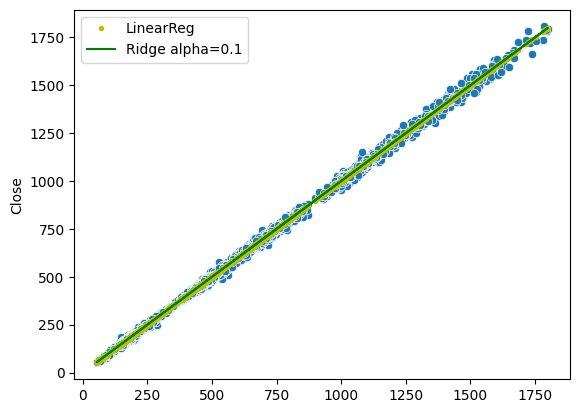

In [317]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'y.',label='LinearReg')
plt.plot(X_val,rr.predict(X_train),color='green',label='Ridge alpha=0.1')
plt.legend()
plt.show()

In [318]:
y_pred=rr.predict(X_test)

In [319]:
print(f"MAE : {mean_absolute_error(y_test,y_pred)}\nMSE : {mean_squared_error(y_test,y_pred)}\nRMSE : {find_RMSE(y_pred,y_test)}\nR2 : {r2_score(y_test,y_pred)}\nAdj R2 : {find_adj_r2(y_pred,y_test)}")

MAE : 7.289614896699773
MSE : 122.68373921736196
RMSE : 11.076269192167638
R2 : 0.9992021214488102
Adj R2 : 0.9991997272628356


In [320]:
rr_mae=mean_absolute_error(y_test,y_pred)
rr_rmse=find_RMSE(y_pred,y_test)
rr_r2=r2_score(y_test,y_pred)

## Lasso

In [321]:
lsr=Lasso(alpha=0.1)
lsr.fit(X_train,y_train)

Lasso(alpha=0.1)

In [322]:
print(lsr.coef_,lsr.intercept_)

[0.999187] 0.010644826554539577


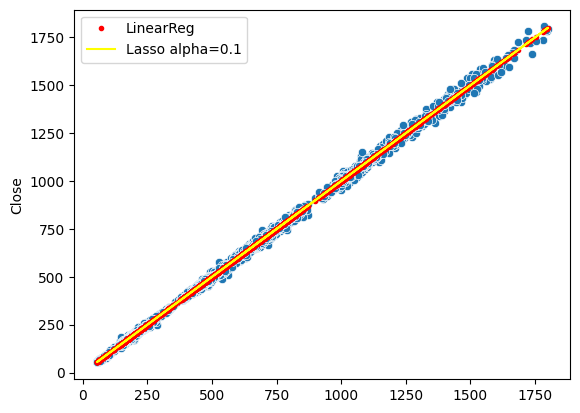

In [323]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'r.',label='LinearReg')
plt.plot(X_val,lsr.predict(X_train),color='yellow',label='Lasso alpha=0.1')
plt.legend()
plt.show()

In [324]:
yl_pred=lsr.predict(X_test)

In [325]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 7.289624868562992
MSE : 122.68383282729404
RMSE : 11.076273417864604
R2 : 0.9992021208400143
Adj R2 : 0.9991997255983528


In [326]:
lsr_mae=mean_absolute_error(y_test,yl_pred)
lsr_rmse=find_RMSE(yl_pred,y_test)
lsr_r2=r2_score(y_test,yl_pred)

## Polynomial of Degree 4

In [327]:
poly=PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X_train)
X_test1=poly.transform(X_test)
poly.fit(X_poly,y_train)
lin=LinearRegression()
lin.fit(X_poly,y_train)

LinearRegression()

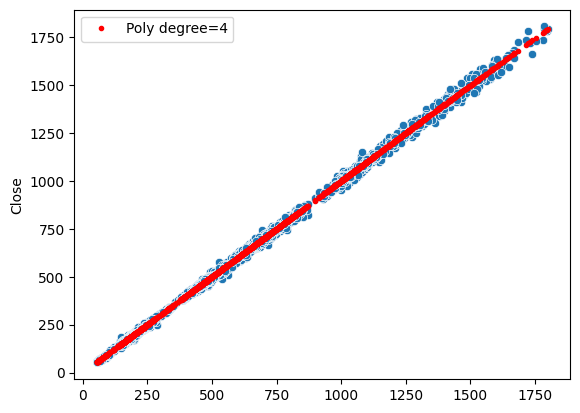

In [328]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'r.',label='Poly degree=4')
plt.legend()
plt.show()

In [329]:
yp_pred=lin.predict(X_test1)

In [330]:
print(f"MAE : {mean_absolute_error(y_test,yp_pred)}\nMSE : {mean_squared_error(y_test,yp_pred)}\nRMSE : {find_RMSE(yp_pred,y_test)}\nR2 : {r2_score(y_test,yp_pred)}\nAdj R2 : {find_adj_r2(yp_pred,y_test)}")

MAE : 7.269142974798417
MSE : 122.01638272942655
RMSE : 11.046102603607597
R2 : 0.9992064616281291
Adj R2 : 0.9992040869752817


In [331]:
poly_mae=mean_absolute_error(y_test,yp_pred)
poly_rmse=find_RMSE(yp_pred,y_test)
poly_r2=r2_score(y_test,yp_pred)

## Ridge on Polynomial of Degree 4

In [332]:
ridp=Ridge(alpha=0.1)
ridp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=1.88676e-29): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Ridge(alpha=0.1)

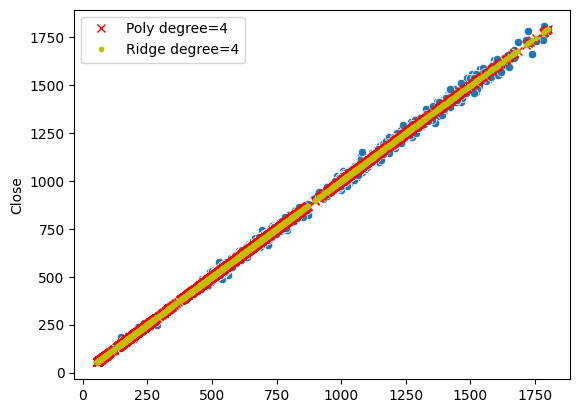

In [333]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'rx',label='Poly degree=4')
plt.plot(X_val,ridp.predict(X_poly),'y.',label='Ridge degree=4')
plt.legend()
plt.show()

In [334]:
yr_pred=ridp.predict(X_test1)

In [335]:
print(f"MAE : {mean_absolute_error(y_test,yr_pred)}\nMSE : {mean_squared_error(y_test,yr_pred)}\nRMSE : {find_RMSE(yr_pred,y_test)}\nR2 : {r2_score(y_test,yr_pred)}\nAdj R2 : {find_adj_r2(yr_pred,y_test)}")

MAE : 7.269135965425689
MSE : 122.0162257084658
RMSE : 11.046095496077598
R2 : 0.9992064626493211
Adj R2 : 0.9992040875738769


In [336]:
ridp_mae=mean_absolute_error(y_test,yr_pred)
ridp_rmse=find_RMSE(yr_pred,y_test)
ridp_r2=r2_score(y_test,yr_pred)

## Lasso on Polynomial of Degree 4

In [337]:
lsp=Lasso(alpha=0.1)
lsp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.194e+05, tolerance: 4.935e+04
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.1)

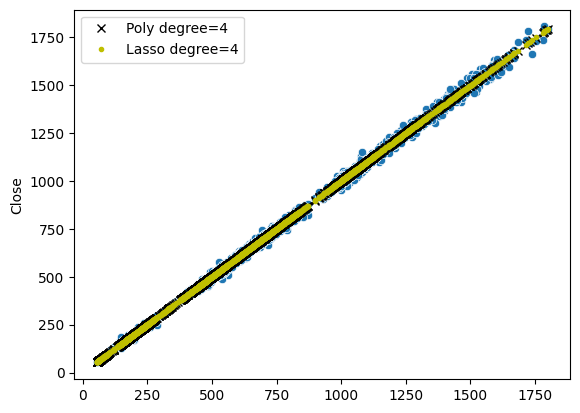

In [338]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'kx',label='Poly degree=4')
plt.plot(X_val,lsp.predict(X_poly),'y.',label='Lasso degree=4')
plt.legend()
plt.show()

In [339]:
yl_pred=lsp.predict(X_test1)

In [340]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 7.26730235354352
MSE : 121.91025397755895
RMSE : 11.041297658226544
R2 : 0.9992071518406651
Adj R2 : 0.999204751110117


In [341]:
lsp_mae=mean_absolute_error(y_test,yl_pred)
lsp_rmse=find_RMSE(yl_pred,y_test)
lsp_r2=r2_score(y_test,yl_pred)

## Multiple Linear Regression

In [342]:
df

,Open,High,Low,Close,Adj Close,Volume
0,283.000000,289.937500,282.500000,284.937500,217.154358,365616.0
1,285.000000,287.212494,275.500000,280.987488,214.144012,299552.0
2,280.000000,287.000000,278.750000,283.137512,215.782578,295284.0
3,283.250000,286.750000,277.500000,280.000000,213.391434,341468.0
4,272.500000,278.750000,270.750000,271.362488,206.808670,384676.0
...,...,...,...,...,...,...
4065,1390.000000,1409.000000,1381.000000,1401.699951,1401.699951,1111433.0
4066,1398.800049,1432.000000,1394.750000,1427.750000,1427.750000,2201375.0
4067,1432.800049,1434.800049,1410.000000,1413.050049,1413.050049,1565878.0
4068,1404.349976,1443.800049,1392.000000,1432.250000,1432.250000,4286657.0


as high and low has high corelation with open so to avoid milticolinearity we will drop the columns high and low and try to train our model using two independent feature open and volume

In [343]:
df.drop(columns=['High','Low','Adj Close'],inplace=True)
df

,Open,Close,Volume
0,283.000000,284.937500,365616.0
1,285.000000,280.987488,299552.0
2,280.000000,283.137512,295284.0
3,283.250000,280.000000,341468.0
4,272.500000,271.362488,384676.0
...,...,...,...
4065,1390.000000,1401.699951,1111433.0
4066,1398.800049,1427.750000,2201375.0
4067,1432.800049,1413.050049,1565878.0
4068,1404.349976,1432.250000,4286657.0


In [344]:
X=df.drop(columns=['Close'])
X

,Open,Volume
0,283.000000,365616.0
1,285.000000,299552.0
2,280.000000,295284.0
3,283.250000,341468.0
4,272.500000,384676.0
...,...,...
4065,1390.000000,1111433.0
4066,1398.800049,2201375.0
4067,1432.800049,1565878.0
4068,1404.349976,4286657.0


In [345]:
y=df['Close']
y

0        284.937500
1        280.987488
2        283.137512
3        280.000000
4        271.362488
           ...     
4065    1401.699951
4066    1427.750000
4067    1413.050049
4068    1432.250000
4069    1430.349976
Name: Close, Length: 4063, dtype: float64

In [346]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [347]:
mlin=LinearRegression()
mlin.fit(X_train,y_train)

LinearRegression()

In [348]:
cdf=pd.DataFrame(mlin.coef_,X.columns,columns=['coef_lin'])
cdf

,coef_lin
Open,9.986678e-01
Volume,4.616514e-07


In [349]:
mlin.intercept_

-0.9023983410047549

In [350]:
pred=mlin.predict(X_test)

In [351]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 7.2319377966331135
MSE : 121.49415850153177
RMSE : 11.022438863587848
R2 : 0.9992098579340536
Adj R2 : 0.999206540392492


In [352]:
mlin_mae=mean_absolute_error(y_test,pred)
mlin_rmse=find_RMSE(pred,y_test)
mlin_r2=r2_score(y_test,pred)

## Applying Ridge Regression on Multiple Linear Regression

In [353]:
ridm=Ridge(alpha=0.1)
ridm.fit(X_train,y_train)

Ridge(alpha=0.1)

In [354]:
cdf['coef_ridge']=ridm.coef_
cdf

,coef_lin,coef_ridge
Open,9.986678e-01,9.986678e-01
Volume,4.616514e-07,4.616514e-07


In [355]:
ridm.intercept_

-0.9023982331386833

In [356]:
pred=ridm.predict(X_test)

In [357]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 7.2319377963679345
MSE : 121.49415852815001
RMSE : 11.022438864795305
R2 : 0.9992098579338805
Adj R2 : 0.9992065403919974


In [358]:
ridm_mae=mean_absolute_error(y_test,pred)
ridm_rmse=find_RMSE(pred,y_test)
ridm_r2=r2_score(y_test,pred)

## Applying Lasso on Multiple Linear Regression

In [359]:
lso=Lasso(alpha=0.1)
lso.fit(X_train,y_train)

Lasso(alpha=0.1)

In [360]:
cdf['coef_lasso']=lso.coef_
cdf

,coef_lin,coef_ridge,coef_lasso
Open,9.986678e-01,9.986678e-01,9.986675e-01
Volume,4.616514e-07,4.616514e-07,4.616584e-07


In [361]:
lso.intercept_

-0.9022484828456072

In [362]:
pred=lso.predict(X_test)

In [363]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 7.231937428395093
MSE : 121.49419548806283
RMSE : 11.022440541371173
R2 : 0.9992098576935102
Adj R2 : 0.9992065397053985


In [364]:
lso_mae=mean_absolute_error(y_test,pred)
lso_rmse=find_RMSE(pred,y_test)
lso_r2=r2_score(y_test,pred)

In [365]:
techm_mae=pd.DataFrame()
techm_mae['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
techm_mae['MAE']=[lr_mae,rr_mae,lsr_mae,poly_mae,ridp_mae,lsp_mae,mlin_mae,ridm_mae,lso_mae]
techm_mae

,Models,MAE
0,Simple_LinearReg,7.289615
1,Ridge_alpha_0.1,7.289615
2,Lasso_alpha_0.1,7.289625
3,Poly_deg_4,7.269143
4,Ridge_0.1_Poly_4,7.269136
5,Lasso_0.1_Poly_4,7.267302
6,Mul_LinearReg,7.231938
7,Mul_Ridge_0.1,7.231938
8,Mul_Lasso_0.1,7.231937


In [366]:
techm_rmse=pd.DataFrame()
techm_rmse['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
techm_rmse['RMSE']=[lr_rmse,rr_rmse,lsr_rmse,poly_rmse,ridp_rmse,lsp_rmse,mlin_rmse,ridm_rmse,lso_rmse]
techm_rmse

,Models,RMSE
0,Simple_LinearReg,11.076269
1,Ridge_alpha_0.1,11.076269
2,Lasso_alpha_0.1,11.076273
3,Poly_deg_4,11.046103
4,Ridge_0.1_Poly_4,11.046095
5,Lasso_0.1_Poly_4,11.041298
6,Mul_LinearReg,11.022439
7,Mul_Ridge_0.1,11.022439
8,Mul_Lasso_0.1,11.022441


In [367]:
techm_r2=pd.DataFrame()
techm_r2['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
techm_r2['R2_score']=[lr_r2,rr_r2,lsr_r2,poly_r2,ridp_r2,lsp_r2,mlin_r2,ridm_r2,lso_r2]
techm_r2

,Models,R2_score
0,Simple_LinearReg,0.999202
1,Ridge_alpha_0.1,0.999202
2,Lasso_alpha_0.1,0.999202
3,Poly_deg_4,0.999206
4,Ridge_0.1_Poly_4,0.999206
5,Lasso_0.1_Poly_4,0.999207
6,Mul_LinearReg,0.999210
7,Mul_Ridge_0.1,0.999210
8,Mul_Lasso_0.1,0.999210


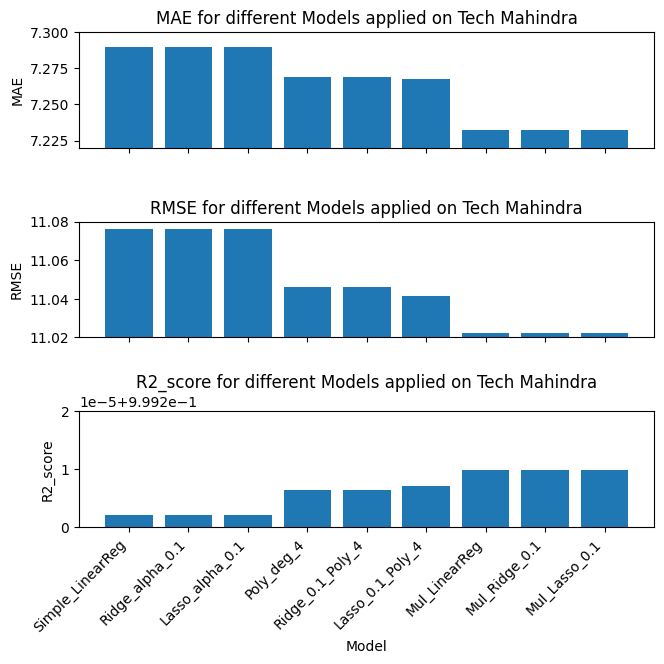

In [368]:
fig,ax=plt.subplots(nrows=3,ncols=1,sharex=True,figsize=(7, 7))
ax[0].bar(techm_mae['Models'], techm_mae['MAE'])
ax[0].set_xticks(range(len(techm_mae['Models'])))  
ax[0].set_xticklabels(techm_mae['Models'], rotation=45, ha='right')  
ax[0].set_ylabel('MAE')
ax[0].set_title('MAE for different Models applied on Tech Mahindra')
ax[0].set_ylim(7.22, 7.3)

ax[1].bar(techm_rmse['Models'], techm_rmse['RMSE'])
ax[1].set_xticks(range(len(techm_rmse['Models']))) 
ax[1].set_xticklabels(techm_rmse['Models'], rotation=45, ha='right')  
ax[1].set_ylabel('RMSE')
ax[1].set_title('RMSE for different Models applied on Tech Mahindra')
ax[1].set_ylim(11.02, 11.08)

ax[2].bar(techm_r2['Models'], techm_r2['R2_score'])
ax[2].set_xticks(range(len(techm_r2['Models'])))  
ax[2].set_xticklabels(techm_r2['Models'], rotation=45, ha='right') 
ax[2].set_xlabel('Model')
ax[2].set_ylabel('R2_score')
ax[2].set_title('R2_score for different Models applied on Tech Mahindra')
ax[2].set_ylim(0.9992,0.99922)
plt.tight_layout(pad=2.0)
plt.show()

## ElasticNet

In [369]:
# eln=ElasticNet(alpha=1,l1_ratio=0.5)
# eln.fit(X_train,y_train)

In [370]:
# cdf['coef_elnet']=eln.coef_
# cdf

In [371]:
# eln.intercept_

In [372]:
# pred=eln.predict(X_test)

In [373]:
# print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

In [374]:
# eln_mae=mean_absolute_error(y_test,pred)
# eln_rmse=find_RMSE(pred,y_test)
# eln_r2=r2_score(y_test,pred)

## Comparisons

In [375]:
new_row=pd.DataFrame({
    'Companies' : ['TECH M'],
    'Simple_LinearReg' : [lr_mae],
    'Ridge_alpha_0.1' : [rr_mae],
    'Lasso_alpha_0.1' : [lsr_mae],
    'Poly_deg_4' : [poly_mae],
    'Ridge_0.1_Poly_4' : [ridp_mae],
    'Lasso_0.1_Poly_4' : [lsp_mae],
   })
mean_abs_err=pd.concat([mean_abs_err,new_row],ignore_index=True)
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,2.703910,2.703910,2.703907,2.714773,2.714773,2.720406
1,HCL Tech,5.246393,5.246393,5.246396,5.261852,5.261851,5.271076
2,INFY,6.620008,6.620008,6.620010,6.629635,6.629620,6.635311
3,TECH M,7.289615,7.289615,7.289625,7.269143,7.269136,7.267302


In [376]:
new_row=pd.DataFrame({
    'Companies' : ['TECH M'],
    'Mul_LinearReg' : [mlin_mae],
    'Mul_Ridge_0.1' : [ridm_mae],
    'Mul_Lasso_0.1' : [lso_mae]
    # 'ElasticNet' : [eln_mae]
})
mul_mean_abs_err=pd.concat([mul_mean_abs_err,new_row],ignore_index=True)
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,2.730339,2.730339,2.730348
1,HCL Tech,5.243260,5.243260,5.243263
2,INFY,6.620608,6.620608,6.620608
3,TECH M,7.231938,7.231938,7.231937


In [377]:
new_row=pd.DataFrame({
    'Companies' : ['TECH M'],
    'Simple_LinearReg' : [lr_rmse],
    'Ridge_alpha_0.1' : [rr_rmse],
    'Lasso_alpha_0.1' : [lsr_rmse],
    'Poly_deg_4' : [poly_rmse],
    'Ridge_0.1_Poly_4' : [ridp_rmse],
    'Lasso_0.1_Poly_4' : [lsp_rmse],
    })
root_mean_sq_err=pd.concat([root_mean_sq_err,new_row],ignore_index=True)
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.862410,3.862410,3.859339
1,HCL Tech,8.427889,8.427889,8.427888,8.455405,8.455404,8.462473
2,INFY,10.216314,10.216314,10.216320,10.214395,10.214364,10.215232
3,TECH M,11.076269,11.076269,11.076273,11.046103,11.046095,11.041298


In [378]:
new_row=pd.DataFrame({
    'Companies' : ['TECH M'],
    'Mul_LinearReg' : [mlin_rmse],
    'Mul_Ridge_0.1' : [ridm_rmse],
    'Mul_Lasso_0.1' : [lso_rmse]
    # 'ElasticNet' : [eln_rmse]
})
mul_root_mean_sq_err=pd.concat([mul_root_mean_sq_err,new_row],ignore_index=True)
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,3.890457,3.890457,3.890457
1,HCL Tech,8.431783,8.431783,8.431781
2,INFY,10.220077,10.220077,10.220072
3,TECH M,11.022439,11.022439,11.022441


In [379]:
new_row=pd.DataFrame({
    'Companies' : ['TECH M'],
    'Simple_LinearReg' : [lr_r2],
    'Ridge_alpha_0.1' : [rr_r2],
    'Lasso_alpha_0.1' : [lsr_r2],
    'Poly_deg_4' : [poly_r2],
    'Ridge_0.1_Poly_4' : [ridp_r2],
    'Lasso_0.1_Poly_4' : [lsp_r2],
    })
R2_score=pd.concat([R2_score,new_row],ignore_index=True)
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204,0.999205
1,HCL Tech,0.999546,0.999546,0.999546,0.999543,0.999543,0.999542
2,INFY,0.999534,0.999534,0.999534,0.999534,0.999534,0.999534
3,TECH M,0.999202,0.999202,0.999202,0.999206,0.999206,0.999207


In [380]:
new_row=pd.DataFrame({
    'Companies' : ['TECH M'],
    'Mul_LinearReg' : [mlin_r2],
    'Mul_Ridge_0.1' : [ridm_r2],
    'Mul_Lasso_0.1' : [lso_r2]
    # 'ElasticNet' : [eln_r2]
})
mul_R2_score=pd.concat([mul_R2_score,new_row],ignore_index=True)
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,0.999192,0.999192,0.999192
1,HCL Tech,0.999545,0.999545,0.999545
2,INFY,0.999534,0.999534,0.999534
3,TECH M,0.999210,0.999210,0.999210


## Coforge

In [381]:
data=pd.read_csv('COFORGE.NS.csv')
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2008-01-01,239.000000,239.449997,236.050003,238.149994,155.017365,208790.0
1,2008-01-02,240.000000,244.699997,239.000000,241.149994,156.970123,413556.0
2,2008-01-03,236.699997,251.399994,236.699997,239.899994,156.156494,1124695.0
3,2008-01-04,240.000000,243.899994,238.050003,239.300003,155.765961,273913.0
4,2008-01-07,238.000000,238.000000,228.100006,231.100006,150.428360,227323.0
...,...,...,...,...,...,...,...
4065,2024-06-24,5380.000000,5434.399902,5333.500000,5351.649902,5351.649902,360743.0
4066,2024-06-25,5360.000000,5398.899902,5311.500000,5350.649902,5350.649902,150871.0
4067,2024-06-26,5395.000000,5462.850098,5305.000000,5325.350098,5325.350098,400431.0
4068,2024-06-27,5376.600098,5454.950195,5300.000000,5439.000000,5439.000000,517602.0


In [382]:
data.shape

(4070, 7)

In [383]:
data.isnull().sum()

Date         0
Open         7
High         7
Low          7
Close        7
Adj Close    7
Volume       7
dtype: int64

In [384]:
data=data.dropna()
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [385]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,4063.000000,4063.000000,4063.000000,4063.000000,4063.000000,4.063000e+03
mean,1390.318903,1413.688077,1366.369540,1389.187646,1320.353961,4.112266e+05
std,1739.045658,1763.338587,1710.342668,1736.074247,1711.151150,7.064999e+05
min,43.500000,44.900002,41.500000,43.299999,29.868832,0.000000e+00
25%,237.000000,242.500000,233.550003,238.000000,188.409958,1.024405e+05
50%,447.000000,456.750000,435.100006,445.799988,392.677612,2.488830e+05
75%,1693.500000,1742.000000,1645.275024,1689.000000,1600.742615,4.670520e+05
max,6754.649902,6847.450195,6590.149902,6754.899902,6726.750488,2.213649e+07


In [386]:
df=data.drop(columns=['Date'])
df

,Open,High,Low,Close,Adj Close,Volume
0,239.000000,239.449997,236.050003,238.149994,155.017365,208790.0
1,240.000000,244.699997,239.000000,241.149994,156.970123,413556.0
2,236.699997,251.399994,236.699997,239.899994,156.156494,1124695.0
3,240.000000,243.899994,238.050003,239.300003,155.765961,273913.0
4,238.000000,238.000000,228.100006,231.100006,150.428360,227323.0
...,...,...,...,...,...,...
4065,5380.000000,5434.399902,5333.500000,5351.649902,5351.649902,360743.0
4066,5360.000000,5398.899902,5311.500000,5350.649902,5350.649902,150871.0
4067,5395.000000,5462.850098,5305.000000,5325.350098,5325.350098,400431.0
4068,5376.600098,5454.950195,5300.000000,5439.000000,5439.000000,517602.0


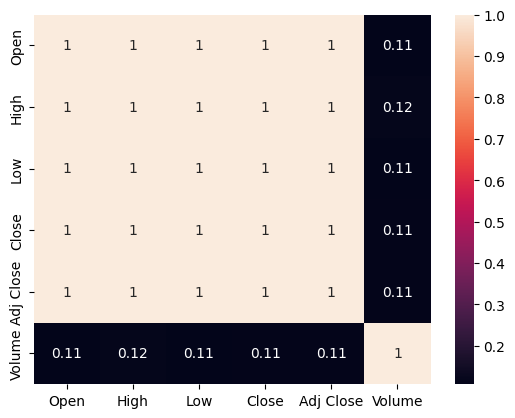

In [387]:
sns.heatmap(df.corr(),annot=True)
plt.show()

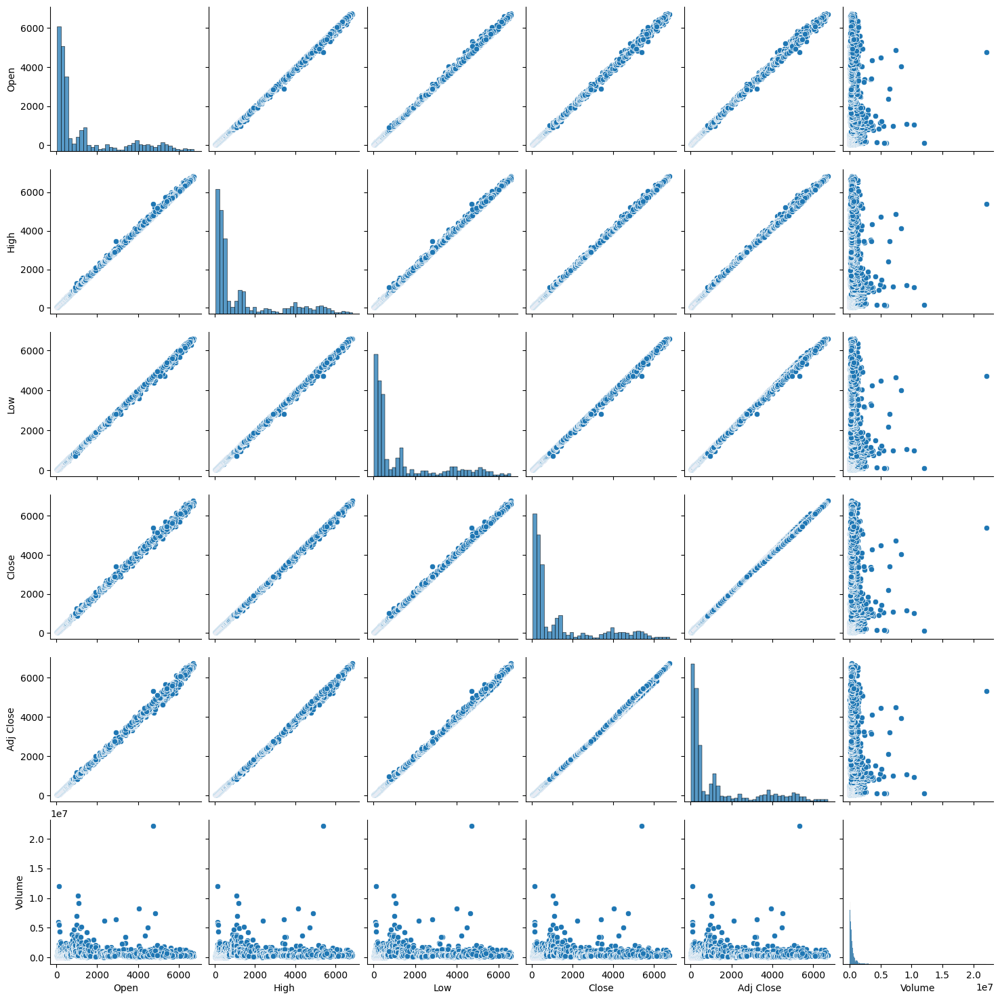

In [388]:
sns.pairplot(df,kind='scatter')
plt.show()

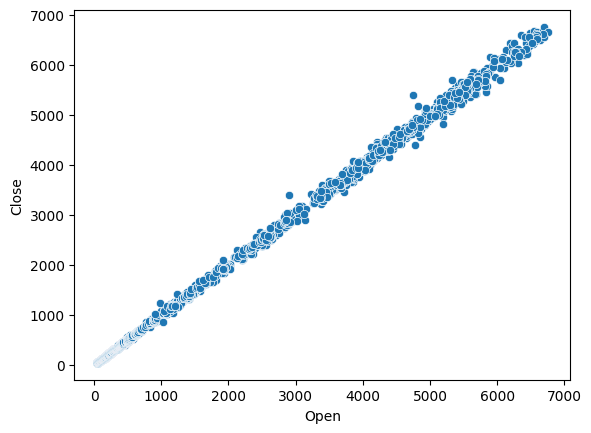

In [389]:
sns.scatterplot(x=df['Open'],y=df['Close'])
plt.show()

In [390]:
# independent feature
X=df[['Open']]
X

,Open
0,239.000000
1,240.000000
2,236.699997
3,240.000000
4,238.000000
...,...
4065,5380.000000
4066,5360.000000
4067,5395.000000
4068,5376.600098


In [391]:
# dependent feature
y=df['Close']
y

0        238.149994
1        241.149994
2        239.899994
3        239.300003
4        231.100006
           ...     
4065    5351.649902
4066    5350.649902
4067    5325.350098
4068    5439.000000
4069    5458.799805
Name: Close, Length: 4063, dtype: float64

## Simple Linear Regression

In [392]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [393]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [394]:
print(f"Coefficient : {lr.coef_}\nintercept : {lr.intercept_}")

Coefficient : [0.99829616]
intercept : 1.5674130322133806


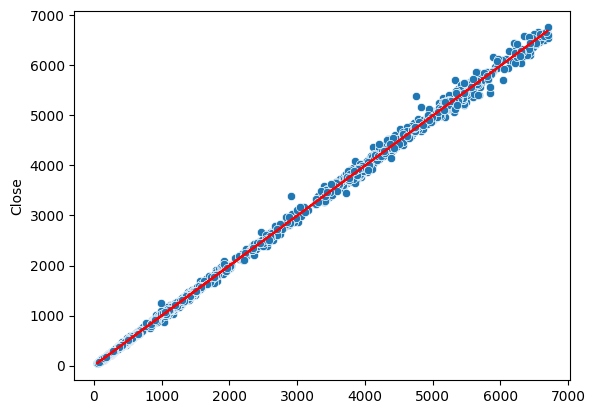

In [395]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),color='red')
plt.show()

In [396]:
pred=lr.predict(X_test)

In [397]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 22.24731689966747
MSE : 2183.754507466624
RMSE : 46.73065918074155
R2 : 0.9992562500909891
Adj R2 : 0.9992576472656498


In [398]:
lr_mae=mean_absolute_error(y_test,pred)
lr_rmse=find_RMSE(pred,y_test)
lr_r2=r2_score(y_test,pred)

## Ridge 

In [399]:
rr=Ridge(alpha=0.1)
rr.fit(X_train,y_train)

Ridge(alpha=0.1)

In [400]:
print(rr.coef_,rr.intercept_)

[0.99829616] 1.567413046394222


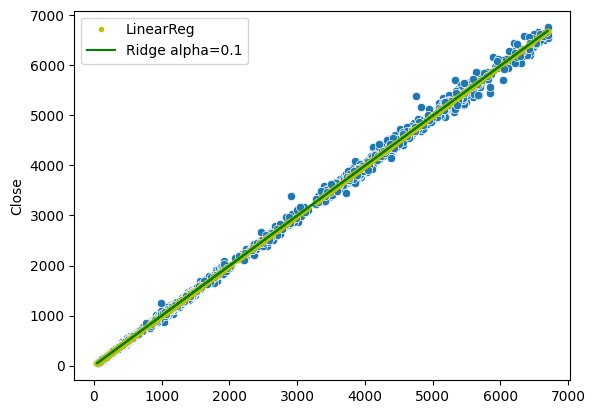

In [401]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'y.',label='LinearReg')
plt.plot(X_val,rr.predict(X_train),color='green',label='Ridge alpha=0.1')
plt.legend()
plt.show()

In [402]:
y_pred=rr.predict(X_test)

In [403]:
print(f"MAE : {mean_absolute_error(y_test,y_pred)}\nMSE : {mean_squared_error(y_test,y_pred)}\nRMSE : {find_RMSE(y_pred,y_test)}\nR2 : {r2_score(y_test,y_pred)}\nAdj R2 : {find_adj_r2(y_pred,y_test)}")

MAE : 22.247316901922467
MSE : 2183.7545073540737
RMSE : 46.7306591795373
R2 : 0.9992562500910274
Adj R2 : 0.999257647265673


In [404]:
rr_mae=mean_absolute_error(y_test,y_pred)
rr_rmse=find_RMSE(y_pred,y_test)
rr_r2=r2_score(y_test,y_pred)

## Lasso

In [405]:
lsr=Lasso(alpha=0.1)
lsr.fit(X_train,y_train)

Lasso(alpha=0.1)

In [406]:
print(lsr.coef_,lsr.intercept_)

[0.99829613] 1.5674592004193073


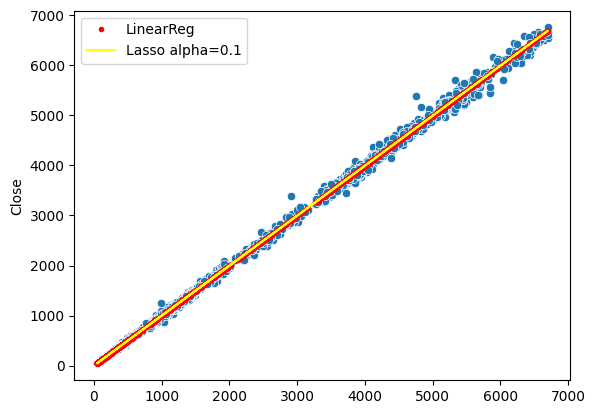

In [407]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'r.',label='LinearReg')
plt.plot(X_val,lsr.predict(X_train),color='yellow',label='Lasso alpha=0.1')
plt.legend()
plt.show()

In [408]:
yl_pred=lsr.predict(X_test)

In [409]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 22.247324241195994
MSE : 2183.754141046095
RMSE : 46.730655260183276
R2 : 0.9992562502157857
Adj R2 : 0.9992576473412854


In [410]:
lsr_mae=mean_absolute_error(y_test,yl_pred)
lsr_rmse=find_RMSE(yl_pred,y_test)
lsr_r2=r2_score(y_test,yl_pred)

## Polynomial of Degree 4

In [411]:
poly=PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X_train)
X_test1=poly.transform(X_test)
poly.fit(X_poly,y_train)
lin=LinearRegression()
lin.fit(X_poly,y_train)

LinearRegression()

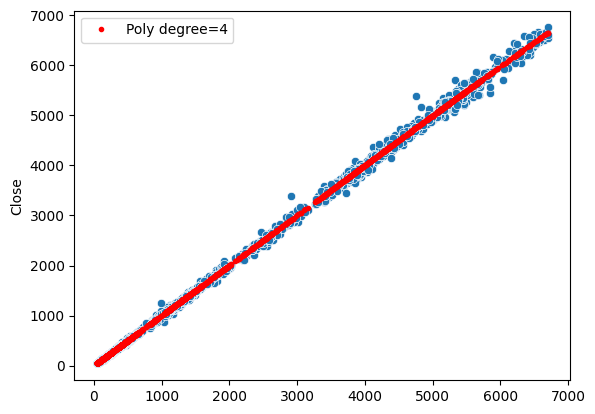

In [412]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'r.',label='Poly degree=4')
plt.legend()
plt.show()

In [413]:
yp_pred=lin.predict(X_test1)

In [414]:
print(f"MAE : {mean_absolute_error(y_test,yp_pred)}\nMSE : {mean_squared_error(y_test,yp_pred)}\nRMSE : {find_RMSE(yp_pred,y_test)}\nR2 : {r2_score(y_test,yp_pred)}\nAdj R2 : {find_adj_r2(yp_pred,y_test)}")

MAE : 21.810073689319037
MSE : 2143.853565518501
RMSE : 46.30176633259795
R2 : 0.9992698396780245
Adj R2 : 0.9992716326502072


In [415]:
poly_mae=mean_absolute_error(y_test,yp_pred)
poly_rmse=find_RMSE(yp_pred,y_test)
poly_r2=r2_score(y_test,yp_pred)

## Ridge Regression on Polynomial of Degree 4

In [416]:
ridp=Ridge(alpha=0.1)
ridp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.38225e-34): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Ridge(alpha=0.1)

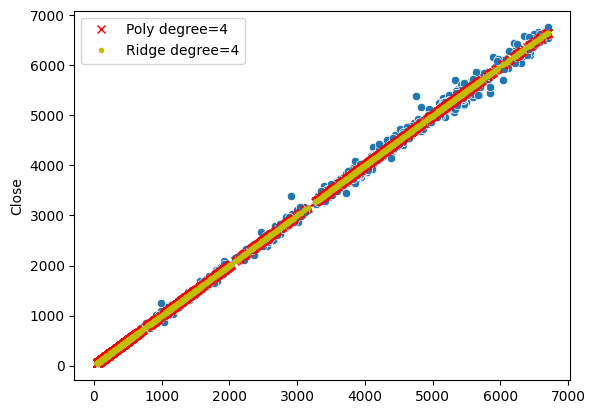

In [417]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'rx',label='Poly degree=4')
plt.plot(X_val,ridp.predict(X_poly),'y.',label='Ridge degree=4')
plt.legend()
plt.show()

In [418]:
yr_pred=ridp.predict(X_test1)

In [419]:
print(f"MAE : {mean_absolute_error(y_test,yr_pred)}\nMSE : {mean_squared_error(y_test,yr_pred)}\nRMSE : {find_RMSE(yr_pred,y_test)}\nR2 : {r2_score(y_test,yr_pred)}\nAdj R2 : {find_adj_r2(yr_pred,y_test)}")

MAE : 21.80927712396082
MSE : 2143.6647049621333
RMSE : 46.29972683463838
R2 : 0.9992699040007408
Adj R2 : 0.9992716935685672


In [420]:
ridp_mae=mean_absolute_error(y_test,yr_pred)
ridp_rmse=find_RMSE(yr_pred,y_test)
ridp_r2=r2_score(y_test,yr_pred)

## Applying Lasso on Polynomial of Degree 4

In [421]:
lsp=Lasso(alpha=0.1)
lsp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.558e+06, tolerance: 9.853e+05
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.1)

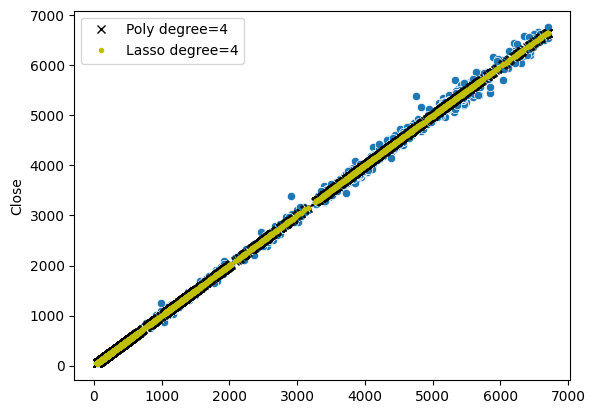

In [422]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'kx',label='Poly degree=4')
plt.plot(X_val,lsp.predict(X_poly),'y.',label='Lasso degree=4')
plt.legend()
plt.show()

In [423]:
yl_pred=lsp.predict(X_test1)

In [424]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 21.83795070758613
MSE : 2142.6421380289944
RMSE : 46.28868261280498
R2 : 0.9992702522697705
Adj R2 : 0.9992720236830309


In [425]:
lsp_mae=mean_absolute_error(y_test,yl_pred)
lsp_rmse=find_RMSE(yl_pred,y_test)
lsp_r2=r2_score(y_test,yl_pred)

## Multiple Linear Regression

In [426]:
df

,Open,High,Low,Close,Adj Close,Volume
0,239.000000,239.449997,236.050003,238.149994,155.017365,208790.0
1,240.000000,244.699997,239.000000,241.149994,156.970123,413556.0
2,236.699997,251.399994,236.699997,239.899994,156.156494,1124695.0
3,240.000000,243.899994,238.050003,239.300003,155.765961,273913.0
4,238.000000,238.000000,228.100006,231.100006,150.428360,227323.0
...,...,...,...,...,...,...
4065,5380.000000,5434.399902,5333.500000,5351.649902,5351.649902,360743.0
4066,5360.000000,5398.899902,5311.500000,5350.649902,5350.649902,150871.0
4067,5395.000000,5462.850098,5305.000000,5325.350098,5325.350098,400431.0
4068,5376.600098,5454.950195,5300.000000,5439.000000,5439.000000,517602.0


In [427]:
df.drop(columns=['High','Low','Adj Close'],inplace=True)
df

,Open,Close,Volume
0,239.000000,238.149994,208790.0
1,240.000000,241.149994,413556.0
2,236.699997,239.899994,1124695.0
3,240.000000,239.300003,273913.0
4,238.000000,231.100006,227323.0
...,...,...,...
4065,5380.000000,5351.649902,360743.0
4066,5360.000000,5350.649902,150871.0
4067,5395.000000,5325.350098,400431.0
4068,5376.600098,5439.000000,517602.0


In [428]:
X=df.drop(columns=['Close'])
X

,Open,Volume
0,239.000000,208790.0
1,240.000000,413556.0
2,236.699997,1124695.0
3,240.000000,273913.0
4,238.000000,227323.0
...,...,...
4065,5380.000000,360743.0
4066,5360.000000,150871.0
4067,5395.000000,400431.0
4068,5376.600098,517602.0


In [429]:
y=df['Close']
y

0        238.149994
1        241.149994
2        239.899994
3        239.300003
4        231.100006
           ...     
4065    5351.649902
4066    5350.649902
4067    5325.350098
4068    5439.000000
4069    5458.799805
Name: Close, Length: 4063, dtype: float64

In [430]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [431]:
mlin=LinearRegression()
mlin.fit(X_train,y_train)

LinearRegression()

In [432]:
cdf=pd.DataFrame(mlin.coef_,X.columns,columns=['coef_lin'])
cdf

,coef_lin
Open,0.997695
Volume,0.000014


In [433]:
mlin.intercept_

-3.4104184917832754

In [434]:
pred=mlin.predict(X_test)

In [435]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 22.244617847409017
MSE : 2139.115865848806
RMSE : 46.25057692449691
R2 : 0.9992714532585283
Adj R2 : 0.9992719467395512


In [436]:
mlin_mae=mean_absolute_error(y_test,pred)
mlin_rmse=find_RMSE(pred,y_test)
mlin_r2=r2_score(y_test,pred)

## Ridge Regression

In [437]:
ridm=Ridge(alpha=0.1)
ridm.fit(X_train,y_train)

Ridge(alpha=0.1)

In [438]:
cdf['coef_ridge']=ridm.coef_
cdf

,coef_lin,coef_ridge
Open,0.997695,0.997695
Volume,0.000014,0.000014


In [439]:
ridm.intercept_

-3.4104184784807785

In [440]:
pred=ridm.predict(X_test)

In [441]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 22.24461784663363
MSE : 2139.1158657356696
RMSE : 46.250576923273826
R2 : 0.9992714532585668
Adj R2 : 0.999271946739575


In [442]:
ridm_mae=mean_absolute_error(y_test,pred)
ridm_rmse=find_RMSE(pred,y_test)
ridm_r2=r2_score(y_test,pred)

## Lasso Regression

In [443]:
lso=Lasso(alpha=0.1)
lso.fit(X_train,y_train)

Lasso(alpha=0.1)

In [444]:
cdf['coef_lasso']=lso.coef_
cdf

,coef_lin,coef_ridge,coef_lasso
Open,0.997695,0.997695,0.997695
Volume,0.000014,0.000014,0.000014


In [445]:
lso.intercept_

-3.41045818954035

In [446]:
pred=lso.predict(X_test)

In [447]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 22.244620153383703
MSE : 2139.1162039824644
RMSE : 46.250580579950174
R2 : 0.9992714531433656
Adj R2 : 0.9992719466684793


In [448]:
lso_mae=mean_absolute_error(y_test,pred)
lso_rmse=find_RMSE(pred,y_test)
lso_r2=r2_score(y_test,pred)

In [449]:
cof_mae=pd.DataFrame()
cof_mae['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
cof_mae['MAE']=[lr_mae,rr_mae,lsr_mae,poly_mae,ridp_mae,lsp_mae,mlin_mae,ridm_mae,lso_mae]
cof_mae

,Models,MAE
0,Simple_LinearReg,22.247317
1,Ridge_alpha_0.1,22.247317
2,Lasso_alpha_0.1,22.247324
3,Poly_deg_4,21.810074
4,Ridge_0.1_Poly_4,21.809277
5,Lasso_0.1_Poly_4,21.837951
6,Mul_LinearReg,22.244618
7,Mul_Ridge_0.1,22.244618
8,Mul_Lasso_0.1,22.244620


In [450]:
cof_rmse=pd.DataFrame()
cof_rmse['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
cof_rmse['RMSE']=[lr_rmse,rr_rmse,lsr_rmse,poly_rmse,ridp_rmse,lsp_rmse,mlin_rmse,ridm_rmse,lso_rmse]
cof_rmse

,Models,RMSE
0,Simple_LinearReg,46.730659
1,Ridge_alpha_0.1,46.730659
2,Lasso_alpha_0.1,46.730655
3,Poly_deg_4,46.301766
4,Ridge_0.1_Poly_4,46.299727
5,Lasso_0.1_Poly_4,46.288683
6,Mul_LinearReg,46.250577
7,Mul_Ridge_0.1,46.250577
8,Mul_Lasso_0.1,46.250581


In [451]:
cof_r2=pd.DataFrame()
cof_r2['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
cof_r2['R2_score']=[lr_r2,rr_r2,lsr_r2,poly_r2,ridp_r2,lsp_r2,mlin_r2,ridm_r2,lso_r2]
cof_r2

,Models,R2_score
0,Simple_LinearReg,0.999256
1,Ridge_alpha_0.1,0.999256
2,Lasso_alpha_0.1,0.999256
3,Poly_deg_4,0.999270
4,Ridge_0.1_Poly_4,0.999270
5,Lasso_0.1_Poly_4,0.999270
6,Mul_LinearReg,0.999271
7,Mul_Ridge_0.1,0.999271
8,Mul_Lasso_0.1,0.999271


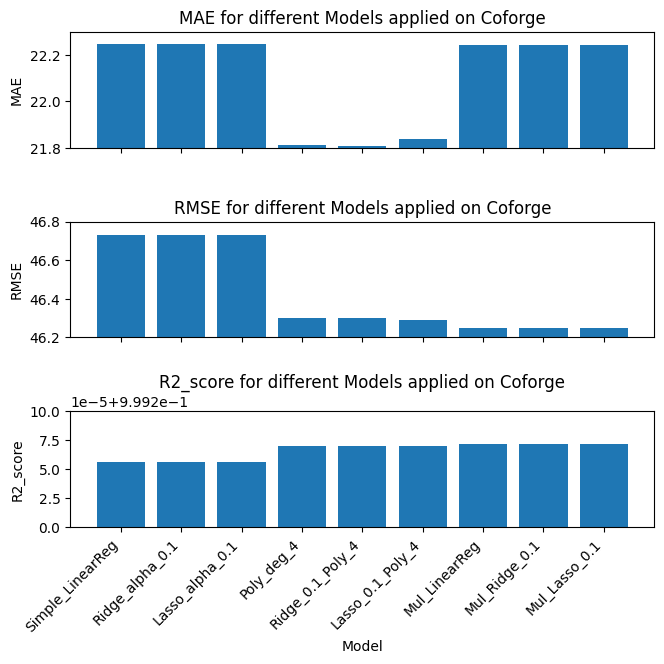

In [452]:
fig,ax=plt.subplots(nrows=3,ncols=1,sharex=True,figsize=(7, 7))
ax[0].bar(cof_mae['Models'], cof_mae['MAE'])
ax[0].set_xticks(range(len(cof_mae['Models'])))  
ax[0].set_xticklabels(cof_mae['Models'], rotation=45, ha='right')  
ax[0].set_ylabel('MAE')
ax[0].set_title('MAE for different Models applied on Coforge')
ax[0].set_ylim(21.8, 22.3)

ax[1].bar(cof_rmse['Models'], cof_rmse['RMSE'])
ax[1].set_xticks(range(len(cof_rmse['Models']))) 
ax[1].set_xticklabels(cof_rmse['Models'], rotation=45, ha='right')  
ax[1].set_ylabel('RMSE')
ax[1].set_title('RMSE for different Models applied on Coforge')
ax[1].set_ylim(46.2, 46.8)

ax[2].bar(cof_r2['Models'], cof_r2['R2_score'])
ax[2].set_xticks(range(len(cof_r2['Models'])))  
ax[2].set_xticklabels(cof_r2['Models'], rotation=45, ha='right') 
ax[2].set_xlabel('Model')
ax[2].set_ylabel('R2_score')
ax[2].set_title('R2_score for different Models applied on Coforge')
ax[2].set_ylim(0.9992,0.9993)
plt.tight_layout(pad=2.0)
plt.show()

## ElasticNet

In [453]:
# eln=ElasticNet(alpha=1,l1_ratio=0.5)
# eln.fit(X_train,y_train)

In [454]:
# cdf['coef_elnet']=eln.coef_
# cdf

In [455]:
# eln.intercept_

In [456]:
# pred=eln.predict(X_test)

In [457]:
# print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

In [458]:
# eln_mae=mean_absolute_error(y_test,pred)
# eln_rmse=find_RMSE(pred,y_test)
# eln_r2=r2_score(y_test,pred)

## Comparisons

In [459]:
new_row=pd.DataFrame({
    'Companies' : ['Coforge'],
    'Simple_LinearReg' : [lr_mae],
    'Ridge_alpha_0.1' : [rr_mae],
    'Lasso_alpha_0.1' : [lsr_mae],
    'Poly_deg_4' : [poly_mae],
    'Ridge_0.1_Poly_4' : [ridp_mae],
    'Lasso_0.1_Poly_4' : [lsp_mae],
   })
mean_abs_err=pd.concat([mean_abs_err,new_row],ignore_index=True)
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,2.703910,2.703910,2.703907,2.714773,2.714773,2.720406
1,HCL Tech,5.246393,5.246393,5.246396,5.261852,5.261851,5.271076
2,INFY,6.620008,6.620008,6.620010,6.629635,6.629620,6.635311
3,TECH M,7.289615,7.289615,7.289625,7.269143,7.269136,7.267302
4,Coforge,22.247317,22.247317,22.247324,21.810074,21.809277,21.837951


In [460]:
new_row=pd.DataFrame({
    'Companies' : ['Coforge'],
    'Mul_LinearReg' : [mlin_mae],
    'Mul_Ridge_0.1' : [ridm_mae],
    'Mul_Lasso_0.1' : [lso_mae]
    # 'ElasticNet' : [eln_mae]
})
mul_mean_abs_err=pd.concat([mul_mean_abs_err,new_row],ignore_index=True)
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,2.730339,2.730339,2.730348
1,HCL Tech,5.243260,5.243260,5.243263
2,INFY,6.620608,6.620608,6.620608
3,TECH M,7.231938,7.231938,7.231937
4,Coforge,22.244618,22.244618,22.244620


In [461]:
new_row=pd.DataFrame({
    'Companies' : ['Coforge'],
    'Simple_LinearReg' : [lr_rmse],
    'Ridge_alpha_0.1' : [rr_rmse],
    'Lasso_alpha_0.1' : [lsr_rmse],
    'Poly_deg_4' : [poly_rmse],
    'Ridge_0.1_Poly_4' : [ridp_rmse],
    'Lasso_0.1_Poly_4' : [lsp_rmse],
    })
root_mean_sq_err=pd.concat([root_mean_sq_err,new_row],ignore_index=True)
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.862410,3.862410,3.859339
1,HCL Tech,8.427889,8.427889,8.427888,8.455405,8.455404,8.462473
2,INFY,10.216314,10.216314,10.216320,10.214395,10.214364,10.215232
3,TECH M,11.076269,11.076269,11.076273,11.046103,11.046095,11.041298
4,Coforge,46.730659,46.730659,46.730655,46.301766,46.299727,46.288683


In [462]:
new_row=pd.DataFrame({
    'Companies' : ['Coforge'],
    'Mul_LinearReg' : [mlin_rmse],
    'Mul_Ridge_0.1' : [ridm_rmse],
    'Mul_Lasso_0.1' : [lso_rmse]
    # 'ElasticNet' : [eln_rmse]
})
mul_root_mean_sq_err=pd.concat([mul_root_mean_sq_err,new_row],ignore_index=True)
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,3.890457,3.890457,3.890457
1,HCL Tech,8.431783,8.431783,8.431781
2,INFY,10.220077,10.220077,10.220072
3,TECH M,11.022439,11.022439,11.022441
4,Coforge,46.250577,46.250577,46.250581


In [463]:
new_row=pd.DataFrame({
    'Companies' : ['Coforge'],
    'Simple_LinearReg' : [lr_r2],
    'Ridge_alpha_0.1' : [rr_r2],
    'Lasso_alpha_0.1' : [lsr_r2],
    'Poly_deg_4' : [poly_r2],
    'Ridge_0.1_Poly_4' : [ridp_r2],
    'Lasso_0.1_Poly_4' : [lsp_r2],
    })
R2_score=pd.concat([R2_score,new_row],ignore_index=True)
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204,0.999205
1,HCL Tech,0.999546,0.999546,0.999546,0.999543,0.999543,0.999542
2,INFY,0.999534,0.999534,0.999534,0.999534,0.999534,0.999534
3,TECH M,0.999202,0.999202,0.999202,0.999206,0.999206,0.999207
4,Coforge,0.999256,0.999256,0.999256,0.999270,0.999270,0.999270


In [464]:
new_row=pd.DataFrame({
    'Companies' : ['Coforge'],
    'Mul_LinearReg' : [mlin_r2],
    'Mul_Ridge_0.1' : [ridm_r2],
    'Mul_Lasso_0.1' : [lso_r2]
    # 'ElasticNet' : [eln_r2]
})
mul_R2_score=pd.concat([mul_R2_score,new_row],ignore_index=True)
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,0.999192,0.999192,0.999192
1,HCL Tech,0.999545,0.999545,0.999545
2,INFY,0.999534,0.999534,0.999534
3,TECH M,0.999210,0.999210,0.999210
4,Coforge,0.999271,0.999271,0.999271


## LTTS

In [465]:
data=pd.read_csv('LTTS.NS.csv')
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2016-10-03,847.500000,852.049988,840.099976,846.650024,773.337830,66731
1,2016-10-04,844.950012,847.500000,830.150024,833.500000,761.326355,82996
2,2016-10-05,833.000000,836.700012,823.750000,826.849976,755.252197,56541
3,2016-10-06,827.500000,844.000000,827.500000,840.599976,767.811646,88139
4,2016-10-07,842.500000,846.599976,830.099976,832.599976,760.504395,38794
...,...,...,...,...,...,...,...
1905,2024-06-24,4885.500000,4886.899902,4800.049805,4824.299805,4824.299805,109072
1906,2024-06-25,4827.750000,4893.200195,4827.750000,4834.850098,4834.850098,93194
1907,2024-06-26,4855.850098,4869.950195,4825.000000,4845.700195,4845.700195,142353
1908,2024-06-27,4863.950195,4937.950195,4824.549805,4894.549805,4894.549805,284254


In [466]:
data.shape

(1910, 7)

In [467]:
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [468]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1910.000000,1910.000000,1910.000000,1910.000000,1910.000000,1.910000e+03
mean,2540.598665,2577.947776,2499.396960,2537.172775,2456.509643,1.935584e+05
std,1518.558720,1536.518189,1494.931813,1515.471650,1514.044053,2.557030e+05
min,718.000000,724.900024,712.250000,717.049988,657.377319,2.334000e+03
25%,1323.212494,1344.925018,1295.075043,1317.512512,1229.396088,6.420925e+04
50%,1712.625000,1739.949951,1684.500000,1709.325012,1611.481262,1.328300e+05
75%,3830.750000,3877.212463,3778.787476,3823.962524,3742.145935,2.463892e+05
max,5914.000000,5955.500000,5800.100098,5916.299805,5789.784180,5.851312e+06


In [469]:
df=data.drop(columns=['Date'])
df

,Open,High,Low,Close,Adj Close,Volume
0,847.500000,852.049988,840.099976,846.650024,773.337830,66731
1,844.950012,847.500000,830.150024,833.500000,761.326355,82996
2,833.000000,836.700012,823.750000,826.849976,755.252197,56541
3,827.500000,844.000000,827.500000,840.599976,767.811646,88139
4,842.500000,846.599976,830.099976,832.599976,760.504395,38794
...,...,...,...,...,...,...
1905,4885.500000,4886.899902,4800.049805,4824.299805,4824.299805,109072
1906,4827.750000,4893.200195,4827.750000,4834.850098,4834.850098,93194
1907,4855.850098,4869.950195,4825.000000,4845.700195,4845.700195,142353
1908,4863.950195,4937.950195,4824.549805,4894.549805,4894.549805,284254


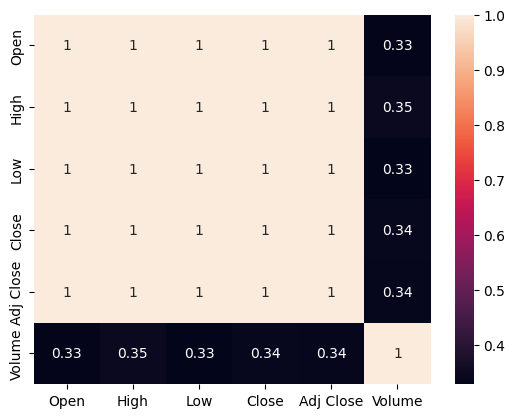

In [470]:
sns.heatmap(df.corr(),annot=True)
plt.show()

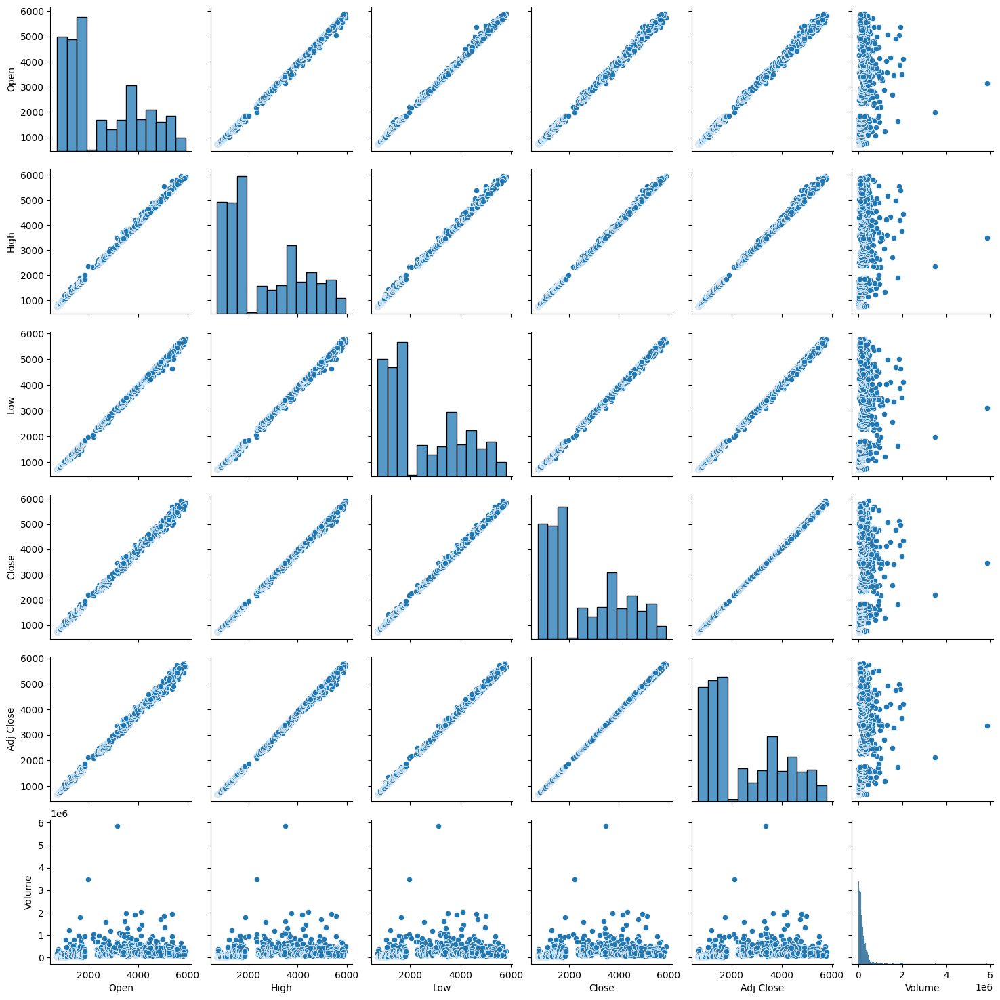

In [471]:
sns.pairplot(df)
plt.show()

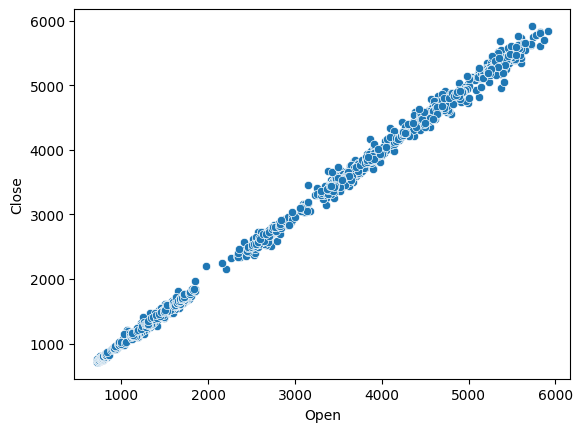

In [472]:
sns.scatterplot(x=df['Open'],y=df['Close'])
plt.show()

In [473]:
# independent feature
X=df[['Open']]
X

,Open
0,847.500000
1,844.950012
2,833.000000
3,827.500000
4,842.500000
...,...
1905,4885.500000
1906,4827.750000
1907,4855.850098
1908,4863.950195


In [474]:
# dependent feature
y=df['Close']
y

0        846.650024
1        833.500000
2        826.849976
3        840.599976
4        832.599976
           ...     
1905    4824.299805
1906    4834.850098
1907    4845.700195
1908    4894.549805
1909    4909.049805
Name: Close, Length: 1910, dtype: float64

## Simple Linear Regression

In [475]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [476]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [477]:
print(f"Coefficient : {lr.coef_}\nintercept : {lr.intercept_}")

Coefficient : [0.99659828]
intercept : 4.63341064186443


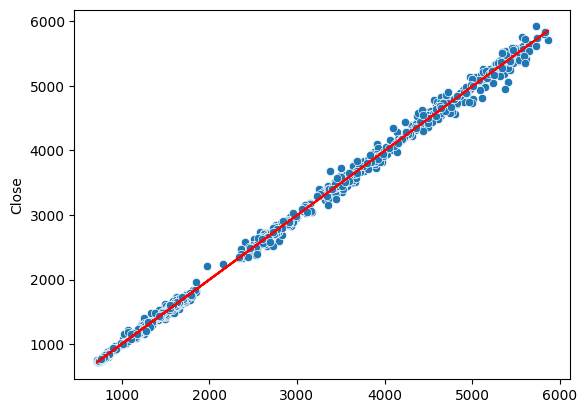

In [478]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),color='red')
plt.show()

In [479]:
pred=lr.predict(X_test)

In [480]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 37.35429643578502
MSE : 3595.914281030108
RMSE : 59.96594267607329
R2 : 0.998477764808582
Adj R2 : 0.9984616405979945


In [481]:
lr_mae=mean_absolute_error(y_test,pred)
lr_rmse=find_RMSE(pred,y_test)
lr_r2=r2_score(y_test,pred)

## Ridge

In [482]:
rr=Ridge(alpha=0.1)
rr.fit(X_train,y_train)

Ridge(alpha=0.1)

In [483]:
print(rr.coef_,rr.intercept_)

[0.99659828] 4.633410714251113


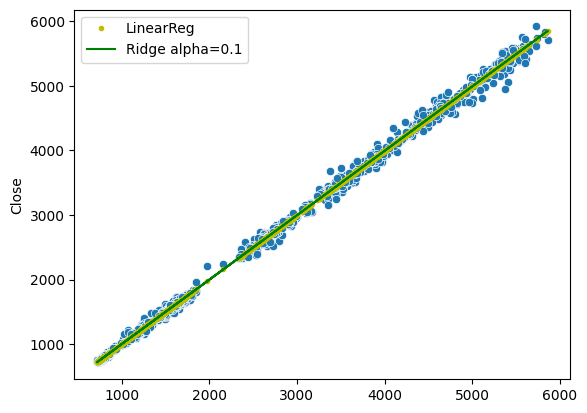

In [484]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'y.',label='LinearReg')
plt.plot(X_val,rr.predict(X_train),color='green',label='Ridge alpha=0.1')
plt.legend()
plt.show()

In [485]:
y_pred=rr.predict(X_test)

In [486]:
print(f"MAE : {mean_absolute_error(y_test,y_pred)}\nMSE : {mean_squared_error(y_test,y_pred)}\nRMSE : {find_RMSE(y_pred,y_test)}\nR2 : {r2_score(y_test,y_pred)}\nAdj R2 : {find_adj_r2(y_pred,y_test)}")

MAE : 37.3542964389924
MSE : 3595.914281457319
RMSE : 59.965942679635404
R2 : 0.9984777648084011
Adj R2 : 0.9984616405977237


In [487]:
rr_mae=mean_absolute_error(y_test,y_pred)
rr_rmse=find_RMSE(y_pred,y_test)
rr_r2=r2_score(y_test,y_pred)

## Lasso

In [488]:
lsr=Lasso(alpha=0.1)
lsr.fit(X_train,y_train)

Lasso(alpha=0.1)

In [489]:
print(lsr.coef_,lsr.intercept_)

[0.99659823] 4.633521630443738


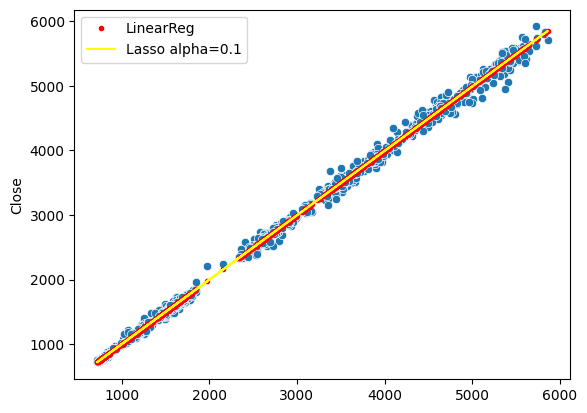

In [490]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'r.',label='LinearReg')
plt.plot(X_val,lsr.predict(X_train),color='yellow',label='Lasso alpha=0.1')
plt.legend()
plt.show()

In [491]:
yl_pred=lsr.predict(X_test)

In [492]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 37.354301353601514
MSE : 3595.9149360723636
RMSE : 59.96594813785874
R2 : 0.9984777645312872
Adj R2 : 0.9984616401830123


In [493]:
lsr_mae=mean_absolute_error(y_test,yl_pred)
lsr_rmse=find_RMSE(yl_pred,y_test)
lsr_r2=r2_score(y_test,yl_pred)

## Polynomial of Degree 4

In [494]:
poly=PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X_train)
X_test1=poly.transform(X_test)
poly.fit(X_poly,y_train)
lin=LinearRegression()
lin.fit(X_poly,y_train)

LinearRegression()

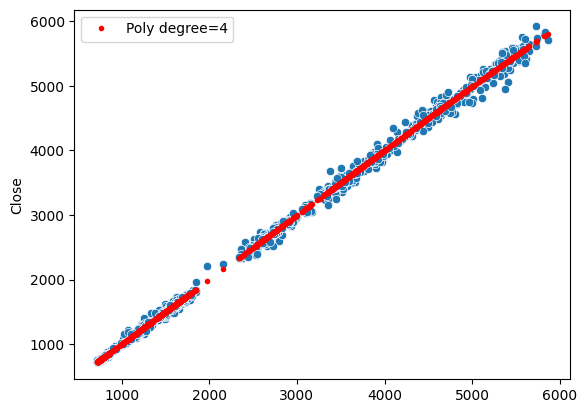

In [495]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'r.',label='Poly degree=4')
plt.legend()
plt.show()

In [496]:
yp_pred=lin.predict(X_test1)

In [497]:
print(f"MAE : {mean_absolute_error(y_test,yp_pred)}\nMSE : {mean_squared_error(y_test,yp_pred)}\nRMSE : {find_RMSE(yp_pred,y_test)}\nR2 : {r2_score(y_test,yp_pred)}\nAdj R2 : {find_adj_r2(yp_pred,y_test)}")

MAE : 37.48364513378191
MSE : 3604.4991400769827
RMSE : 60.0374811270175
R2 : 0.998474130635592
Adj R2 : 0.9984574917914641


In [498]:
poly_mae=mean_absolute_error(y_test,yp_pred)
poly_rmse=find_RMSE(yp_pred,y_test)
poly_r2=r2_score(y_test,yp_pred)

## Ridge on Polynomial of Degree 4

In [499]:
ridp=Ridge(alpha=0.1)
ridp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=1.03174e-33): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Ridge(alpha=0.1)

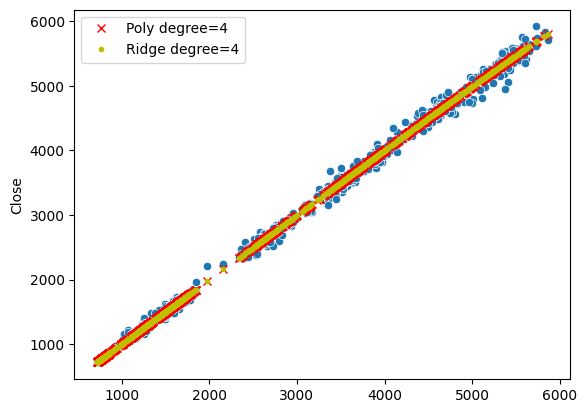

In [500]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'rx',label='Poly degree=4')
plt.plot(X_val,ridp.predict(X_poly),'y.',label='Ridge degree=4')
plt.legend()
plt.show()

In [501]:
yr_pred=ridp.predict(X_test1)

In [502]:
print(f"MAE : {mean_absolute_error(y_test,yr_pred)}\nMSE : {mean_squared_error(y_test,yr_pred)}\nRMSE : {find_RMSE(yr_pred,y_test)}\nR2 : {r2_score(y_test,yr_pred)}\nAdj R2 : {find_adj_r2(yr_pred,y_test)}")

MAE : 37.48283734796443
MSE : 3604.2441874703477
RMSE : 60.03535781079636
R2 : 0.998474238563034
Adj R2 : 0.9984576330847588


In [503]:
ridp_mae=mean_absolute_error(y_test,yr_pred)
ridp_rmse=find_RMSE(yr_pred,y_test)
ridp_r2=r2_score(y_test,yr_pred)

## Lasso on Polynomial of Degree 4

In [504]:
lsp=Lasso(alpha=0.1)
lsp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.444e+06, tolerance: 3.482e+05
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.1)

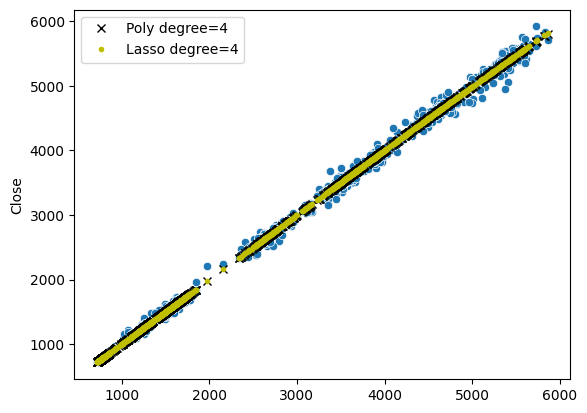

In [505]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'kx',label='Poly degree=4')
plt.plot(X_val,lsp.predict(X_poly),'y.',label='Lasso degree=4')
plt.legend()
plt.show()

In [506]:
yl_pred=lsp.predict(X_test1)

In [507]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 37.438587809928976
MSE : 3597.6352778049672
RMSE : 59.980290744585155
R2 : 0.9984770362701213
Adj R2 : 0.9984605969864354


In [508]:
lsp_mae=mean_absolute_error(y_test,yl_pred)
lsp_rmse=find_RMSE(yl_pred,y_test)
lsp_r2=r2_score(y_test,yl_pred)

## Multiple Linear Regression

In [509]:
df

,Open,High,Low,Close,Adj Close,Volume
0,847.500000,852.049988,840.099976,846.650024,773.337830,66731
1,844.950012,847.500000,830.150024,833.500000,761.326355,82996
2,833.000000,836.700012,823.750000,826.849976,755.252197,56541
3,827.500000,844.000000,827.500000,840.599976,767.811646,88139
4,842.500000,846.599976,830.099976,832.599976,760.504395,38794
...,...,...,...,...,...,...
1905,4885.500000,4886.899902,4800.049805,4824.299805,4824.299805,109072
1906,4827.750000,4893.200195,4827.750000,4834.850098,4834.850098,93194
1907,4855.850098,4869.950195,4825.000000,4845.700195,4845.700195,142353
1908,4863.950195,4937.950195,4824.549805,4894.549805,4894.549805,284254


In [510]:
df.drop(columns=['High','Low','Adj Close'],inplace=True)
df

,Open,Close,Volume
0,847.500000,846.650024,66731
1,844.950012,833.500000,82996
2,833.000000,826.849976,56541
3,827.500000,840.599976,88139
4,842.500000,832.599976,38794
...,...,...,...
1905,4885.500000,4824.299805,109072
1906,4827.750000,4834.850098,93194
1907,4855.850098,4845.700195,142353
1908,4863.950195,4894.549805,284254


In [511]:
X=df.drop(columns=['Close'])
X

,Open,Volume
0,847.500000,66731
1,844.950012,82996
2,833.000000,56541
3,827.500000,88139
4,842.500000,38794
...,...,...
1905,4885.500000,109072
1906,4827.750000,93194
1907,4855.850098,142353
1908,4863.950195,284254


In [512]:
y=df['Close']
y

0        846.650024
1        833.500000
2        826.849976
3        840.599976
4        832.599976
           ...     
1905    4824.299805
1906    4834.850098
1907    4845.700195
1908    4894.549805
1909    4909.049805
Name: Close, Length: 1910, dtype: float64

In [513]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [514]:
mlin=LinearRegression()
mlin.fit(X_train,y_train)

LinearRegression()

In [515]:
cdf=pd.DataFrame(mlin.coef_,X.columns,columns=['coef_lin'])
cdf

,coef_lin
Open,0.994527
Volume,0.000036


In [516]:
mlin.intercept_

2.9368640597017475

In [517]:
pred=mlin.predict(X_test)

In [518]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 36.18069832397579
MSE : 3146.315709511592
RMSE : 56.092028930246336
R2 : 0.9986680904710115
Adj R2 : 0.9986501260531


In [519]:
mlin_mae=mean_absolute_error(y_test,pred)
mlin_rmse=find_RMSE(pred,y_test)
mlin_r2=r2_score(y_test,pred)

## Applying Ridge Regression on Multiple Linear Regression

In [520]:
ridm=Ridge(alpha=0.1)
ridm.fit(X_train,y_train)

Ridge(alpha=0.1)

In [521]:
cdf['coef_ridge']=ridm.coef_
cdf

,coef_lin,coef_ridge
Open,0.994527,0.994527
Volume,0.000036,0.000036


In [522]:
ridm.intercept_

2.9368641278470022

In [523]:
pred=ridm.predict(X_test)

In [524]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 36.18069832314929
MSE : 3146.3157092630554
RMSE : 56.0920289280309
R2 : 0.9986680904711167
Adj R2 : 0.9986501260531291


In [525]:
ridm_mae=mean_absolute_error(y_test,pred)
ridm_rmse=find_RMSE(pred,y_test)
ridm_r2=r2_score(y_test,pred)

## Applying Lasso Regression on Multiple Loinear Regression

In [526]:
lso=Lasso(alpha=0.1)
lso.fit(X_train,y_train)

Lasso(alpha=0.1)

In [527]:
cdf['coef_lasso']=lso.coef_
cdf

,coef_lin,coef_ridge,coef_lasso
Open,0.994527,0.994527,0.994527
Volume,0.000036,0.000036,0.000036


In [528]:
lso.intercept_

2.936921486659685

In [529]:
pred=lso.predict(X_test)

In [530]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 36.18069769787491
MSE : 3146.3155192454096
RMSE : 56.092027234228304
R2 : 0.9986680905515557
Adj R2 : 0.99865012606958


In [531]:
lso_mae=mean_absolute_error(y_test,pred)
lso_rmse=find_RMSE(pred,y_test)
lso_r2=r2_score(y_test,pred)

In [532]:
ltts_mae=pd.DataFrame()
ltts_mae['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
ltts_mae['MAE']=[lr_mae,rr_mae,lsr_mae,poly_mae,ridp_mae,lsp_mae,mlin_mae,ridm_mae,lso_mae]
ltts_mae

,Models,MAE
0,Simple_LinearReg,37.354296
1,Ridge_alpha_0.1,37.354296
2,Lasso_alpha_0.1,37.354301
3,Poly_deg_4,37.483645
4,Ridge_0.1_Poly_4,37.482837
5,Lasso_0.1_Poly_4,37.438588
6,Mul_LinearReg,36.180698
7,Mul_Ridge_0.1,36.180698
8,Mul_Lasso_0.1,36.180698


In [533]:
ltts_rmse=pd.DataFrame()
ltts_rmse['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
ltts_rmse['RMSE']=[lr_rmse,rr_rmse,lsr_rmse,poly_rmse,ridp_rmse,lsp_rmse,mlin_rmse,ridm_rmse,lso_rmse]
ltts_rmse

,Models,RMSE
0,Simple_LinearReg,59.965943
1,Ridge_alpha_0.1,59.965943
2,Lasso_alpha_0.1,59.965948
3,Poly_deg_4,60.037481
4,Ridge_0.1_Poly_4,60.035358
5,Lasso_0.1_Poly_4,59.980291
6,Mul_LinearReg,56.092029
7,Mul_Ridge_0.1,56.092029
8,Mul_Lasso_0.1,56.092027


In [534]:
ltts_r2=pd.DataFrame()
ltts_r2['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
ltts_r2['R2_score']=[lr_r2,rr_r2,lsr_r2,poly_r2,ridp_r2,lsp_r2,mlin_r2,ridm_r2,lso_r2]
ltts_r2

,Models,R2_score
0,Simple_LinearReg,0.998478
1,Ridge_alpha_0.1,0.998478
2,Lasso_alpha_0.1,0.998478
3,Poly_deg_4,0.998474
4,Ridge_0.1_Poly_4,0.998474
5,Lasso_0.1_Poly_4,0.998477
6,Mul_LinearReg,0.998668
7,Mul_Ridge_0.1,0.998668
8,Mul_Lasso_0.1,0.998668


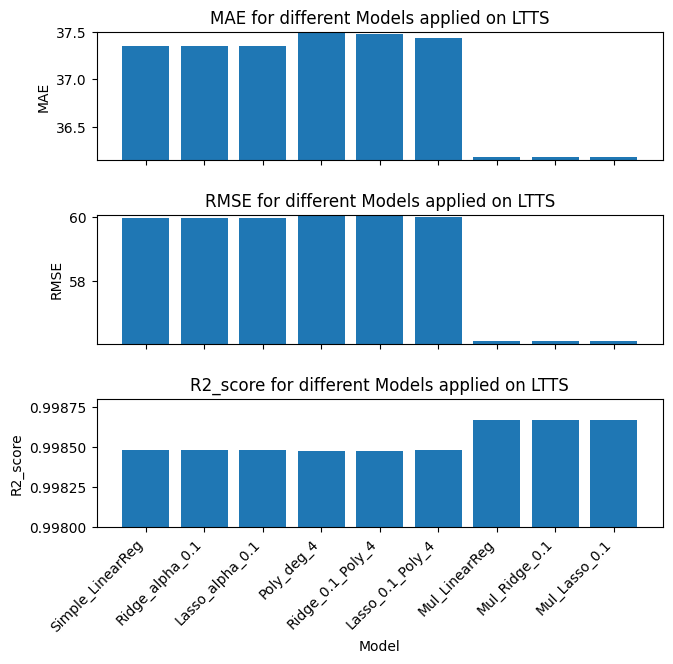

In [535]:
fig,ax=plt.subplots(nrows=3,ncols=1,sharex=True,figsize=(7, 7))
ax[0].bar(ltts_mae['Models'], ltts_mae['MAE'])
ax[0].set_xticks(range(len(ltts_mae['Models'])))  
ax[0].set_xticklabels(ltts_mae['Models'], rotation=45, ha='right')  
ax[0].set_ylabel('MAE')
ax[0].set_title('MAE for different Models applied on LTTS')
ax[0].set_ylim(36.15, 37.5)

ax[1].bar(ltts_rmse['Models'], ltts_rmse['RMSE'])
ax[1].set_xticks(range(len(ltts_rmse['Models']))) 
ax[1].set_xticklabels(ltts_rmse['Models'], rotation=45, ha='right')  
ax[1].set_ylabel('RMSE')
ax[1].set_title('RMSE for different Models applied on LTTS')
ax[1].set_ylim(56.02, 60.05)

ax[2].bar(ltts_r2['Models'], ltts_r2['R2_score'])
ax[2].set_xticks(range(len(ltts_r2['Models'])))  
ax[2].set_xticklabels(ltts_r2['Models'], rotation=45, ha='right') 
ax[2].set_xlabel('Model')
ax[2].set_ylabel('R2_score')
ax[2].set_title('R2_score for different Models applied on LTTS')
ax[2].set_ylim(0.998,0.9988)
plt.tight_layout(pad=2.0)
plt.show()

## ElasticNet

In [536]:
# eln=ElasticNet(alpha=1,l1_ratio=0.5)
# eln.fit(X_train,y_train)

In [537]:
# cdf['coef_elnet']=eln.coef_
# cdf

In [538]:
# eln.intercept_

In [539]:
# pred=eln.predict(X_test)

In [540]:
# print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

In [541]:
# eln_mae=mean_absolute_error(y_test,pred)
# eln_rmse=find_RMSE(pred,y_test)
# eln_r2=r2_score(y_test,pred)

## Comparison

In [542]:
new_row=pd.DataFrame({
    'Companies' : ['LTTS'],
    'Simple_LinearReg' : [lr_mae],
    'Ridge_alpha_0.1' : [rr_mae],
    'Lasso_alpha_0.1' : [lsr_mae],
    'Poly_deg_4' : [poly_mae],
    'Ridge_0.1_Poly_4' : [ridp_mae],
    'Lasso_0.1_Poly_4' : [lsp_mae],
   })
mean_abs_err=pd.concat([mean_abs_err,new_row],ignore_index=True)
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,2.703910,2.703910,2.703907,2.714773,2.714773,2.720406
1,HCL Tech,5.246393,5.246393,5.246396,5.261852,5.261851,5.271076
2,INFY,6.620008,6.620008,6.620010,6.629635,6.629620,6.635311
3,TECH M,7.289615,7.289615,7.289625,7.269143,7.269136,7.267302
4,Coforge,22.247317,22.247317,22.247324,21.810074,21.809277,21.837951
5,LTTS,37.354296,37.354296,37.354301,37.483645,37.482837,37.438588


In [543]:
new_row=pd.DataFrame({
    'Companies' : ['LTTS'],
    'Mul_LinearReg' : [mlin_mae],
    'Mul_Ridge_0.1' : [ridm_mae],
    'Mul_Lasso_0.1' : [lso_mae]
    # 'ElasticNet' : [eln_mae]
})
mul_mean_abs_err=pd.concat([mul_mean_abs_err,new_row],ignore_index=True)
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,2.730339,2.730339,2.730348
1,HCL Tech,5.243260,5.243260,5.243263
2,INFY,6.620608,6.620608,6.620608
3,TECH M,7.231938,7.231938,7.231937
4,Coforge,22.244618,22.244618,22.244620
5,LTTS,36.180698,36.180698,36.180698


In [544]:
new_row=pd.DataFrame({
    'Companies' : ['LTTS'],
    'Simple_LinearReg' : [lr_rmse],
    'Ridge_alpha_0.1' : [rr_rmse],
    'Lasso_alpha_0.1' : [lsr_rmse],
    'Poly_deg_4' : [poly_rmse],
    'Ridge_0.1_Poly_4' : [ridp_rmse],
    'Lasso_0.1_Poly_4' : [lsp_rmse],
    })
root_mean_sq_err=pd.concat([root_mean_sq_err,new_row],ignore_index=True)
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.862410,3.862410,3.859339
1,HCL Tech,8.427889,8.427889,8.427888,8.455405,8.455404,8.462473
2,INFY,10.216314,10.216314,10.216320,10.214395,10.214364,10.215232
3,TECH M,11.076269,11.076269,11.076273,11.046103,11.046095,11.041298
4,Coforge,46.730659,46.730659,46.730655,46.301766,46.299727,46.288683
5,LTTS,59.965943,59.965943,59.965948,60.037481,60.035358,59.980291


In [545]:
new_row=pd.DataFrame({
    'Companies' : ['LTTS'],
    'Mul_LinearReg' : [mlin_rmse],
    'Mul_Ridge_0.1' : [ridm_rmse],
    'Mul_Lasso_0.1' : [lso_rmse]
    # 'ElasticNet' : [eln_rmse]
})
mul_root_mean_sq_err=pd.concat([mul_root_mean_sq_err,new_row],ignore_index=True)
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,3.890457,3.890457,3.890457
1,HCL Tech,8.431783,8.431783,8.431781
2,INFY,10.220077,10.220077,10.220072
3,TECH M,11.022439,11.022439,11.022441
4,Coforge,46.250577,46.250577,46.250581
5,LTTS,56.092029,56.092029,56.092027


In [546]:
new_row=pd.DataFrame({
    'Companies' : ['LTTS'],
    'Simple_LinearReg' : [lr_r2],
    'Ridge_alpha_0.1' : [rr_r2],
    'Lasso_alpha_0.1' : [lsr_r2],
    'Poly_deg_4' : [poly_r2],
    'Ridge_0.1_Poly_4' : [ridp_r2],
    'Lasso_0.1_Poly_4' : [lsp_r2],
    })
R2_score=pd.concat([R2_score,new_row],ignore_index=True)
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204,0.999205
1,HCL Tech,0.999546,0.999546,0.999546,0.999543,0.999543,0.999542
2,INFY,0.999534,0.999534,0.999534,0.999534,0.999534,0.999534
3,TECH M,0.999202,0.999202,0.999202,0.999206,0.999206,0.999207
4,Coforge,0.999256,0.999256,0.999256,0.999270,0.999270,0.999270
5,LTTS,0.998478,0.998478,0.998478,0.998474,0.998474,0.998477


In [547]:
new_row=pd.DataFrame({
    'Companies' : ['LTTS'],
    'Mul_LinearReg' : [mlin_r2],
    'Mul_Ridge_0.1' : [ridm_r2],
    'Mul_Lasso_0.1' : [lso_r2]
    # 'ElasticNet' : [eln_r2]
})
mul_R2_score=pd.concat([mul_R2_score,new_row],ignore_index=True)
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,0.999192,0.999192,0.999192
1,HCL Tech,0.999545,0.999545,0.999545
2,INFY,0.999534,0.999534,0.999534
3,TECH M,0.999210,0.999210,0.999210
4,Coforge,0.999271,0.999271,0.999271
5,LTTS,0.998668,0.998668,0.998668


## LTIM

In [548]:
data=pd.read_csv('LTIM.NS.csv')
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2016-10-03,619.950012,627.950012,619.950012,622.900024,549.175598,48049
1,2016-10-04,623.900024,625.400024,617.000000,618.250000,545.075989,60276
2,2016-10-05,619.200012,625.400024,614.500000,615.549988,542.695557,115421
3,2016-10-06,617.799988,619.950012,614.049988,614.750000,541.990173,53393
4,2016-10-07,615.950012,618.700012,611.099976,612.349976,539.874268,44229
...,...,...,...,...,...,...,...
1905,2024-06-24,5100.000000,5149.950195,5060.000000,5111.200195,5111.200195,258477
1906,2024-06-25,5111.250000,5135.000000,5070.450195,5123.850098,5123.850098,179424
1907,2024-06-26,5155.000000,5190.000000,5136.100098,5177.500000,5177.500000,401368
1908,2024-06-27,5181.000000,5389.950195,5125.000000,5377.049805,5377.049805,1326532


In [549]:
data.shape

(1910, 7)

In [550]:
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [551]:
df=data.drop(columns=['Date'])
df

,Open,High,Low,Close,Adj Close,Volume
0,619.950012,627.950012,619.950012,622.900024,549.175598,48049
1,623.900024,625.400024,617.000000,618.250000,545.075989,60276
2,619.200012,625.400024,614.500000,615.549988,542.695557,115421
3,617.799988,619.950012,614.049988,614.750000,541.990173,53393
4,615.950012,618.700012,611.099976,612.349976,539.874268,44229
...,...,...,...,...,...,...
1905,5100.000000,5149.950195,5060.000000,5111.200195,5111.200195,258477
1906,5111.250000,5135.000000,5070.450195,5123.850098,5123.850098,179424
1907,5155.000000,5190.000000,5136.100098,5177.500000,5177.500000,401368
1908,5181.000000,5389.950195,5125.000000,5377.049805,5377.049805,1326532


In [552]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1910.000000,1910.000000,1910.000000,1910.000000,1910.000000,1.910000e+03
mean,3097.198825,3141.206735,3050.106909,3094.485050,2972.904354,2.820947e+05
std,1889.405304,1910.611668,1860.197026,1884.456218,1866.106682,3.355216e+05
min,602.200012,605.000000,598.000000,600.500000,532.203857,0.000000e+00
25%,1580.662506,1612.500000,1552.149963,1583.900024,1467.405243,9.128825e+04
50%,2451.599976,2498.449951,2408.575074,2452.025024,2326.232666,2.137840e+05
75%,4774.487671,4821.500000,4715.000000,4768.499878,4662.965942,3.565920e+05
max,7550.000000,7588.799805,7436.100098,7561.750000,7286.800293,5.781528e+06


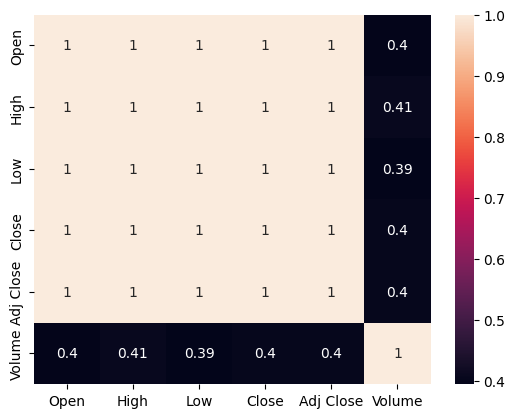

In [553]:
sns.heatmap(df.corr(),annot=True)
plt.show()

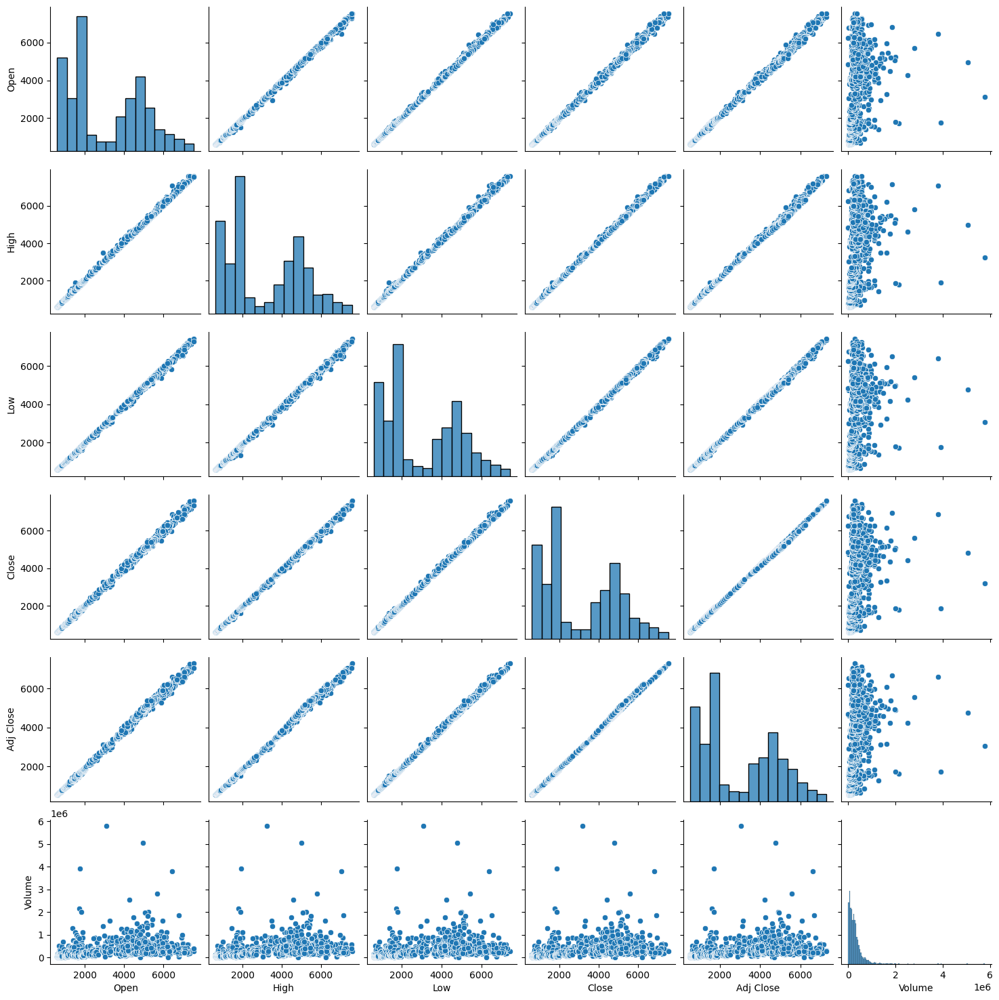

In [554]:
sns.pairplot(df)
plt.show()

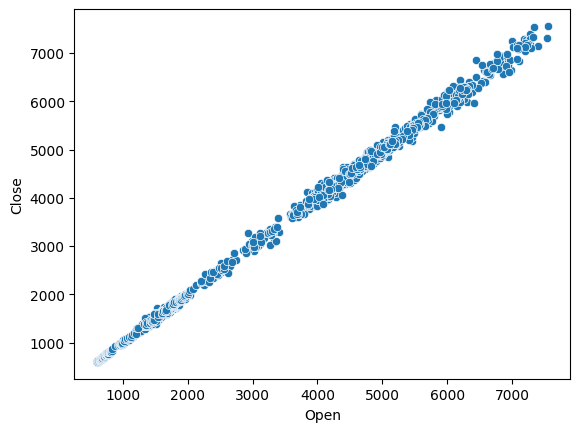

In [555]:
sns.scatterplot(x=df['Open'],y=df['Close'])
plt.show()

In [556]:
# independent feature
X=df[['Open']]
X

,Open
0,619.950012
1,623.900024
2,619.200012
3,617.799988
4,615.950012
...,...
1905,5100.000000
1906,5111.250000
1907,5155.000000
1908,5181.000000


In [557]:
# dependent feature
y=df['Close']
y

0        622.900024
1        618.250000
2        615.549988
3        614.750000
4        612.349976
           ...     
1905    5111.200195
1906    5123.850098
1907    5177.500000
1908    5377.049805
1909    5385.049805
Name: Close, Length: 1910, dtype: float64

## Simple Linear Regression

In [558]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [559]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [560]:
print(f"Coefficient : {lr.coef_}\nintercept : {lr.intercept_}")

Coefficient : [0.99708033]
intercept : 7.147515342991028


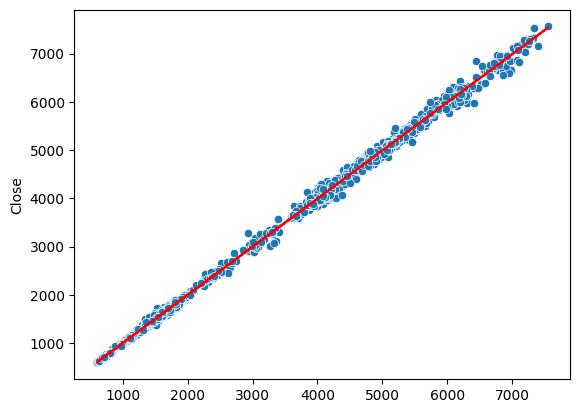

In [561]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),color='red')
plt.show()

In [562]:
pred=lr.predict(X_test)

In [563]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 39.835657493127606
MSE : 3983.133440888417
RMSE : 63.11207048487965
R2 : 0.9988968764953801
Adj R2 : 0.9988967224769297


In [564]:
lr_mae=mean_absolute_error(y_test,pred)
lr_rmse=find_RMSE(pred,y_test)
lr_r2=r2_score(y_test,pred)

## Ridge

In [565]:
rr=Ridge(alpha=0.1)
rr.fit(X_train,y_train)

Ridge(alpha=0.1)

In [566]:
print(rr.coef_,rr.intercept_)

[0.99708033] 7.147515399992699


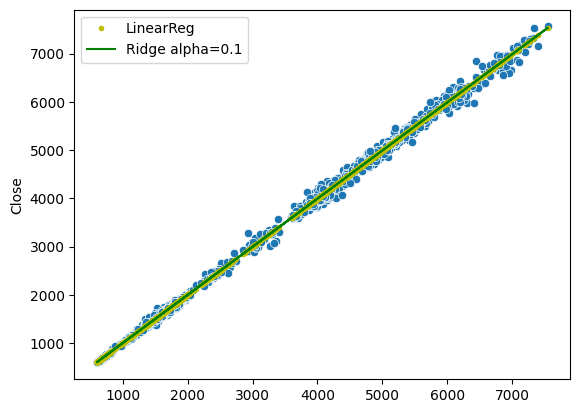

In [567]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'y.',label='LinearReg')
plt.plot(X_val,rr.predict(X_train),color='green',label='Ridge alpha=0.1')
plt.legend()
plt.show()

In [568]:
y_pred=rr.predict(X_test)

In [569]:
print(f"MAE : {mean_absolute_error(y_test,y_pred)}\nMSE : {mean_squared_error(y_test,y_pred)}\nRMSE : {find_RMSE(y_pred,y_test)}\nR2 : {r2_score(y_test,y_pred)}\nAdj R2 : {find_adj_r2(y_pred,y_test)}")

MAE : 39.83565749475576
MSE : 3983.1334406522
RMSE : 63.11207048300824
R2 : 0.9988968764954456
Adj R2 : 0.9988967224769544


In [570]:
rr_mae=mean_absolute_error(y_test,y_pred)
rr_rmse=find_RMSE(y_pred,y_test)
rr_r2=r2_score(y_test,y_pred)

## Lasso

In [571]:
lsr=Lasso(alpha=0.1)
lsr.fit(X_train,y_train)

Lasso(alpha=0.1)

In [572]:
print(lsr.coef_,lsr.intercept_)

[0.9970803] 7.147602700418702


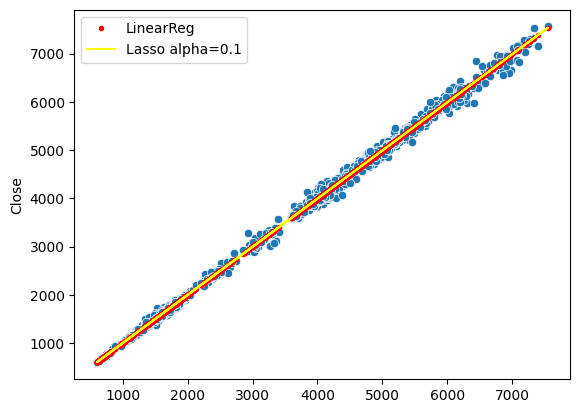

In [573]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'r.',label='LinearReg')
plt.plot(X_val,lsr.predict(X_train),color='yellow',label='Lasso alpha=0.1')
plt.legend()
plt.show()

In [574]:
yl_pred=lsr.predict(X_test)

In [575]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 39.83565998839053
MSE : 3983.1330788886826
RMSE : 63.112067616967536
R2 : 0.9988968765956354
Adj R2 : 0.9988967225148545


In [576]:
lsr_mae=mean_absolute_error(y_test,yl_pred)
lsr_rmse=find_RMSE(yl_pred,y_test)
lsr_r2=r2_score(y_test,yl_pred)

## Polynomial of Degree 4

In [577]:
poly=PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X_train)
X_test1=poly.transform(X_test)
poly.fit(X_poly,y_train)
lin=LinearRegression()
lin.fit(X_poly,y_train)

LinearRegression()

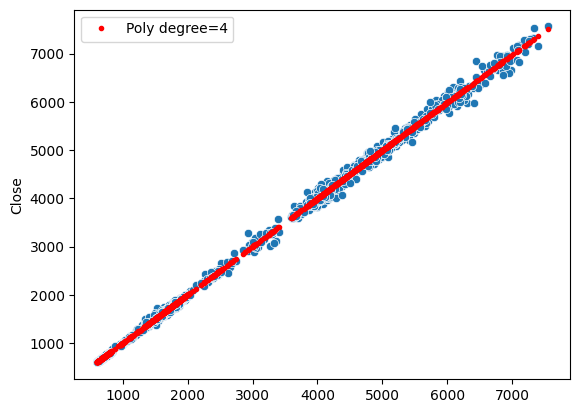

In [578]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'r.',label='Poly degree=4')
plt.legend()
plt.show()

In [579]:
yp_pred=lin.predict(X_test1)

In [580]:
print(f"MAE : {mean_absolute_error(y_test,yp_pred)}\nMSE : {mean_squared_error(y_test,yp_pred)}\nRMSE : {find_RMSE(yp_pred,y_test)}\nR2 : {r2_score(y_test,yp_pred)}\nAdj R2 : {find_adj_r2(yp_pred,y_test)}")

MAE : 39.68208555930815
MSE : 3948.5719743358163
RMSE : 62.83766366070445
R2 : 0.998906448247538
Adj R2 : 0.9989059403554416


In [581]:
poly_mae=mean_absolute_error(y_test,yp_pred)
poly_rmse=find_RMSE(yp_pred,y_test)
poly_r2=r2_score(y_test,yp_pred)

## Ridge on Polynomial of Degree 4

In [582]:
ridp=Ridge(alpha=0.1)
ridp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=2.36202e-34): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Ridge(alpha=0.1)

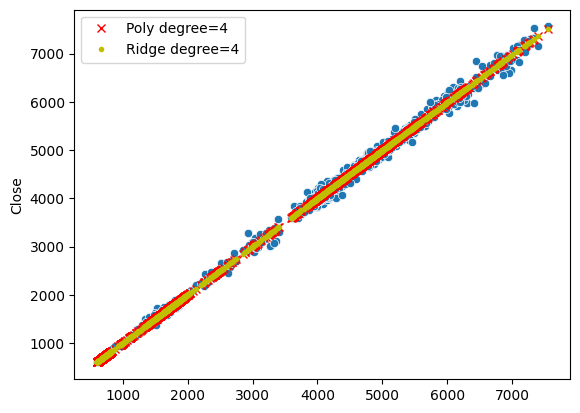

In [583]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'rx',label='Poly degree=4')
plt.plot(X_val,ridp.predict(X_poly),'y.',label='Ridge degree=4')
plt.legend()
plt.show()

In [584]:
yr_pred=ridp.predict(X_test1)

In [585]:
print(f"MAE : {mean_absolute_error(y_test,yr_pred)}\nMSE : {mean_squared_error(y_test,yr_pred)}\nRMSE : {find_RMSE(yr_pred,y_test)}\nR2 : {r2_score(y_test,yr_pred)}\nAdj R2 : {find_adj_r2(yr_pred,y_test)}")

MAE : 39.68162331910384
MSE : 3947.8172383340357
RMSE : 62.831657930807744
R2 : 0.9989066572706692
Adj R2 : 0.998906042869804


In [586]:
ridp_mae=mean_absolute_error(y_test,yr_pred)
ridp_rmse=find_RMSE(yr_pred,y_test)
ridp_r2=r2_score(y_test,yr_pred)

## Lasso on Polynomial of Degree 4

In [587]:
lsp=Lasso(alpha=0.1)
lsp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.724e+06, tolerance: 5.400e+05
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.1)

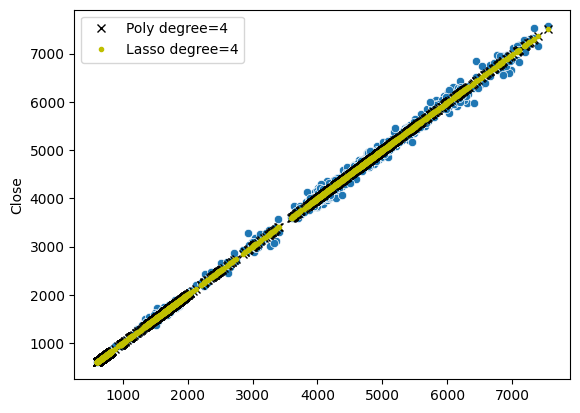

In [588]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'kx',label='Poly degree=4')
plt.plot(X_val,lsp.predict(X_poly),'y.',label='Lasso degree=4')
plt.legend()
plt.show()

In [589]:
yl_pred=lsp.predict(X_test1)

In [590]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 39.68901953238596
MSE : 3947.0497989741625
RMSE : 62.82555052663019
R2 : 0.9989068698119784
Adj R2 : 0.9989062913921904


In [591]:
lsp_mae=mean_absolute_error(y_test,yl_pred)
lsp_rmse=find_RMSE(yl_pred,y_test)
lsp_r2=r2_score(y_test,yl_pred)

## Multiple Linear Regression

In [592]:
df

,Open,High,Low,Close,Adj Close,Volume
0,619.950012,627.950012,619.950012,622.900024,549.175598,48049
1,623.900024,625.400024,617.000000,618.250000,545.075989,60276
2,619.200012,625.400024,614.500000,615.549988,542.695557,115421
3,617.799988,619.950012,614.049988,614.750000,541.990173,53393
4,615.950012,618.700012,611.099976,612.349976,539.874268,44229
...,...,...,...,...,...,...
1905,5100.000000,5149.950195,5060.000000,5111.200195,5111.200195,258477
1906,5111.250000,5135.000000,5070.450195,5123.850098,5123.850098,179424
1907,5155.000000,5190.000000,5136.100098,5177.500000,5177.500000,401368
1908,5181.000000,5389.950195,5125.000000,5377.049805,5377.049805,1326532


In [593]:
df.drop(columns=['High','Low','Adj Close'],inplace=True)
df

,Open,Close,Volume
0,619.950012,622.900024,48049
1,623.900024,618.250000,60276
2,619.200012,615.549988,115421
3,617.799988,614.750000,53393
4,615.950012,612.349976,44229
...,...,...,...
1905,5100.000000,5111.200195,258477
1906,5111.250000,5123.850098,179424
1907,5155.000000,5177.500000,401368
1908,5181.000000,5377.049805,1326532


In [594]:
X=df.drop(columns=['Close'])
X

,Open,Volume
0,619.950012,48049
1,623.900024,60276
2,619.200012,115421
3,617.799988,53393
4,615.950012,44229
...,...,...
1905,5100.000000,258477
1906,5111.250000,179424
1907,5155.000000,401368
1908,5181.000000,1326532


In [595]:
y=df['Close']
y

0        622.900024
1        618.250000
2        615.549988
3        614.750000
4        612.349976
           ...     
1905    5111.200195
1906    5123.850098
1907    5177.500000
1908    5377.049805
1909    5385.049805
Name: Close, Length: 1910, dtype: float64

In [596]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [597]:
mlin=LinearRegression()
mlin.fit(X_train,y_train)

LinearRegression()

In [598]:
cdf=pd.DataFrame(mlin.coef_,X.columns,columns=['coef_lin'])
cdf

,coef_lin
Open,0.993455
Volume,0.000052


In [599]:
mlin.intercept_

3.840415250755086

In [600]:
pred=mlin.predict(X_test)

In [601]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 39.57564033368953
MSE : 4404.759571461855
RMSE : 66.36836273000755
R2 : 0.9987801076997321
Adj R2 : 0.9987774429551444


In [602]:
mlin_mae=mean_absolute_error(y_test,pred)
mlin_rmse=find_RMSE(pred,y_test)
mlin_r2=r2_score(y_test,pred)

## Applying Ridge Regression on Multiple Linear Regression

In [603]:
ridm=Ridge(alpha=0.1)
ridm.fit(X_train,y_train)

Ridge(alpha=0.1)

In [604]:
cdf['coef_ridge']=ridm.coef_
cdf

,coef_lin,coef_ridge
Open,0.993455,0.993455
Volume,0.000052,0.000052


In [605]:
ridm.intercept_

3.8404153033857256

In [606]:
pred=ridm.predict(X_test)

In [607]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 39.57564033559288
MSE : 4404.759572405489
RMSE : 66.36836273711661
R2 : 0.9987801076994708
Adj R2 : 0.9987774429548387


In [608]:
ridm_mae=mean_absolute_error(y_test,pred)
ridm_rmse=find_RMSE(pred,y_test)
ridm_r2=r2_score(y_test,pred)

## Applying Lasso Regression on Multiple linear Regression

In [609]:
lso=Lasso(alpha=0.1)
lso.fit(X_train,y_train)

Lasso(alpha=0.1)

In [610]:
cdf['coef_lasso']=lso.coef_
cdf

,coef_lin,coef_ridge,coef_lasso
Open,0.993455,0.993455,0.993455
Volume,0.000052,0.000052,0.000052


In [611]:
lso.intercept_

3.840391343381725

In [612]:
pred=lso.predict(X_test)

In [613]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 39.57563943829536
MSE : 4404.759114501589
RMSE : 66.36835928740132
R2 : 0.9987801078262867
Adj R2 : 0.9987774431019039


In [614]:
lso_mae=mean_absolute_error(y_test,pred)
lso_rmse=find_RMSE(pred,y_test)
lso_r2=r2_score(y_test,pred)

In [615]:
ltim_mae=pd.DataFrame()
ltim_mae['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
ltim_mae['MAE']=[lr_mae,rr_mae,lsr_mae,poly_mae,ridp_mae,lsp_mae,mlin_mae,ridm_mae,lso_mae]
ltim_mae

,Models,MAE
0,Simple_LinearReg,39.835657
1,Ridge_alpha_0.1,39.835657
2,Lasso_alpha_0.1,39.835660
3,Poly_deg_4,39.682086
4,Ridge_0.1_Poly_4,39.681623
5,Lasso_0.1_Poly_4,39.689020
6,Mul_LinearReg,39.575640
7,Mul_Ridge_0.1,39.575640
8,Mul_Lasso_0.1,39.575639


In [616]:
ltim_rmse=pd.DataFrame()
ltim_rmse['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
ltim_rmse['RMSE']=[lr_rmse,rr_rmse,lsr_rmse,poly_rmse,ridp_rmse,lsp_rmse,mlin_rmse,ridm_rmse,lso_rmse]
ltim_rmse

,Models,RMSE
0,Simple_LinearReg,63.112070
1,Ridge_alpha_0.1,63.112070
2,Lasso_alpha_0.1,63.112068
3,Poly_deg_4,62.837664
4,Ridge_0.1_Poly_4,62.831658
5,Lasso_0.1_Poly_4,62.825551
6,Mul_LinearReg,66.368363
7,Mul_Ridge_0.1,66.368363
8,Mul_Lasso_0.1,66.368359


In [617]:
ltim_r2=pd.DataFrame()
ltim_r2['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
ltim_r2['R2_score']=[lr_r2,rr_r2,lsr_r2,poly_r2,ridp_r2,lsp_r2,mlin_r2,ridm_r2,lso_r2]
ltim_r2

,Models,R2_score
0,Simple_LinearReg,0.998897
1,Ridge_alpha_0.1,0.998897
2,Lasso_alpha_0.1,0.998897
3,Poly_deg_4,0.998906
4,Ridge_0.1_Poly_4,0.998907
5,Lasso_0.1_Poly_4,0.998907
6,Mul_LinearReg,0.998780
7,Mul_Ridge_0.1,0.998780
8,Mul_Lasso_0.1,0.998780


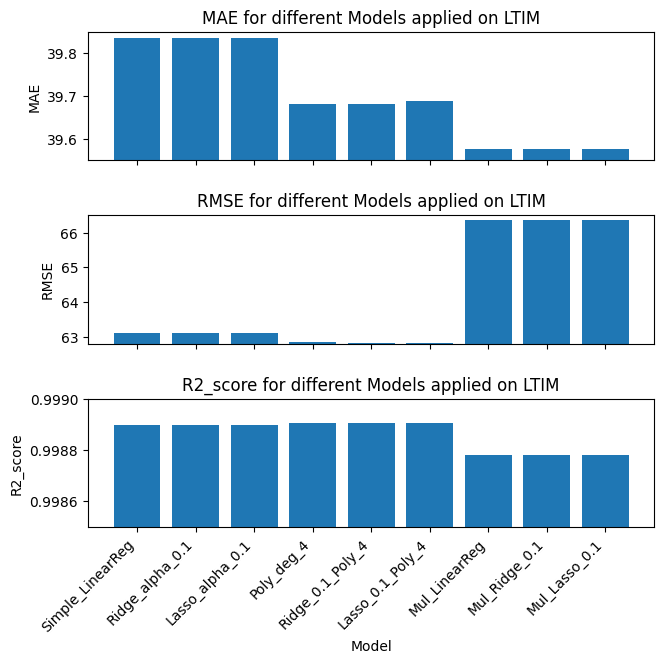

In [618]:
fig,ax=plt.subplots(nrows=3,ncols=1,sharex=True,figsize=(7, 7))
ax[0].bar(ltim_mae['Models'], ltim_mae['MAE'])
ax[0].set_xticks(range(len(ltim_mae['Models'])))  
ax[0].set_xticklabels(ltim_mae['Models'], rotation=45, ha='right')  
ax[0].set_ylabel('MAE')
ax[0].set_title('MAE for different Models applied on LTIM')
ax[0].set_ylim(39.55, 39.85)

ax[1].bar(ltim_rmse['Models'], ltim_rmse['RMSE'])
ax[1].set_xticks(range(len(ltim_rmse['Models']))) 
ax[1].set_xticklabels(ltim_rmse['Models'], rotation=45, ha='right')  
ax[1].set_ylabel('RMSE')
ax[1].set_title('RMSE for different Models applied on LTIM')
ax[1].set_ylim(62.8, 66.5)

ax[2].bar(ltim_r2['Models'], ltim_r2['R2_score'])
ax[2].set_xticks(range(len(ltim_r2['Models'])))  
ax[2].set_xticklabels(ltim_r2['Models'], rotation=45, ha='right') 
ax[2].set_xlabel('Model')
ax[2].set_ylabel('R2_score')
ax[2].set_title('R2_score for different Models applied on LTIM')
ax[2].set_ylim(0.9985,0.999)
plt.tight_layout(pad=2.0)
plt.show()

## ElasticNet

In [619]:
# eln=ElasticNet(alpha=1,l1_ratio=0.5)
# eln.fit(X_train,y_train)

In [620]:
# cdf['coef_elnet']=eln.coef_
# cdf

In [621]:
# eln.intercept_

In [622]:
# pred=eln.predict(X_test)

In [623]:
# print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

In [624]:
# eln_mae=mean_absolute_error(y_test,pred)
# eln_rmse=find_RMSE(pred,y_test)
# eln_r2=r2_score(y_test,pred)

## Comparison

In [625]:
new_row=pd.DataFrame({
    'Companies' : ['LTIM'],
    'Simple_LinearReg' : [lr_mae],
    'Ridge_alpha_0.1' : [rr_mae],
    'Lasso_alpha_0.1' : [lsr_mae],
    'Poly_deg_4' : [poly_mae],
    'Ridge_0.1_Poly_4' : [ridp_mae],
    'Lasso_0.1_Poly_4' : [lsp_mae],
   })
mean_abs_err=pd.concat([mean_abs_err,new_row],ignore_index=True)
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,2.703910,2.703910,2.703907,2.714773,2.714773,2.720406
1,HCL Tech,5.246393,5.246393,5.246396,5.261852,5.261851,5.271076
2,INFY,6.620008,6.620008,6.620010,6.629635,6.629620,6.635311
3,TECH M,7.289615,7.289615,7.289625,7.269143,7.269136,7.267302
4,Coforge,22.247317,22.247317,22.247324,21.810074,21.809277,21.837951
5,LTTS,37.354296,37.354296,37.354301,37.483645,37.482837,37.438588
6,LTIM,39.835657,39.835657,39.835660,39.682086,39.681623,39.689020


In [626]:
new_row=pd.DataFrame({
    'Companies' : ['LTIM'],
    'Mul_LinearReg' : [mlin_mae],
    'Mul_Ridge_0.1' : [ridm_mae],
    'Mul_Lasso_0.1' : [lso_mae]
    # 'ElasticNet' : [eln_mae]
})
mul_mean_abs_err=pd.concat([mul_mean_abs_err,new_row],ignore_index=True)
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,2.730339,2.730339,2.730348
1,HCL Tech,5.243260,5.243260,5.243263
2,INFY,6.620608,6.620608,6.620608
3,TECH M,7.231938,7.231938,7.231937
4,Coforge,22.244618,22.244618,22.244620
5,LTTS,36.180698,36.180698,36.180698
6,LTIM,39.575640,39.575640,39.575639


In [627]:
new_row=pd.DataFrame({
    'Companies' : ['LTIM'],
    'Simple_LinearReg' : [lr_rmse],
    'Ridge_alpha_0.1' : [rr_rmse],
    'Lasso_alpha_0.1' : [lsr_rmse],
    'Poly_deg_4' : [poly_rmse],
    'Ridge_0.1_Poly_4' : [ridp_rmse],
    'Lasso_0.1_Poly_4' : [lsp_rmse],
    })
root_mean_sq_err=pd.concat([root_mean_sq_err,new_row],ignore_index=True)
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.862410,3.862410,3.859339
1,HCL Tech,8.427889,8.427889,8.427888,8.455405,8.455404,8.462473
2,INFY,10.216314,10.216314,10.216320,10.214395,10.214364,10.215232
3,TECH M,11.076269,11.076269,11.076273,11.046103,11.046095,11.041298
4,Coforge,46.730659,46.730659,46.730655,46.301766,46.299727,46.288683
5,LTTS,59.965943,59.965943,59.965948,60.037481,60.035358,59.980291
6,LTIM,63.112070,63.112070,63.112068,62.837664,62.831658,62.825551


In [628]:
new_row=pd.DataFrame({
    'Companies' : ['LTIM'],
    'Mul_LinearReg' : [mlin_rmse],
    'Mul_Ridge_0.1' : [ridm_rmse],
    'Mul_Lasso_0.1' : [lso_rmse]
    # 'ElasticNet' : [eln_rmse]
})
mul_root_mean_sq_err=pd.concat([mul_root_mean_sq_err,new_row],ignore_index=True)
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,3.890457,3.890457,3.890457
1,HCL Tech,8.431783,8.431783,8.431781
2,INFY,10.220077,10.220077,10.220072
3,TECH M,11.022439,11.022439,11.022441
4,Coforge,46.250577,46.250577,46.250581
5,LTTS,56.092029,56.092029,56.092027
6,LTIM,66.368363,66.368363,66.368359


In [629]:
new_row=pd.DataFrame({
    'Companies' : ['LTIM'],
    'Simple_LinearReg' : [lr_r2],
    'Ridge_alpha_0.1' : [rr_r2],
    'Lasso_alpha_0.1' : [lsr_r2],
    'Poly_deg_4' : [poly_r2],
    'Ridge_0.1_Poly_4' : [ridp_r2],
    'Lasso_0.1_Poly_4' : [lsp_r2],
    })
R2_score=pd.concat([R2_score,new_row],ignore_index=True)
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204,0.999205
1,HCL Tech,0.999546,0.999546,0.999546,0.999543,0.999543,0.999542
2,INFY,0.999534,0.999534,0.999534,0.999534,0.999534,0.999534
3,TECH M,0.999202,0.999202,0.999202,0.999206,0.999206,0.999207
4,Coforge,0.999256,0.999256,0.999256,0.999270,0.999270,0.999270
5,LTTS,0.998478,0.998478,0.998478,0.998474,0.998474,0.998477
6,LTIM,0.998897,0.998897,0.998897,0.998906,0.998907,0.998907


In [630]:
new_row=pd.DataFrame({
    'Companies' : ['LTIM'],
    'Mul_LinearReg' : [mlin_r2],
    'Mul_Ridge_0.1' : [ridm_r2],
    'Mul_Lasso_0.1' : [lso_r2]
    # 'ElasticNet' : [eln_r2]
})
mul_R2_score=pd.concat([mul_R2_score,new_row],ignore_index=True)
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,0.999192,0.999192,0.999192
1,HCL Tech,0.999545,0.999545,0.999545
2,INFY,0.999534,0.999534,0.999534
3,TECH M,0.999210,0.999210,0.999210
4,Coforge,0.999271,0.999271,0.999271
5,LTTS,0.998668,0.998668,0.998668
6,LTIM,0.998780,0.998780,0.998780


## TCS

In [631]:
data=pd.read_csv('TCS.NS.csv')
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2008-01-01,269.250000,269.250000,263.000000,263.637512,191.711273,928388.0
1,2008-01-02,265.000000,265.250000,257.875000,262.500000,190.884140,2864924.0
2,2008-01-03,257.524994,261.250000,251.337494,252.762497,183.803253,5168280.0
3,2008-01-04,252.762497,255.725006,250.574997,251.300003,182.739792,2318868.0
4,2008-01-07,250.000000,252.199997,243.125000,243.899994,177.358688,3647344.0
...,...,...,...,...,...,...,...
4065,2024-06-24,3808.750000,3857.000000,3791.300049,3816.800049,3816.800049,1702154.0
4066,2024-06-25,3817.000000,3847.649902,3792.899902,3838.449951,3838.449951,1338808.0
4067,2024-06-26,3844.500000,3866.949951,3841.000000,3855.850098,3855.850098,1639845.0
4068,2024-06-27,3831.000000,3942.000000,3818.100098,3934.149902,3934.149902,4526556.0


In [632]:
data.shape

(4070, 7)

In [633]:
data.isnull().sum()

Date         0
Open         7
High         7
Low          7
Close        7
Adj Close    7
Volume       7
dtype: int64

In [634]:
data=data.dropna()
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [635]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,4063.000000,4063.000000,4063.000000,4063.000000,4063.000000,4.063000e+03
mean,1577.605949,1593.608870,1560.712931,1577.082061,1428.557999,3.126520e+06
std,1146.862149,1156.241844,1136.859265,1146.479526,1137.443700,2.672594e+06
min,112.000000,116.112503,103.837502,111.550003,83.159019,0.000000e+00
25%,594.137512,602.100006,587.325012,594.512512,462.141724,1.766852e+06
50%,1250.300049,1261.449951,1238.400024,1250.275024,1057.750732,2.464004e+06
75%,2228.949951,2250.000000,2205.800049,2225.974976,2017.942200,3.701082e+06
max,4215.250000,4254.750000,4177.000000,4219.250000,4188.805176,8.806715e+07


In [636]:
df=data.drop(columns=['Date'])
df

,Open,High,Low,Close,Adj Close,Volume
0,269.250000,269.250000,263.000000,263.637512,191.711273,928388.0
1,265.000000,265.250000,257.875000,262.500000,190.884140,2864924.0
2,257.524994,261.250000,251.337494,252.762497,183.803253,5168280.0
3,252.762497,255.725006,250.574997,251.300003,182.739792,2318868.0
4,250.000000,252.199997,243.125000,243.899994,177.358688,3647344.0
...,...,...,...,...,...,...
4065,3808.750000,3857.000000,3791.300049,3816.800049,3816.800049,1702154.0
4066,3817.000000,3847.649902,3792.899902,3838.449951,3838.449951,1338808.0
4067,3844.500000,3866.949951,3841.000000,3855.850098,3855.850098,1639845.0
4068,3831.000000,3942.000000,3818.100098,3934.149902,3934.149902,4526556.0


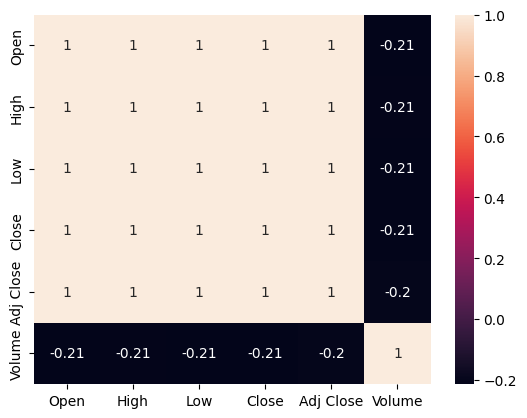

In [637]:
sns.heatmap(df.corr(),annot=True)
plt.show()

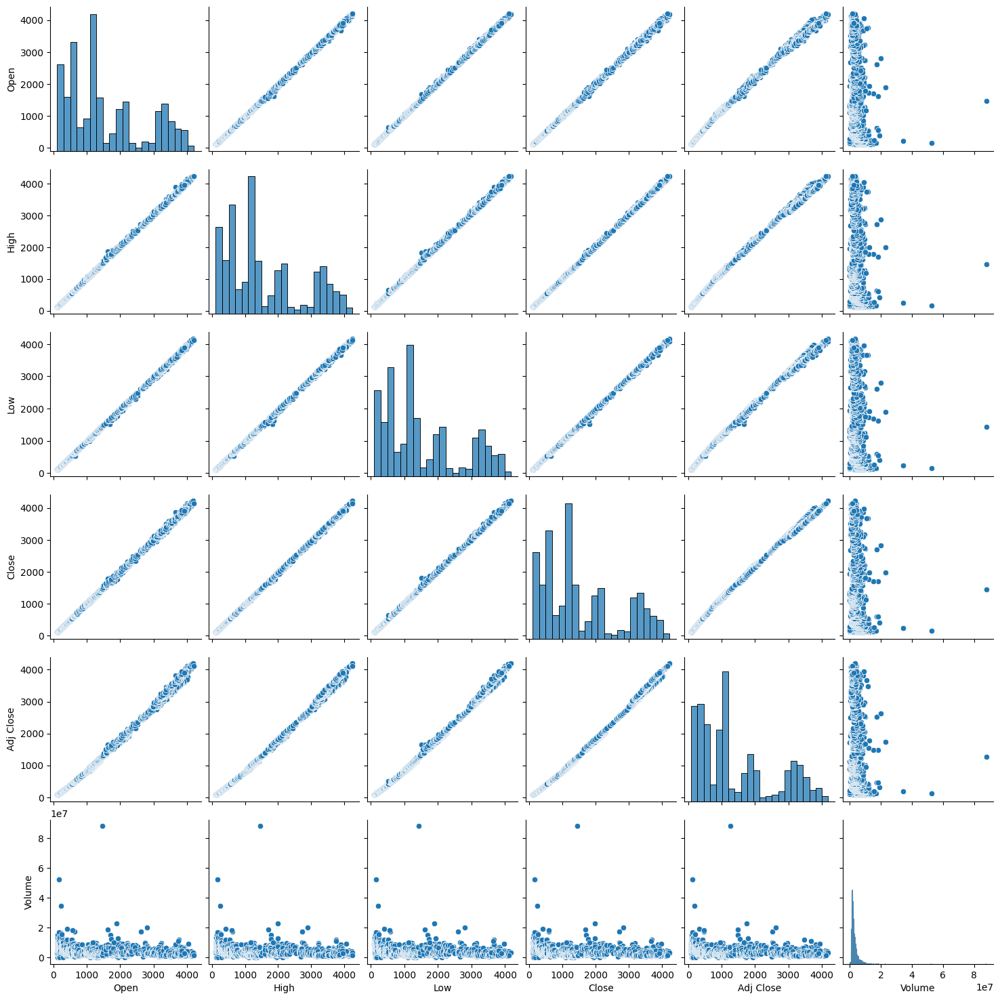

In [638]:
sns.pairplot(df)
plt.show()

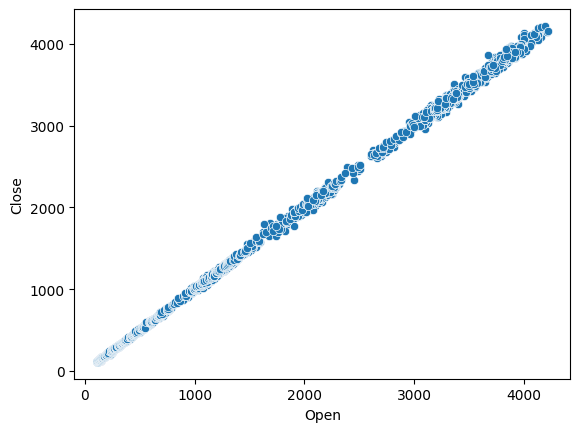

In [639]:
sns.scatterplot(x=df['Open'],y=df['Close'])
plt.show()

In [640]:
X=df[['Open']]
X

,Open
0,269.250000
1,265.000000
2,257.524994
3,252.762497
4,250.000000
...,...
4065,3808.750000
4066,3817.000000
4067,3844.500000
4068,3831.000000


In [641]:
y=df['Close']
y

0        263.637512
1        262.500000
2        252.762497
3        251.300003
4        243.899994
           ...     
4065    3816.800049
4066    3838.449951
4067    3855.850098
4068    3934.149902
4069    3904.149902
Name: Close, Length: 4063, dtype: float64

## Simple Linear Regression

In [642]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [643]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [644]:
print(f"Coefficient : {lr.coef_}\nintercept : {lr.intercept_}")

Coefficient : [0.99947733]
intercept : 0.4989137030265738


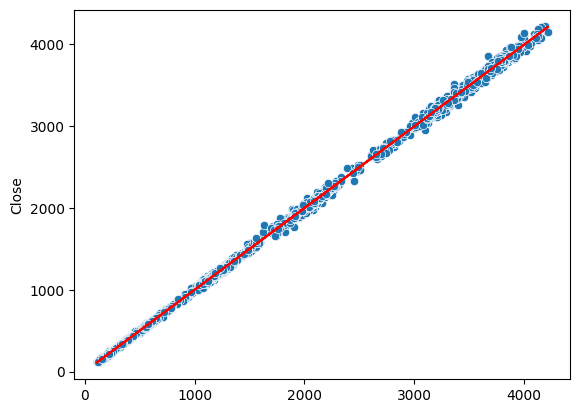

In [645]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),color='red')
plt.show()

In [646]:
pred=lr.predict(X_test)

In [647]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 15.393910405716897
MSE : 560.8227458388529
RMSE : 23.681696430763843
R2 : 0.9995807063864843
Adj R2 : 0.9995802347258678


In [648]:
lr_mae=mean_absolute_error(y_test,pred)
lr_rmse=find_RMSE(pred,y_test)
lr_r2=r2_score(y_test,pred)

## Ridge

In [649]:
rr=Ridge(alpha=0.1)
rr.fit(X_train,y_train)

Ridge(alpha=0.1)

In [650]:
print(rr.coef_,rr.intercept_)

[0.99947733] 0.49891374037383684


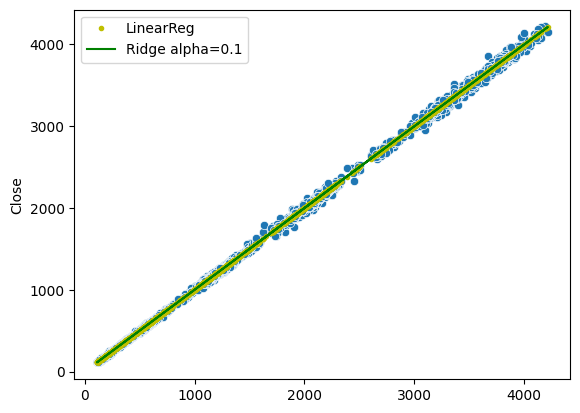

In [651]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'y.',label='LinearReg')
plt.plot(X_val,rr.predict(X_train),color='green',label='Ridge alpha=0.1')
plt.legend()
plt.show()

In [652]:
y_pred=rr.predict(X_test)

In [653]:
print(f"MAE : {mean_absolute_error(y_test,y_pred)}\nMSE : {mean_squared_error(y_test,y_pred)}\nRMSE : {find_RMSE(y_pred,y_test)}\nR2 : {r2_score(y_test,y_pred)}\nAdj R2 : {find_adj_r2(y_pred,y_test)}")

MAE : 15.39391040607082
MSE : 560.822745824909
RMSE : 23.68169643046944
R2 : 0.9995807063864948
Adj R2 : 0.9995802347258584


In [654]:
rr_mae=mean_absolute_error(y_test,y_pred)
rr_rmse=find_RMSE(y_pred,y_test)
rr_r2=r2_score(y_test,y_pred)

## Lasso

In [655]:
lsr=Lasso(alpha=0.1)
lsr.fit(X_train,y_train)

Lasso(alpha=0.1)

In [656]:
print(lsr.coef_,lsr.intercept_)

[0.99947726] 0.4990351475889838


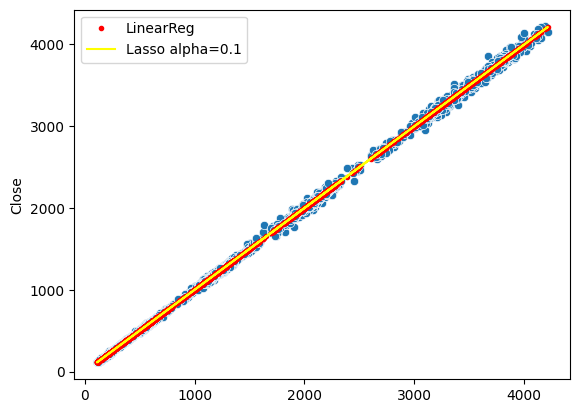

In [657]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'r.',label='LinearReg')
plt.plot(X_val,lsr.predict(X_train),color='yellow',label='Lasso alpha=0.1')
plt.legend()
plt.show()

In [658]:
yl_pred=lsr.predict(X_test)

In [659]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 15.393911556572352
MSE : 560.8227005025556
RMSE : 23.681695473562606
R2 : 0.9995807064203796
Adj R2 : 0.9995802346955981


In [660]:
lsr_mae=mean_absolute_error(y_test,yl_pred)
lsr_rmse=find_RMSE(yl_pred,y_test)
lsr_r2=r2_score(y_test,yl_pred)

## Polynomial of Degree 4

In [661]:
poly=PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X_train)
X_test1=poly.transform(X_test)
poly.fit(X_poly,y_train)
lin=LinearRegression()
lin.fit(X_poly,y_train)

LinearRegression()

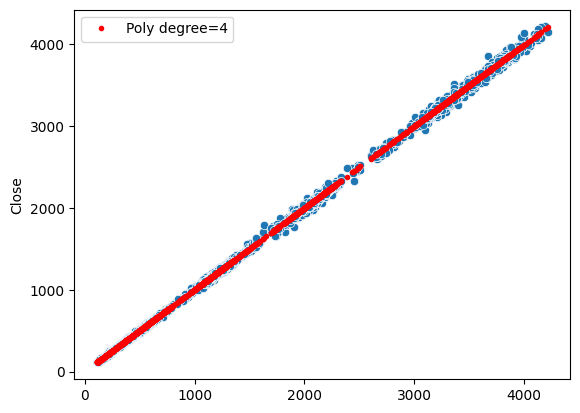

In [662]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'r.',label='Poly degree=4')
plt.legend()
plt.show()

In [663]:
yp_pred=lin.predict(X_test1)

In [664]:
print(f"MAE : {mean_absolute_error(y_test,yp_pred)}\nMSE : {mean_squared_error(y_test,yp_pred)}\nRMSE : {find_RMSE(yp_pred,y_test)}\nR2 : {r2_score(y_test,yp_pred)}\nAdj R2 : {find_adj_r2(yp_pred,y_test)}")

MAE : 15.36455470955629
MSE : 559.1803647867251
RMSE : 23.646994836273066
R2 : 0.9995819342965347
Adj R2 : 0.9995815040800313


In [665]:
poly_mae=mean_absolute_error(y_test,yp_pred)
poly_rmse=find_RMSE(yp_pred,y_test)
poly_r2=r2_score(y_test,yp_pred)

## Ridge on Polynomial of Degree 4

In [666]:
ridp=Ridge(alpha=0.1)
ridp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=7.54438e-33): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Ridge(alpha=0.1)

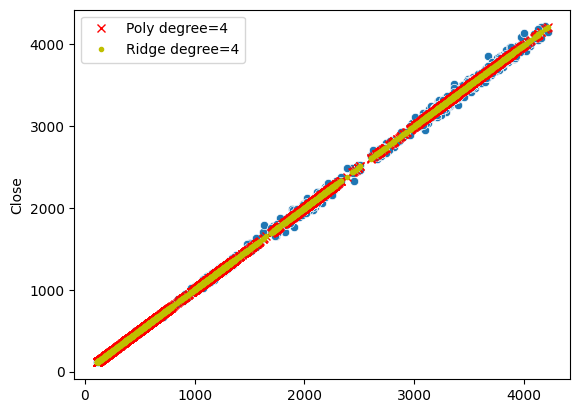

In [667]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'rx',label='Poly degree=4')
plt.plot(X_val,ridp.predict(X_poly),'y.',label='Ridge degree=4')
plt.legend()
plt.show()

In [668]:
yr_pred=ridp.predict(X_test1)

In [669]:
print(f"MAE : {mean_absolute_error(y_test,yr_pred)}\nMSE : {mean_squared_error(y_test,yr_pred)}\nRMSE : {find_RMSE(yr_pred,y_test)}\nR2 : {r2_score(y_test,yr_pred)}\nAdj R2 : {find_adj_r2(yr_pred,y_test)}")

MAE : 15.364460006606173
MSE : 559.176056142261
RMSE : 23.646903732672087
R2 : 0.9995819375178504
Adj R2 : 0.9995815023103513


In [670]:
ridp_mae=mean_absolute_error(y_test,yr_pred)
ridp_rmse=find_RMSE(yr_pred,y_test)
ridp_r2=r2_score(y_test,yr_pred)

## Lasso on Polynomial of Degree 4

In [671]:
lsp=Lasso(alpha=0.1)
lsp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.032e+06, tolerance: 4.250e+05
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.1)

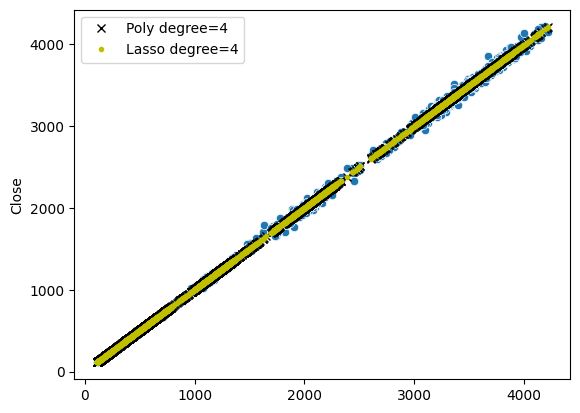

In [672]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'kx',label='Poly degree=4')
plt.plot(X_val,lsp.predict(X_poly),'y.',label='Lasso degree=4')
plt.legend()
plt.show()

In [673]:
yl_pred=lsp.predict(X_test1)

In [674]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 15.396295624800917
MSE : 560.6230280643973
RMSE : 23.677479343553387
R2 : 0.9995808557035153
Adj R2 : 0.9995803827320398


In [675]:
lsp_mae=mean_absolute_error(y_test,yl_pred)
lsp_rmse=find_RMSE(yl_pred,y_test)
lsp_r2=r2_score(y_test,yl_pred)

## Multiple Linear Regression

In [676]:
df

,Open,High,Low,Close,Adj Close,Volume
0,269.250000,269.250000,263.000000,263.637512,191.711273,928388.0
1,265.000000,265.250000,257.875000,262.500000,190.884140,2864924.0
2,257.524994,261.250000,251.337494,252.762497,183.803253,5168280.0
3,252.762497,255.725006,250.574997,251.300003,182.739792,2318868.0
4,250.000000,252.199997,243.125000,243.899994,177.358688,3647344.0
...,...,...,...,...,...,...
4065,3808.750000,3857.000000,3791.300049,3816.800049,3816.800049,1702154.0
4066,3817.000000,3847.649902,3792.899902,3838.449951,3838.449951,1338808.0
4067,3844.500000,3866.949951,3841.000000,3855.850098,3855.850098,1639845.0
4068,3831.000000,3942.000000,3818.100098,3934.149902,3934.149902,4526556.0


In [677]:
df.drop(columns=['High','Low','Adj Close'],inplace=True)
df

,Open,Close,Volume
0,269.250000,263.637512,928388.0
1,265.000000,262.500000,2864924.0
2,257.524994,252.762497,5168280.0
3,252.762497,251.300003,2318868.0
4,250.000000,243.899994,3647344.0
...,...,...,...
4065,3808.750000,3816.800049,1702154.0
4066,3817.000000,3838.449951,1338808.0
4067,3844.500000,3855.850098,1639845.0
4068,3831.000000,3934.149902,4526556.0


In [678]:
X=df.drop(columns=['Close'])
X

,Open,Volume
0,269.250000,928388.0
1,265.000000,2864924.0
2,257.524994,5168280.0
3,252.762497,2318868.0
4,250.000000,3647344.0
...,...,...
4065,3808.750000,1702154.0
4066,3817.000000,1338808.0
4067,3844.500000,1639845.0
4068,3831.000000,4526556.0


In [679]:
y=df['Close']
y

0        263.637512
1        262.500000
2        252.762497
3        251.300003
4        243.899994
           ...     
4065    3816.800049
4066    3838.449951
4067    3855.850098
4068    3934.149902
4069    3904.149902
Name: Close, Length: 4063, dtype: float64

In [680]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [681]:
mlin=LinearRegression()
mlin.fit(X_train,y_train)

LinearRegression()

In [682]:
cdf=pd.DataFrame(mlin.coef_,X.columns,columns=['coef_lin'])
cdf

,coef_lin
Open,9.995722e-01
Volume,2.013663e-07


In [683]:
mlin.intercept_

-0.28411983044566114

In [684]:
pred=mlin.predict(X_test)

In [685]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 15.404588635757305
MSE : 560.6410875614413
RMSE : 23.67786070491676
R2 : 0.9995808422015099
Adj R2 : 0.9995798332966934


In [686]:
mlin_mae=mean_absolute_error(y_test,pred)
mlin_rmse=find_RMSE(pred,y_test)
mlin_r2=r2_score(y_test,pred)

## Applying Ridge on Multiple Linear Regression

In [687]:
ridm=Ridge(alpha=0.1)
ridm.fit(X_train,y_train)

Ridge(alpha=0.1)

In [688]:
cdf['coef_ridge']=ridm.coef_
cdf

,coef_lin,coef_ridge
Open,9.995722e-01,9.995722e-01
Volume,2.013663e-07,2.013663e-07


In [689]:
ridm.intercept_

-0.28411978486724365

In [690]:
pred=ridm.predict(X_test)

In [691]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 15.40458863574665
MSE : 560.6410875479401
RMSE : 23.67786070463166
R2 : 0.99958084220152
Adj R2 : 0.999579833296684


In [692]:
ridm_mae=mean_absolute_error(y_test,pred)
ridm_rmse=find_RMSE(pred,y_test)
ridm_r2=r2_score(y_test,pred)

## Applying Lasso Regression on Multiple Linear Regression

In [693]:
lso=Lasso(alpha=0.1)
lso.fit(X_train,y_train)

Lasso(alpha=0.1)

In [694]:
cdf['coef_lasso']=lso.coef_
cdf

,coef_lin,coef_ridge,coef_lasso
Open,9.995722e-01,9.995722e-01,9.995721e-01
Volume,2.013663e-07,2.013663e-07,2.013588e-07


In [695]:
lso.intercept_

-0.28395971682584786

In [696]:
pred=lso.predict(X_test)

In [697]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 15.404588597299426
MSE : 560.6410401557207
RMSE : 23.677859703860918
R2 : 0.9995808422369523
Adj R2 : 0.9995798332635242


In [698]:
lso_mae=mean_absolute_error(y_test,pred)
lso_rmse=find_RMSE(pred,y_test)
lso_r2=r2_score(y_test,pred)

In [699]:
tcs_mae=pd.DataFrame()
tcs_mae['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
tcs_mae['MAE']=[lr_mae,rr_mae,lsr_mae,poly_mae,ridp_mae,lsp_mae,mlin_mae,ridm_mae,lso_mae]
tcs_mae

,Models,MAE
0,Simple_LinearReg,15.393910
1,Ridge_alpha_0.1,15.393910
2,Lasso_alpha_0.1,15.393912
3,Poly_deg_4,15.364555
4,Ridge_0.1_Poly_4,15.364460
5,Lasso_0.1_Poly_4,15.396296
6,Mul_LinearReg,15.404589
7,Mul_Ridge_0.1,15.404589
8,Mul_Lasso_0.1,15.404589


In [700]:
tcs_rmse=pd.DataFrame()
tcs_rmse['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
tcs_rmse['RMSE']=[lr_rmse,rr_rmse,lsr_rmse,poly_rmse,ridp_rmse,lsp_rmse,mlin_rmse,ridm_rmse,lso_rmse]
tcs_rmse

,Models,RMSE
0,Simple_LinearReg,23.681696
1,Ridge_alpha_0.1,23.681696
2,Lasso_alpha_0.1,23.681695
3,Poly_deg_4,23.646995
4,Ridge_0.1_Poly_4,23.646904
5,Lasso_0.1_Poly_4,23.677479
6,Mul_LinearReg,23.677861
7,Mul_Ridge_0.1,23.677861
8,Mul_Lasso_0.1,23.677860


In [701]:
tcs_r2=pd.DataFrame()
tcs_r2['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
tcs_r2['R2_score']=[lr_r2,rr_r2,lsr_r2,poly_r2,ridp_r2,lsp_r2,mlin_r2,ridm_r2,lso_r2]
tcs_r2

,Models,R2_score
0,Simple_LinearReg,0.999581
1,Ridge_alpha_0.1,0.999581
2,Lasso_alpha_0.1,0.999581
3,Poly_deg_4,0.999582
4,Ridge_0.1_Poly_4,0.999582
5,Lasso_0.1_Poly_4,0.999581
6,Mul_LinearReg,0.999581
7,Mul_Ridge_0.1,0.999581
8,Mul_Lasso_0.1,0.999581


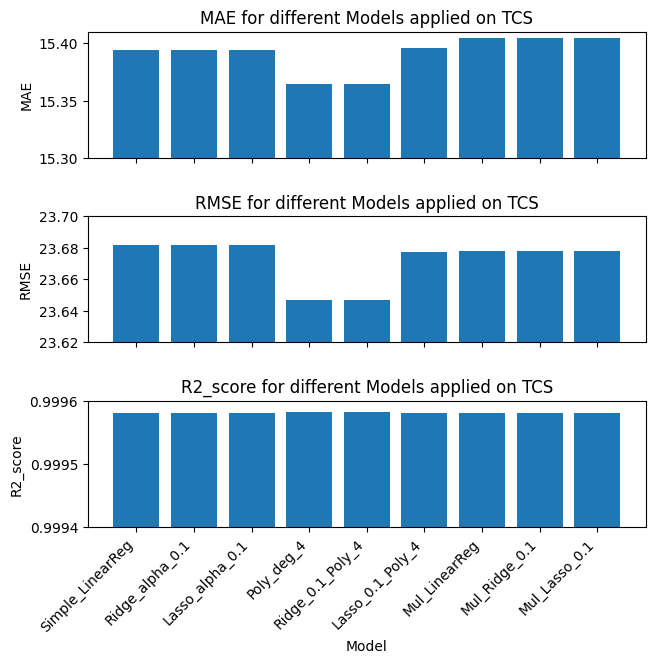

In [702]:
fig,ax=plt.subplots(nrows=3,ncols=1,sharex=True,figsize=(7, 7))
ax[0].bar(tcs_mae['Models'], tcs_mae['MAE'])
ax[0].set_xticks(range(len(tcs_mae['Models'])))  
ax[0].set_xticklabels(tcs_mae['Models'], rotation=45, ha='right')  
ax[0].set_ylabel('MAE')
ax[0].set_title('MAE for different Models applied on TCS')
ax[0].set_ylim(15.3, 15.41)

ax[1].bar(tcs_rmse['Models'], tcs_rmse['RMSE'])
ax[1].set_xticks(range(len(tcs_rmse['Models']))) 
ax[1].set_xticklabels(tcs_rmse['Models'], rotation=45, ha='right')  
ax[1].set_ylabel('RMSE')
ax[1].set_title('RMSE for different Models applied on TCS')
ax[1].set_ylim(23.62, 23.7)

ax[2].bar(tcs_r2['Models'], tcs_r2['R2_score'])
ax[2].set_xticks(range(len(tcs_r2['Models'])))  
ax[2].set_xticklabels(tcs_r2['Models'], rotation=45, ha='right') 
ax[2].set_xlabel('Model')
ax[2].set_ylabel('R2_score')
ax[2].set_title('R2_score for different Models applied on TCS')
ax[2].set_ylim(0.9994,0.9996)
plt.tight_layout(pad=2.0)
plt.show()

## ElasticNet

In [703]:
# eln=ElasticNet(alpha=1,l1_ratio=0.5)
# eln.fit(X_train,y_train)

In [704]:
# cdf['coef_elnet']=eln.coef_
# cdf

In [705]:
# eln.intercept_

In [706]:
# pred=eln.predict(X_test)

In [707]:
# print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

In [708]:
# eln_mae=mean_absolute_error(y_test,pred)
# eln_rmse=find_RMSE(pred,y_test)
# eln_r2=r2_score(y_test,pred)

## Comparisons

In [709]:
new_row=pd.DataFrame({
    'Companies' : ['TCS'],
    'Simple_LinearReg' : [lr_mae],
    'Ridge_alpha_0.1' : [rr_mae],
    'Lasso_alpha_0.1' : [lsr_mae],
    'Poly_deg_4' : [poly_mae],
    'Ridge_0.1_Poly_4' : [ridp_mae],
    'Lasso_0.1_Poly_4' : [lsp_mae],
   })
mean_abs_err=pd.concat([mean_abs_err,new_row],ignore_index=True)
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,2.703910,2.703910,2.703907,2.714773,2.714773,2.720406
1,HCL Tech,5.246393,5.246393,5.246396,5.261852,5.261851,5.271076
2,INFY,6.620008,6.620008,6.620010,6.629635,6.629620,6.635311
3,TECH M,7.289615,7.289615,7.289625,7.269143,7.269136,7.267302
4,Coforge,22.247317,22.247317,22.247324,21.810074,21.809277,21.837951
5,LTTS,37.354296,37.354296,37.354301,37.483645,37.482837,37.438588
6,LTIM,39.835657,39.835657,39.835660,39.682086,39.681623,39.689020
7,TCS,15.393910,15.393910,15.393912,15.364555,15.364460,15.396296


In [710]:
new_row=pd.DataFrame({
    'Companies' : ['TCS'],
    'Mul_LinearReg' : [mlin_mae],
    'Mul_Ridge_0.1' : [ridm_mae],
    'Mul_Lasso_0.1' : [lso_mae]
    # 'ElasticNet' : [eln_mae]
})
mul_mean_abs_err=pd.concat([mul_mean_abs_err,new_row],ignore_index=True)
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,2.730339,2.730339,2.730348
1,HCL Tech,5.243260,5.243260,5.243263
2,INFY,6.620608,6.620608,6.620608
3,TECH M,7.231938,7.231938,7.231937
4,Coforge,22.244618,22.244618,22.244620
5,LTTS,36.180698,36.180698,36.180698
6,LTIM,39.575640,39.575640,39.575639
7,TCS,15.404589,15.404589,15.404589


In [711]:
new_row=pd.DataFrame({
    'Companies' : ['TCS'],
    'Simple_LinearReg' : [lr_rmse],
    'Ridge_alpha_0.1' : [rr_rmse],
    'Lasso_alpha_0.1' : [lsr_rmse],
    'Poly_deg_4' : [poly_rmse],
    'Ridge_0.1_Poly_4' : [ridp_rmse],
    'Lasso_0.1_Poly_4' : [lsp_rmse],
    })
root_mean_sq_err=pd.concat([root_mean_sq_err,new_row],ignore_index=True)
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.862410,3.862410,3.859339
1,HCL Tech,8.427889,8.427889,8.427888,8.455405,8.455404,8.462473
2,INFY,10.216314,10.216314,10.216320,10.214395,10.214364,10.215232
3,TECH M,11.076269,11.076269,11.076273,11.046103,11.046095,11.041298
4,Coforge,46.730659,46.730659,46.730655,46.301766,46.299727,46.288683
5,LTTS,59.965943,59.965943,59.965948,60.037481,60.035358,59.980291
6,LTIM,63.112070,63.112070,63.112068,62.837664,62.831658,62.825551
7,TCS,23.681696,23.681696,23.681695,23.646995,23.646904,23.677479


In [712]:
new_row=pd.DataFrame({
    'Companies' : ['TCS'],
    'Mul_LinearReg' : [mlin_rmse],
    'Mul_Ridge_0.1' : [ridm_rmse],
    'Mul_Lasso_0.1' : [lso_rmse]
    # 'ElasticNet' : [eln_rmse]
})
mul_root_mean_sq_err=pd.concat([mul_root_mean_sq_err,new_row],ignore_index=True)
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,3.890457,3.890457,3.890457
1,HCL Tech,8.431783,8.431783,8.431781
2,INFY,10.220077,10.220077,10.220072
3,TECH M,11.022439,11.022439,11.022441
4,Coforge,46.250577,46.250577,46.250581
5,LTTS,56.092029,56.092029,56.092027
6,LTIM,66.368363,66.368363,66.368359
7,TCS,23.677861,23.677861,23.677860


In [713]:
new_row=pd.DataFrame({
    'Companies' : ['TCS'],
    'Simple_LinearReg' : [lr_r2],
    'Ridge_alpha_0.1' : [rr_r2],
    'Lasso_alpha_0.1' : [lsr_r2],
    'Poly_deg_4' : [poly_r2],
    'Ridge_0.1_Poly_4' : [ridp_r2],
    'Lasso_0.1_Poly_4' : [lsp_r2],
    })
R2_score=pd.concat([R2_score,new_row],ignore_index=True)
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204,0.999205
1,HCL Tech,0.999546,0.999546,0.999546,0.999543,0.999543,0.999542
2,INFY,0.999534,0.999534,0.999534,0.999534,0.999534,0.999534
3,TECH M,0.999202,0.999202,0.999202,0.999206,0.999206,0.999207
4,Coforge,0.999256,0.999256,0.999256,0.999270,0.999270,0.999270
5,LTTS,0.998478,0.998478,0.998478,0.998474,0.998474,0.998477
6,LTIM,0.998897,0.998897,0.998897,0.998906,0.998907,0.998907
7,TCS,0.999581,0.999581,0.999581,0.999582,0.999582,0.999581


In [714]:
new_row=pd.DataFrame({
    'Companies' : ['TCS'],
    'Mul_LinearReg' : [mlin_r2],
    'Mul_Ridge_0.1' : [ridm_r2],
    'Mul_Lasso_0.1' : [lso_r2]
    # 'ElasticNet' : [eln_r2]
})
mul_R2_score=pd.concat([mul_R2_score,new_row],ignore_index=True)
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,0.999192,0.999192,0.999192
1,HCL Tech,0.999545,0.999545,0.999545
2,INFY,0.999534,0.999534,0.999534
3,TECH M,0.999210,0.999210,0.999210
4,Coforge,0.999271,0.999271,0.999271
5,LTTS,0.998668,0.998668,0.998668
6,LTIM,0.998780,0.998780,0.998780
7,TCS,0.999581,0.999581,0.999581


## Mphasis

In [715]:
data = pd.read_csv('MPHASIS.NS.csv')
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2008-01-01,265.000000,313.500000,265.000000,296.649994,189.758163,192274.0
1,2008-01-02,293.350006,304.799988,290.000000,293.200012,187.551361,114185.0
2,2008-01-03,273.850006,298.700012,273.850006,289.700012,185.312515,364055.0
3,2008-01-04,292.500000,301.000000,289.000000,290.100006,185.568344,217016.0
4,2008-01-07,285.500000,289.000000,280.000000,285.100006,182.370056,178433.0
...,...,...,...,...,...,...,...
4065,2024-06-24,2402.100098,2424.000000,2380.100098,2394.199951,2343.563232,1356536.0
4066,2024-06-25,2395.050049,2414.949951,2379.500000,2408.300049,2357.364990,604516.0
4067,2024-06-26,2418.000000,2439.250000,2411.199951,2419.449951,2368.279297,607685.0
4068,2024-06-27,2415.199951,2451.750000,2404.100098,2442.100098,2390.450195,746590.0


In [716]:
data.shape

(4070, 7)

In [717]:
data.isnull().sum()

Date         0
Open         7
High         7
Low          7
Close        7
Adj Close    7
Volume       7
dtype: int64

In [718]:
data=data.dropna()
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [719]:
df=data.drop(columns=['Date'])
df

,Open,High,Low,Close,Adj Close,Volume
0,265.000000,313.500000,265.000000,296.649994,189.758163,192274.0
1,293.350006,304.799988,290.000000,293.200012,187.551361,114185.0
2,273.850006,298.700012,273.850006,289.700012,185.312515,364055.0
3,292.500000,301.000000,289.000000,290.100006,185.568344,217016.0
4,285.500000,289.000000,280.000000,285.100006,182.370056,178433.0
...,...,...,...,...,...,...
4065,2402.100098,2424.000000,2380.100098,2394.199951,2343.563232,1356536.0
4066,2395.050049,2414.949951,2379.500000,2408.300049,2357.364990,604516.0
4067,2418.000000,2439.250000,2411.199951,2419.449951,2368.279297,607685.0
4068,2415.199951,2451.750000,2404.100098,2442.100098,2390.450195,746590.0


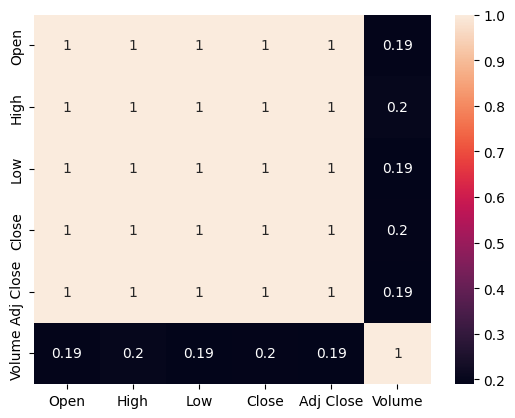

In [720]:
sns.heatmap(df.corr(),annot=True)
plt.show()

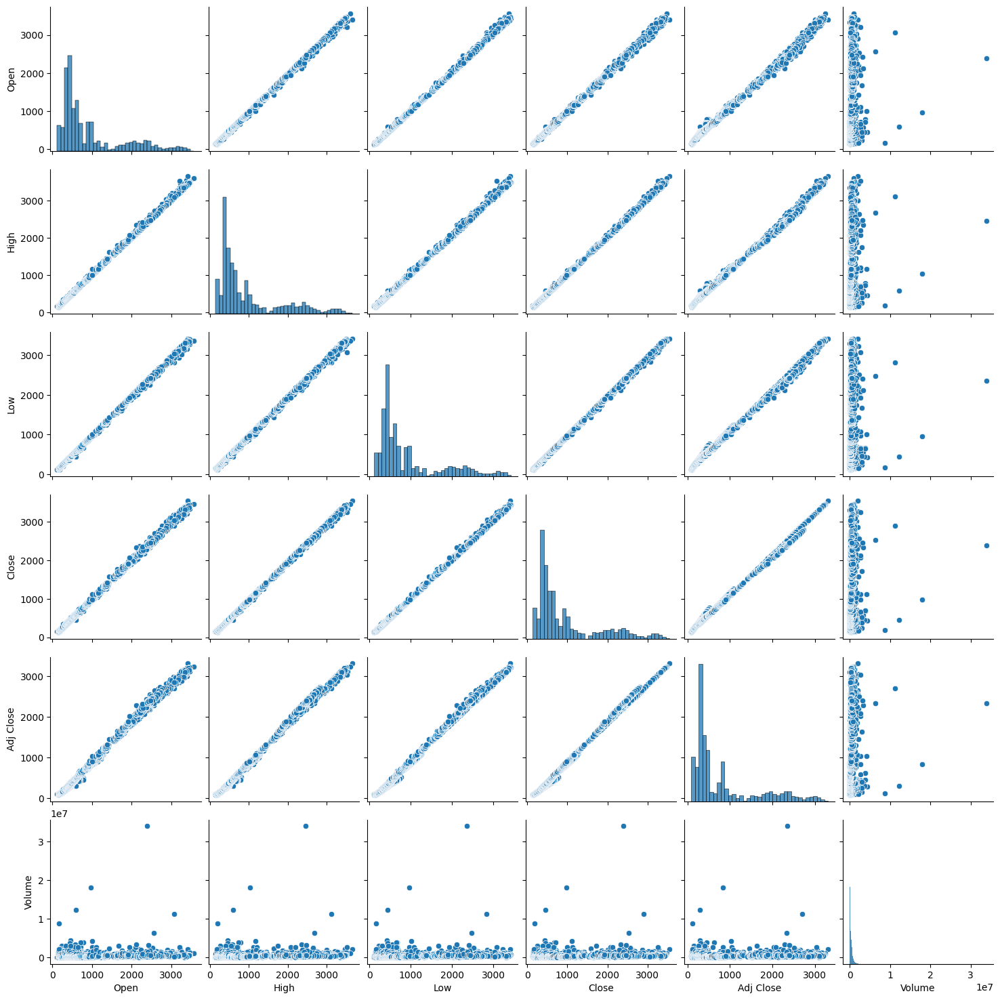

In [721]:
sns.pairplot(df)
plt.show()

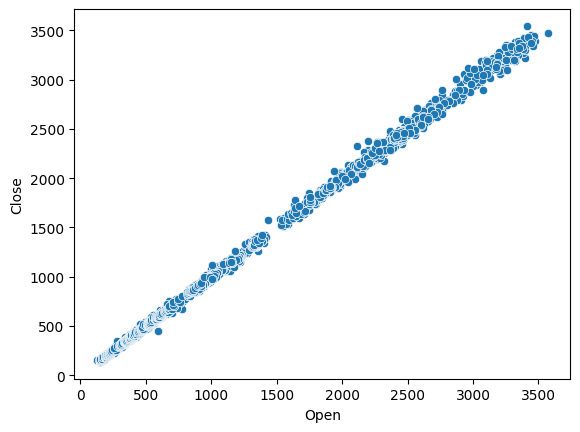

In [722]:
sns.scatterplot(x=df['Open'],y=df['Close'])
plt.show()

In [723]:
X=df[['Open']]
X

,Open
0,265.000000
1,293.350006
2,273.850006
3,292.500000
4,285.500000
...,...
4065,2402.100098
4066,2395.050049
4067,2418.000000
4068,2415.199951


In [724]:
y=df['Close']
y

0        296.649994
1        293.200012
2        289.700012
3        290.100006
4        285.100006
           ...     
4065    2394.199951
4066    2408.300049
4067    2419.449951
4068    2442.100098
4069    2456.550049
Name: Close, Length: 4063, dtype: float64

## Simple Linear Regression

In [725]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [726]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [727]:
print(f"Coefficient : {lr.coef_}\nintercept : {lr.intercept_}")

Coefficient : [0.99797501]
intercept : 0.8915376497507168


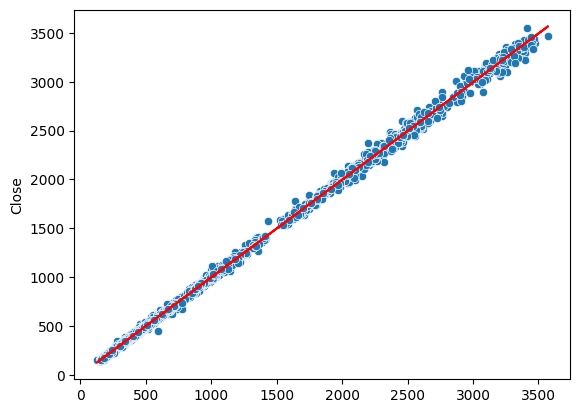

In [728]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),color='red')
plt.show()

In [729]:
pred=lr.predict(X_test)

In [730]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 13.495682563528263
MSE : 516.1238930346998
RMSE : 22.718360262895292
R2 : 0.9991954839998943
Adj R2 : 0.9991959111840278


In [731]:
lr_mae=mean_absolute_error(y_test,pred)
lr_rmse=find_RMSE(pred,y_test)
lr_r2=r2_score(y_test,pred)

## Ridge

In [732]:
rr=Ridge(alpha=0.1)
rr.fit(X_train,y_train)

Ridge(alpha=0.1)

In [733]:
print(rr.coef_,rr.intercept_)

[0.99797501] 0.891537695387342


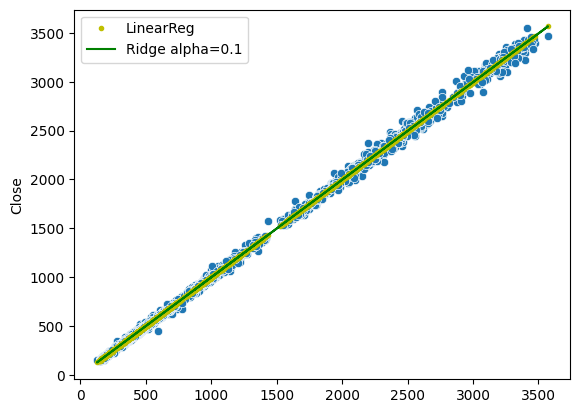

In [734]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'y.',label='LinearReg')
plt.plot(X_val,rr.predict(X_train),color='green',label='Ridge alpha=0.1')
plt.legend()
plt.show()

In [735]:
y_pred=rr.predict(X_test)

In [736]:
print(f"MAE : {mean_absolute_error(y_test,y_pred)}\nMSE : {mean_squared_error(y_test,y_pred)}\nRMSE : {find_RMSE(y_pred,y_test)}\nR2 : {r2_score(y_test,y_pred)}\nAdj R2 : {find_adj_r2(y_pred,y_test)}")

MAE : 13.495682561726426
MSE : 516.1238929565677
RMSE : 22.71836026117571
R2 : 0.9991954840000161
Adj R2 : 0.9991959111840728


In [737]:
rr_mae=mean_absolute_error(y_test,y_pred)
rr_rmse=find_RMSE(y_pred,y_test)
rr_r2=r2_score(y_test,y_pred)

## Lasso

In [738]:
lsr=Lasso(alpha=0.1)
lsr.fit(X_train,y_train)

Lasso(alpha=0.1)

In [739]:
print(lsr.coef_,lsr.intercept_)

[0.99797486] 0.8916862682940518


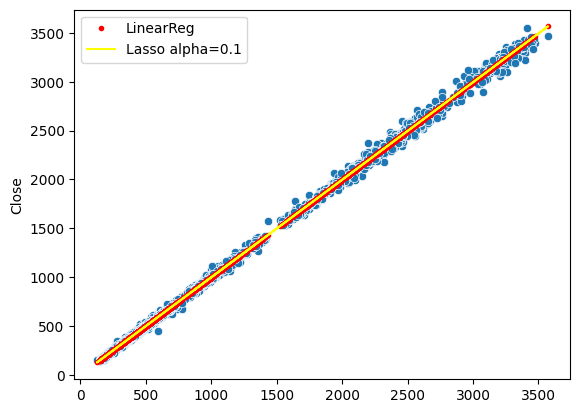

In [740]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'r.',label='LinearReg')
plt.plot(X_val,lsr.predict(X_train),color='yellow',label='Lasso alpha=0.1')
plt.legend()
plt.show()

In [741]:
yl_pred=lsr.predict(X_test)

In [742]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 13.495676695725066
MSE : 516.1236386085184
RMSE : 22.718354663322746
R2 : 0.9991954843964851
Adj R2 : 0.9991959113306819


In [743]:
lsr_mae=mean_absolute_error(y_test,yl_pred)
lsr_rmse=find_RMSE(yl_pred,y_test)
lsr_r2=r2_score(y_test,yl_pred)

## Polynomial of Degree 4

In [744]:
poly=PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X_train)
X_test1=poly.transform(X_test)
poly.fit(X_poly,y_train)
lin=LinearRegression()
lin.fit(X_poly,y_train)

LinearRegression()

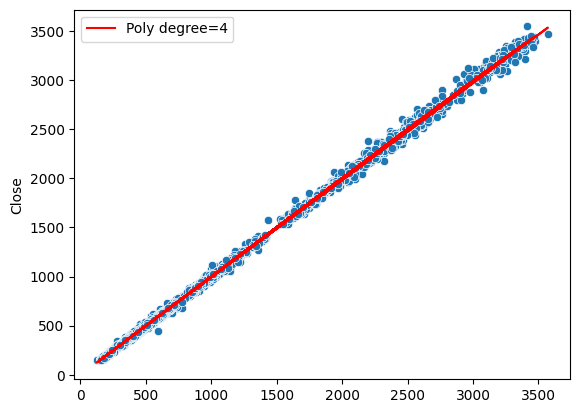

In [745]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'r-',label='Poly degree=4')
plt.legend()
plt.show()

In [746]:
yp_pred=lin.predict(X_test1)

In [747]:
print(f"MAE : {mean_absolute_error(y_test,yp_pred)}\nMSE : {mean_squared_error(y_test,yp_pred)}\nRMSE : {find_RMSE(yp_pred,y_test)}\nR2 : {r2_score(y_test,yp_pred)}\nAdj R2 : {find_adj_r2(yp_pred,y_test)}")

MAE : 13.473672457061046
MSE : 516.1500318064899
RMSE : 22.718935534185793
R2 : 0.9991954432556847
Adj R2 : 0.9991964429681741


In [748]:
poly_mae=mean_absolute_error(y_test,yp_pred)
poly_rmse=find_RMSE(yp_pred,y_test)
poly_r2=r2_score(y_test,yp_pred)

## Ridge on Polynomial of Degree 4

In [749]:
ridp=Ridge(alpha=0.1)
ridp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=5.96072e-32): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Ridge(alpha=0.1)

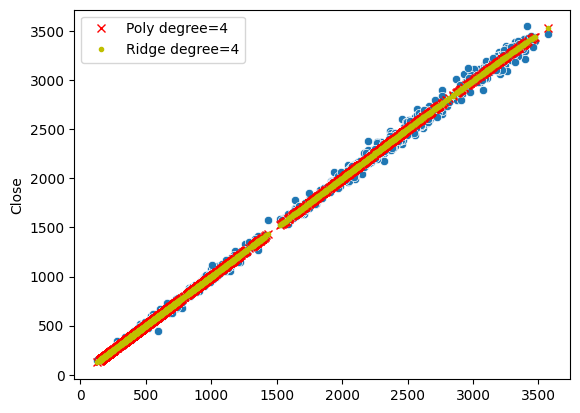

In [750]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'rx',label='Poly degree=4')
plt.plot(X_val,ridp.predict(X_poly),'y.',label='Ridge degree=4')
plt.legend()
plt.show()

In [751]:
yr_pred=ridp.predict(X_test1)

In [752]:
print(f"MAE : {mean_absolute_error(y_test,yr_pred)}\nMSE : {mean_squared_error(y_test,yr_pred)}\nRMSE : {find_RMSE(yr_pred,y_test)}\nR2 : {r2_score(y_test,yr_pred)}\nAdj R2 : {find_adj_r2(yr_pred,y_test)}")

MAE : 13.474034723440196
MSE : 516.1655954764349
RMSE : 22.71927805799372
R2 : 0.9991954189955765
Adj R2 : 0.999196429041419


In [753]:
ridp_mae=mean_absolute_error(y_test,yr_pred)
ridp_rmse=find_RMSE(yr_pred,y_test)
ridp_r2=r2_score(y_test,yr_pred)

## Lasso on Polynomial of Degree 4

In [754]:
lsp=Lasso(alpha=0.1)
lsp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.047e+06, tolerance: 2.091e+05
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.1)

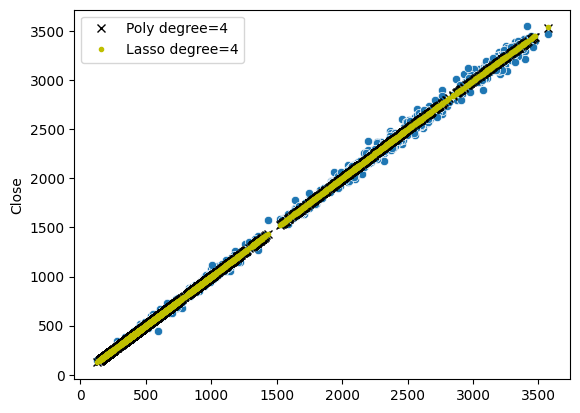

In [755]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'kx',label='Poly degree=4')
plt.plot(X_val,lsp.predict(X_poly),'y.',label='Lasso degree=4')
plt.legend()
plt.show()

In [756]:
yl_pred=lsp.predict(X_test1)

In [757]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 13.473668739710103
MSE : 514.7126331683688
RMSE : 22.687279104563615
R2 : 0.9991976838227626
Adj R2 : 0.9991984249488911


In [758]:
lsp_mae=mean_absolute_error(y_test,yl_pred)
lsp_rmse=find_RMSE(yl_pred,y_test)
lsp_r2=r2_score(y_test,yl_pred)

## Multiple Linear Regression

In [759]:
df

,Open,High,Low,Close,Adj Close,Volume
0,265.000000,313.500000,265.000000,296.649994,189.758163,192274.0
1,293.350006,304.799988,290.000000,293.200012,187.551361,114185.0
2,273.850006,298.700012,273.850006,289.700012,185.312515,364055.0
3,292.500000,301.000000,289.000000,290.100006,185.568344,217016.0
4,285.500000,289.000000,280.000000,285.100006,182.370056,178433.0
...,...,...,...,...,...,...
4065,2402.100098,2424.000000,2380.100098,2394.199951,2343.563232,1356536.0
4066,2395.050049,2414.949951,2379.500000,2408.300049,2357.364990,604516.0
4067,2418.000000,2439.250000,2411.199951,2419.449951,2368.279297,607685.0
4068,2415.199951,2451.750000,2404.100098,2442.100098,2390.450195,746590.0


In [760]:
df.drop(columns=['High','Low','Adj Close'],inplace=True)
df

,Open,Close,Volume
0,265.000000,296.649994,192274.0
1,293.350006,293.200012,114185.0
2,273.850006,289.700012,364055.0
3,292.500000,290.100006,217016.0
4,285.500000,285.100006,178433.0
...,...,...,...
4065,2402.100098,2394.199951,1356536.0
4066,2395.050049,2408.300049,604516.0
4067,2418.000000,2419.449951,607685.0
4068,2415.199951,2442.100098,746590.0


In [761]:
X=df.drop(columns=['Close'])
X

,Open,Volume
0,265.000000,192274.0
1,293.350006,114185.0
2,273.850006,364055.0
3,292.500000,217016.0
4,285.500000,178433.0
...,...,...
4065,2402.100098,1356536.0
4066,2395.050049,604516.0
4067,2418.000000,607685.0
4068,2415.199951,746590.0


In [762]:
y=df['Close']
y

0        296.649994
1        293.200012
2        289.700012
3        290.100006
4        285.100006
           ...     
4065    2394.199951
4066    2408.300049
4067    2419.449951
4068    2442.100098
4069    2456.550049
Name: Close, Length: 4063, dtype: float64

In [763]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [764]:
mlin=LinearRegression()
mlin.fit(X_train,y_train)

LinearRegression()

In [765]:
cdf=pd.DataFrame(mlin.coef_,X.columns,columns=['coef_lin'])
cdf

,coef_lin
Open,9.978257e-01
Volume,7.514817e-07


In [766]:
mlin.intercept_

0.7436971477993666

In [767]:
pred=mlin.predict(X_test)

In [768]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 13.467645726281983
MSE : 514.0114575457781
RMSE : 22.671820781440957
R2 : 0.9991987767909721
Adj R2 : 0.9991981471899233


In [769]:
mlin_mae=mean_absolute_error(y_test,pred)
mlin_rmse=find_RMSE(pred,y_test)
mlin_r2=r2_score(y_test,pred)

## Applying Ridge on Multiple Linear Regression

In [770]:
ridm=Ridge(alpha=0.1)
ridm.fit(X_train,y_train)

Ridge(alpha=0.1)

In [771]:
cdf['coef_ridge']=ridm.coef_
cdf

,coef_lin,coef_ridge
Open,9.978257e-01,9.978257e-01
Volume,7.514817e-07,7.514817e-07


In [772]:
ridm.intercept_

0.7436971917176152

In [773]:
pred=ridm.predict(X_test)

In [774]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 13.46764572428954
MSE : 514.011457446311
RMSE : 22.67182077924733
R2 : 0.9991987767911272
Adj R2 : 0.9991981471900011


In [775]:
ridm_mae=mean_absolute_error(y_test,pred)
ridm_rmse=find_RMSE(pred,y_test)
ridm_r2=r2_score(y_test,pred)

## Lasso on Multiple Linear Regression

In [776]:
lso=Lasso(alpha=0.1)
lso.fit(X_train,y_train)

Lasso(alpha=0.1)

In [777]:
cdf['coef_lasso']=lso.coef_
cdf

,coef_lin,coef_ridge,coef_lasso
Open,9.978257e-01,9.978257e-01,9.978257e-01
Volume,7.514817e-07,7.514817e-07,7.514775e-07


In [778]:
lso.intercept_

0.7436767282158598

In [779]:
pred=lso.predict(X_test)

In [780]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 13.467646658766032
MSE : 514.0115042455228
RMSE : 22.671821811348174
R2 : 0.9991987767181782
Adj R2 : 0.9991981471530411


In [781]:
lso_mae=mean_absolute_error(y_test,pred)
lso_rmse=find_RMSE(pred,y_test)
lso_r2=r2_score(y_test,pred)

In [782]:
mph_mae=pd.DataFrame()
mph_mae['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
mph_mae['MAE']=[lr_mae,rr_mae,lsr_mae,poly_mae,ridp_mae,lsp_mae,mlin_mae,ridm_mae,lso_mae]
mph_mae

,Models,MAE
0,Simple_LinearReg,13.495683
1,Ridge_alpha_0.1,13.495683
2,Lasso_alpha_0.1,13.495677
3,Poly_deg_4,13.473672
4,Ridge_0.1_Poly_4,13.474035
5,Lasso_0.1_Poly_4,13.473669
6,Mul_LinearReg,13.467646
7,Mul_Ridge_0.1,13.467646
8,Mul_Lasso_0.1,13.467647


In [783]:
mph_rmse=pd.DataFrame()
mph_rmse['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
mph_rmse['RMSE']=[lr_rmse,rr_rmse,lsr_rmse,poly_rmse,ridp_rmse,lsp_rmse,mlin_rmse,ridm_rmse,lso_rmse]
mph_rmse

,Models,RMSE
0,Simple_LinearReg,22.718360
1,Ridge_alpha_0.1,22.718360
2,Lasso_alpha_0.1,22.718355
3,Poly_deg_4,22.718936
4,Ridge_0.1_Poly_4,22.719278
5,Lasso_0.1_Poly_4,22.687279
6,Mul_LinearReg,22.671821
7,Mul_Ridge_0.1,22.671821
8,Mul_Lasso_0.1,22.671822


In [784]:
mph_r2=pd.DataFrame()
mph_r2['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
mph_r2['R2_score']=[lr_r2,rr_r2,lsr_r2,poly_r2,ridp_r2,lsp_r2,mlin_r2,ridm_r2,lso_r2]
mph_r2

,Models,R2_score
0,Simple_LinearReg,0.999195
1,Ridge_alpha_0.1,0.999195
2,Lasso_alpha_0.1,0.999195
3,Poly_deg_4,0.999195
4,Ridge_0.1_Poly_4,0.999195
5,Lasso_0.1_Poly_4,0.999198
6,Mul_LinearReg,0.999199
7,Mul_Ridge_0.1,0.999199
8,Mul_Lasso_0.1,0.999199


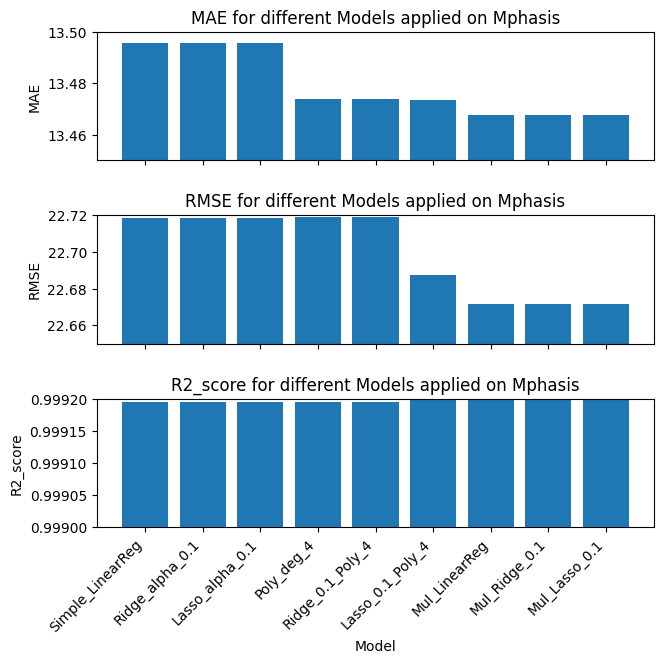

In [785]:
fig,ax=plt.subplots(nrows=3,ncols=1,sharex=True,figsize=(7, 7))
ax[0].bar(mph_mae['Models'], mph_mae['MAE'])
ax[0].set_xticks(range(len(mph_mae['Models'])))  
ax[0].set_xticklabels(mph_mae['Models'], rotation=45, ha='right')  
ax[0].set_ylabel('MAE')
ax[0].set_title('MAE for different Models applied on Mphasis')
ax[0].set_ylim(13.45, 13.5)

ax[1].bar(mph_rmse['Models'], mph_rmse['RMSE'])
ax[1].set_xticks(range(len(mph_rmse['Models']))) 
ax[1].set_xticklabels(mph_rmse['Models'], rotation=45, ha='right')  
ax[1].set_ylabel('RMSE')
ax[1].set_title('RMSE for different Models applied on Mphasis')
ax[1].set_ylim(22.65, 22.72)

ax[2].bar(mph_r2['Models'], mph_r2['R2_score'])
ax[2].set_xticks(range(len(mph_r2['Models'])))  
ax[2].set_xticklabels(mph_r2['Models'], rotation=45, ha='right') 
ax[2].set_xlabel('Model')
ax[2].set_ylabel('R2_score')
ax[2].set_title('R2_score for different Models applied on Mphasis')
ax[2].set_ylim(0.999,0.9992)
plt.tight_layout(pad=2.0)
plt.show()

## ElasticNet

In [786]:
# eln=ElasticNet(alpha=1,l1_ratio=0.5)
# eln.fit(X_train,y_train)

In [787]:
# cdf['coef_elnet']=eln.coef_
# cdf

In [788]:
# eln.intercept_

In [789]:
# pred=eln.predict(X_test)

In [790]:
# print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

In [791]:
# eln_mae=mean_absolute_error(y_test,pred)
# eln_rmse=find_RMSE(pred,y_test)
# eln_r2=r2_score(y_test,pred)

## Comparisons

In [792]:
new_row=pd.DataFrame({
    'Companies' : ['Mphasis'],
    'Simple_LinearReg' : [lr_mae],
    'Ridge_alpha_0.1' : [rr_mae],
    'Lasso_alpha_0.1' : [lsr_mae],
    'Poly_deg_4' : [poly_mae],
    'Ridge_0.1_Poly_4' : [ridp_mae],
    'Lasso_0.1_Poly_4' : [lsp_mae],
   })
mean_abs_err=pd.concat([mean_abs_err,new_row],ignore_index=True)
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,2.703910,2.703910,2.703907,2.714773,2.714773,2.720406
1,HCL Tech,5.246393,5.246393,5.246396,5.261852,5.261851,5.271076
2,INFY,6.620008,6.620008,6.620010,6.629635,6.629620,6.635311
3,TECH M,7.289615,7.289615,7.289625,7.269143,7.269136,7.267302
4,Coforge,22.247317,22.247317,22.247324,21.810074,21.809277,21.837951
5,LTTS,37.354296,37.354296,37.354301,37.483645,37.482837,37.438588
6,LTIM,39.835657,39.835657,39.835660,39.682086,39.681623,39.689020
7,TCS,15.393910,15.393910,15.393912,15.364555,15.364460,15.396296
8,Mphasis,13.495683,13.495683,13.495677,13.473672,13.474035,13.473669


In [793]:
new_row=pd.DataFrame({
    'Companies' : ['Mphasis'],
    'Mul_LinearReg' : [mlin_mae],
    'Mul_Ridge_0.1' : [ridm_mae],
    'Mul_Lasso_0.1' : [lso_mae]
    # 'ElasticNet' : [eln_mae]
})
mul_mean_abs_err=pd.concat([mul_mean_abs_err,new_row],ignore_index=True)
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,2.730339,2.730339,2.730348
1,HCL Tech,5.243260,5.243260,5.243263
2,INFY,6.620608,6.620608,6.620608
3,TECH M,7.231938,7.231938,7.231937
4,Coforge,22.244618,22.244618,22.244620
5,LTTS,36.180698,36.180698,36.180698
6,LTIM,39.575640,39.575640,39.575639
7,TCS,15.404589,15.404589,15.404589
8,Mphasis,13.467646,13.467646,13.467647


In [794]:
new_row=pd.DataFrame({
    'Companies' : ['Mphasis'],
    'Simple_LinearReg' : [lr_rmse],
    'Ridge_alpha_0.1' : [rr_rmse],
    'Lasso_alpha_0.1' : [lsr_rmse],
    'Poly_deg_4' : [poly_rmse],
    'Ridge_0.1_Poly_4' : [ridp_rmse],
    'Lasso_0.1_Poly_4' : [lsp_rmse],
    })
root_mean_sq_err=pd.concat([root_mean_sq_err,new_row],ignore_index=True)
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.862410,3.862410,3.859339
1,HCL Tech,8.427889,8.427889,8.427888,8.455405,8.455404,8.462473
2,INFY,10.216314,10.216314,10.216320,10.214395,10.214364,10.215232
3,TECH M,11.076269,11.076269,11.076273,11.046103,11.046095,11.041298
4,Coforge,46.730659,46.730659,46.730655,46.301766,46.299727,46.288683
5,LTTS,59.965943,59.965943,59.965948,60.037481,60.035358,59.980291
6,LTIM,63.112070,63.112070,63.112068,62.837664,62.831658,62.825551
7,TCS,23.681696,23.681696,23.681695,23.646995,23.646904,23.677479
8,Mphasis,22.718360,22.718360,22.718355,22.718936,22.719278,22.687279


In [795]:
new_row=pd.DataFrame({
    'Companies' : ['Mphasis'],
    'Mul_LinearReg' : [mlin_rmse],
    'Mul_Ridge_0.1' : [ridm_rmse],
    'Mul_Lasso_0.1' : [lso_rmse]
    # 'ElasticNet' : [eln_rmse]
})
mul_root_mean_sq_err=pd.concat([mul_root_mean_sq_err,new_row],ignore_index=True)
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,3.890457,3.890457,3.890457
1,HCL Tech,8.431783,8.431783,8.431781
2,INFY,10.220077,10.220077,10.220072
3,TECH M,11.022439,11.022439,11.022441
4,Coforge,46.250577,46.250577,46.250581
5,LTTS,56.092029,56.092029,56.092027
6,LTIM,66.368363,66.368363,66.368359
7,TCS,23.677861,23.677861,23.677860
8,Mphasis,22.671821,22.671821,22.671822


In [796]:
new_row=pd.DataFrame({
    'Companies' : ['Mphasis'],
    'Simple_LinearReg' : [lr_r2],
    'Ridge_alpha_0.1' : [rr_r2],
    'Lasso_alpha_0.1' : [lsr_r2],
    'Poly_deg_4' : [poly_r2],
    'Ridge_0.1_Poly_4' : [ridp_r2],
    'Lasso_0.1_Poly_4' : [lsp_r2],
    })
R2_score=pd.concat([R2_score,new_row],ignore_index=True)
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204,0.999205
1,HCL Tech,0.999546,0.999546,0.999546,0.999543,0.999543,0.999542
2,INFY,0.999534,0.999534,0.999534,0.999534,0.999534,0.999534
3,TECH M,0.999202,0.999202,0.999202,0.999206,0.999206,0.999207
4,Coforge,0.999256,0.999256,0.999256,0.999270,0.999270,0.999270
5,LTTS,0.998478,0.998478,0.998478,0.998474,0.998474,0.998477
6,LTIM,0.998897,0.998897,0.998897,0.998906,0.998907,0.998907
7,TCS,0.999581,0.999581,0.999581,0.999582,0.999582,0.999581
8,Mphasis,0.999195,0.999195,0.999195,0.999195,0.999195,0.999198


In [797]:
new_row=pd.DataFrame({
    'Companies' : ['Mphasis'],
    'Mul_LinearReg' : [mlin_r2],
    'Mul_Ridge_0.1' : [ridm_r2],
    'Mul_Lasso_0.1' : [lso_r2]
    # 'ElasticNet' : [eln_r2]
})
mul_R2_score=pd.concat([mul_R2_score,new_row],ignore_index=True)
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,0.999192,0.999192,0.999192
1,HCL Tech,0.999545,0.999545,0.999545
2,INFY,0.999534,0.999534,0.999534
3,TECH M,0.999210,0.999210,0.999210
4,Coforge,0.999271,0.999271,0.999271
5,LTTS,0.998668,0.998668,0.998668
6,LTIM,0.998780,0.998780,0.998780
7,TCS,0.999581,0.999581,0.999581
8,Mphasis,0.999199,0.999199,0.999199


## Persistent

In [798]:
data=pd.read_csv('PERSISTENT.NS.csv')
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-05-03,98.699997,100.650002,98.699997,99.887497,84.027924,883408.0
1,2010-05-04,99.750000,101.112503,98.000000,98.287498,82.681946,695748.0
2,2010-05-05,97.250000,99.650002,90.050003,99.112503,83.375954,548156.0
3,2010-05-06,99.474998,99.750000,96.062500,96.612503,81.272896,400652.0
4,2010-05-07,95.750000,96.224998,93.750000,94.037498,79.106743,381824.0
...,...,...,...,...,...,...,...
3496,2024-06-24,3939.949951,4031.199951,3892.949951,3968.100098,3959.447998,650360.0
3497,2024-06-25,3999.899902,4008.899902,3951.699951,3974.199951,3965.534668,152461.0
3498,2024-06-26,3985.000000,3999.899902,3940.000000,3950.899902,3942.285400,268164.0
3499,2024-06-27,3950.899902,4057.000000,3902.850098,4031.600098,4022.809570,644155.0


In [799]:
data.shape

(3501, 7)

In [800]:
data.isnull().sum()

Date         0
Open         6
High         6
Low          6
Close        6
Adj Close    6
Volume       6
dtype: int64

In [801]:
data=data.dropna()
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [802]:
df=data.drop(columns=['Date'])
df

,Open,High,Low,Close,Adj Close,Volume
0,98.699997,100.650002,98.699997,99.887497,84.027924,883408.0
1,99.750000,101.112503,98.000000,98.287498,82.681946,695748.0
2,97.250000,99.650002,90.050003,99.112503,83.375954,548156.0
3,99.474998,99.750000,96.062500,96.612503,81.272896,400652.0
4,95.750000,96.224998,93.750000,94.037498,79.106743,381824.0
...,...,...,...,...,...,...
3496,3939.949951,4031.199951,3892.949951,3968.100098,3959.447998,650360.0
3497,3999.899902,4008.899902,3951.699951,3974.199951,3965.534668,152461.0
3498,3985.000000,3999.899902,3940.000000,3950.899902,3942.285400,268164.0
3499,3950.899902,4057.000000,3902.850098,4031.600098,4022.809570,644155.0


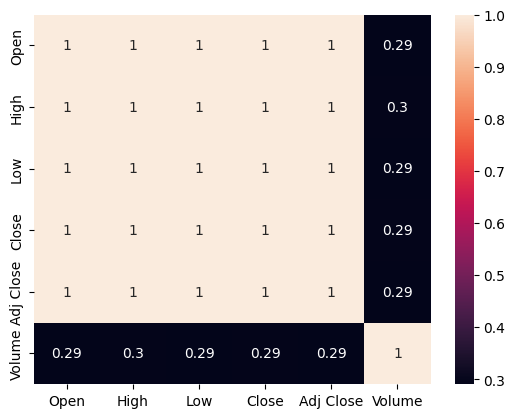

In [803]:
sns.heatmap(df.corr(),annot=True)
plt.show()

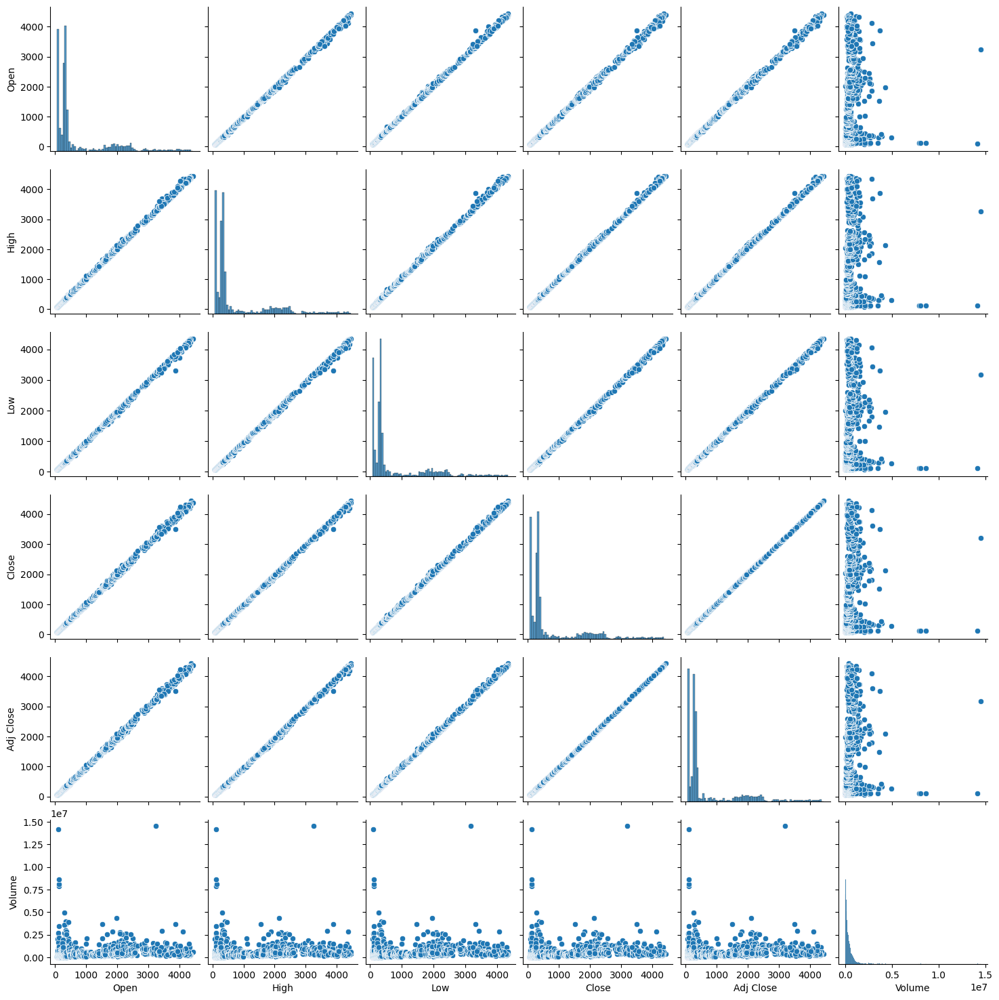

In [804]:
sns.pairplot(df)
plt.show()

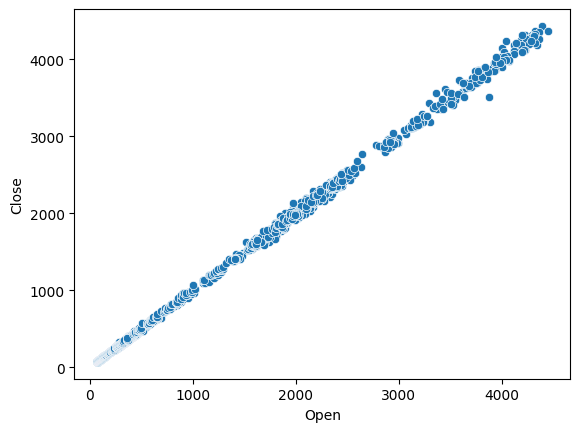

In [805]:
sns.scatterplot(x=df['Open'],y=df['Close'])
plt.show()

In [806]:
X=df[['Open']]
X

,Open
0,98.699997
1,99.750000
2,97.250000
3,99.474998
4,95.750000
...,...
3496,3939.949951
3497,3999.899902
3498,3985.000000
3499,3950.899902


In [807]:
y=df['Close']
y

0         99.887497
1         98.287498
2         99.112503
3         96.612503
4         94.037498
           ...     
3496    3968.100098
3497    3974.199951
3498    3950.899902
3499    4031.600098
3500    4241.450195
Name: Close, Length: 3495, dtype: float64

## Simple Linear Regression

In [808]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [809]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [810]:
print(f"Coefficient : {lr.coef_}\nintercept : {lr.intercept_}")

Coefficient : [0.99916528]
intercept : -0.009771556128953307


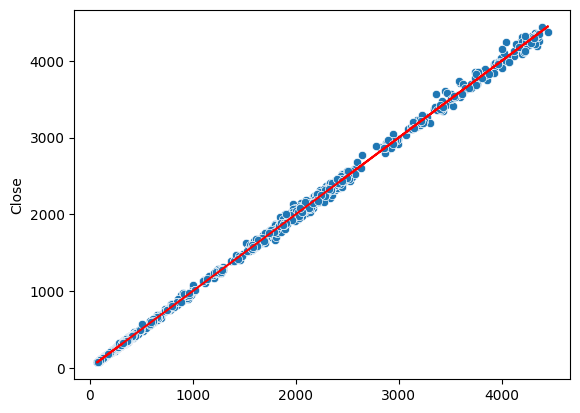

In [811]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),color='red')
plt.show()

In [812]:
pred=lr.predict(X_test)

In [813]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 10.272902447429699
MSE : 602.5133332967387
RMSE : 24.54614701530036
R2 : 0.999258086127696
Adj R2 : 0.9992612992596166


In [814]:
lr_mae=mean_absolute_error(y_test,pred)
lr_rmse=find_RMSE(pred,y_test)
lr_r2=r2_score(y_test,pred)

## Ridge

In [815]:
rr=Ridge(alpha=0.1)
rr.fit(X_train,y_train)

Ridge(alpha=0.1)

In [816]:
print(rr.coef_,rr.intercept_)

[0.99916528] -0.009771527359021093


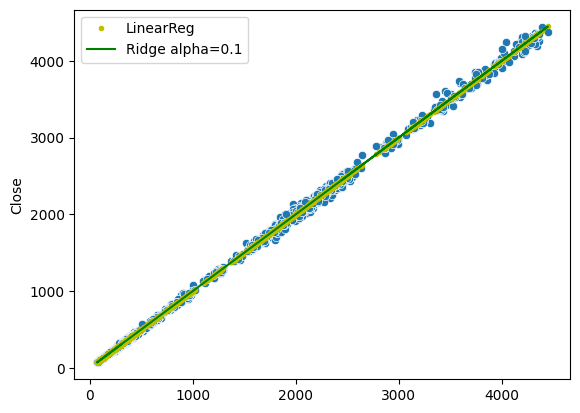

In [817]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'y.',label='LinearReg')
plt.plot(X_val,rr.predict(X_train),color='green',label='Ridge alpha=0.1')
plt.legend()
plt.show()

In [818]:
y_pred=rr.predict(X_test)

In [819]:
print(f"MAE : {mean_absolute_error(y_test,y_pred)}\nMSE : {mean_squared_error(y_test,y_pred)}\nRMSE : {find_RMSE(y_pred,y_test)}\nR2 : {r2_score(y_test,y_pred)}\nAdj R2 : {find_adj_r2(y_pred,y_test)}")

MAE : 10.272902447378337
MSE : 602.513333109105
RMSE : 24.5461470114783
R2 : 0.999258086127927
Adj R2 : 0.9992612992597919


In [820]:
rr_mae=mean_absolute_error(y_test,y_pred)
rr_rmse=find_RMSE(y_pred,y_test)
rr_r2=r2_score(y_test,y_pred)

## Lasso

In [821]:
lsr=Lasso(alpha=0.1)
lsr.fit(X_train,y_train)

Lasso(alpha=0.1)

In [822]:
print(lsr.coef_,lsr.intercept_)

[0.99916518] -0.009691048110425982


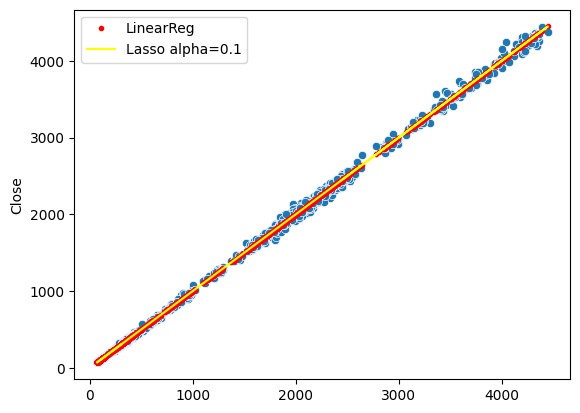

In [823]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lr.predict(X_train),'r.',label='LinearReg')
plt.plot(X_val,lsr.predict(X_train),color='yellow',label='Lasso alpha=0.1')
plt.legend()
plt.show()

In [824]:
yl_pred=lsr.predict(X_test)

In [825]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 10.272902303682018
MSE : 602.5128082427487
RMSE : 24.54613632005552
R2 : 0.9992580867742291
Adj R2 : 0.9992612997501553


In [826]:
lsr_mae=mean_absolute_error(y_test,yl_pred)
lsr_rmse=find_RMSE(yl_pred,y_test)
lsr_r2=r2_score(y_test,yl_pred)

## Polynomial of Degree 4

In [827]:
poly=PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X_train)
X_test1=poly.transform(X_test)
poly.fit(X_poly,y_train)
lin=LinearRegression()
lin.fit(X_poly,y_train)

LinearRegression()

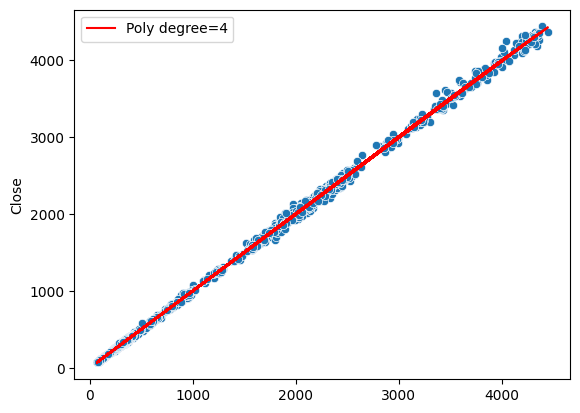

In [828]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'r-',label='Poly degree=4')
plt.legend()
plt.show()

In [829]:
yp_pred=lin.predict(X_test1)

In [830]:
print(f"MAE : {mean_absolute_error(y_test,yp_pred)}\nMSE : {mean_squared_error(y_test,yp_pred)}\nRMSE : {find_RMSE(yp_pred,y_test)}\nR2 : {r2_score(y_test,yp_pred)}\nAdj R2 : {find_adj_r2(yp_pred,y_test)}")

MAE : 10.381794062555635
MSE : 606.6098879169231
RMSE : 24.629451636545284
R2 : 0.9992530417734329
Adj R2 : 0.9992572127326691


In [831]:
poly_mae=mean_absolute_error(y_test,yp_pred)
poly_rmse=find_RMSE(yp_pred,y_test)
poly_r2=r2_score(y_test,yp_pred)

## Ridge on Polynomial of Degree 4

In [832]:
ridp=Ridge(alpha=0.1)
ridp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=1.43649e-32): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Ridge(alpha=0.1)

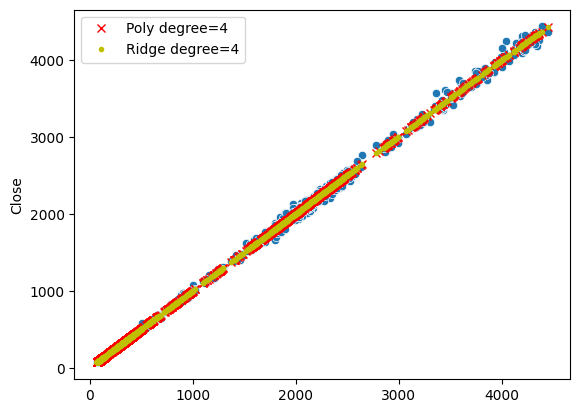

In [833]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'rx',label='Poly degree=4')
plt.plot(X_val,ridp.predict(X_poly),'y.',label='Ridge degree=4')
plt.legend()
plt.show()

In [834]:
yr_pred=ridp.predict(X_test1)

In [835]:
print(f"MAE : {mean_absolute_error(y_test,yr_pred)}\nMSE : {mean_squared_error(y_test,yr_pred)}\nRMSE : {find_RMSE(yr_pred,y_test)}\nR2 : {r2_score(y_test,yr_pred)}\nAdj R2 : {find_adj_r2(yr_pred,y_test)}")

MAE : 10.38158951153328
MSE : 606.5486261953628
RMSE : 24.62820793714725
R2 : 0.9992531172089769
Adj R2 : 0.9992572786306718


In [836]:
ridp_mae=mean_absolute_error(y_test,yr_pred)
ridp_rmse=find_RMSE(yr_pred,y_test)
ridp_r2=r2_score(y_test,yr_pred)

## Lasso on Polynomial of Degree 4

In [837]:
lsp=Lasso(alpha=0.1)
lsp.fit(X_poly,y_train)

C:\Users\SPANDAN CHATTERJEE\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.406e+05, tolerance: 2.696e+05
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.1)

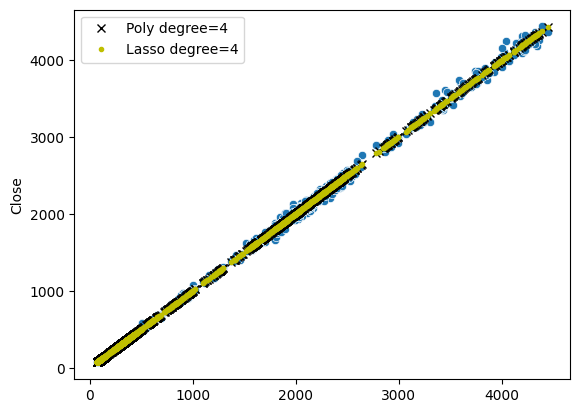

In [838]:
X_val=X_train['Open'].values
sns.scatterplot(x=X_val,y=y_train)
plt.plot(X_val,lin.predict(X_poly),'kx',label='Poly degree=4')
plt.plot(X_val,lsp.predict(X_poly),'y.',label='Lasso degree=4')
plt.legend()
plt.show()

In [839]:
yl_pred=lsp.predict(X_test1)

In [840]:
print(f"MAE : {mean_absolute_error(y_test,yl_pred)}\nMSE : {mean_squared_error(y_test,yl_pred)}\nRMSE : {find_RMSE(yl_pred,y_test)}\nR2 : {r2_score(y_test,yl_pred)}\nAdj R2 : {find_adj_r2(yl_pred,y_test)}")

MAE : 10.313062672516692
MSE : 602.4652354520732
RMSE : 24.54516725247708
R2 : 0.9992581453537018
Adj R2 : 0.9992619274899973


In [841]:
lsp_mae=mean_absolute_error(y_test,yl_pred)
lsp_rmse=find_RMSE(yl_pred,y_test)
lsp_r2=r2_score(y_test,yl_pred)

## Multiple Linear Regression

In [842]:
df

,Open,High,Low,Close,Adj Close,Volume
0,98.699997,100.650002,98.699997,99.887497,84.027924,883408.0
1,99.750000,101.112503,98.000000,98.287498,82.681946,695748.0
2,97.250000,99.650002,90.050003,99.112503,83.375954,548156.0
3,99.474998,99.750000,96.062500,96.612503,81.272896,400652.0
4,95.750000,96.224998,93.750000,94.037498,79.106743,381824.0
...,...,...,...,...,...,...
3496,3939.949951,4031.199951,3892.949951,3968.100098,3959.447998,650360.0
3497,3999.899902,4008.899902,3951.699951,3974.199951,3965.534668,152461.0
3498,3985.000000,3999.899902,3940.000000,3950.899902,3942.285400,268164.0
3499,3950.899902,4057.000000,3902.850098,4031.600098,4022.809570,644155.0


In [843]:
df.drop(columns=['High','Low','Adj Close'],inplace=True)
df

,Open,Close,Volume
0,98.699997,99.887497,883408.0
1,99.750000,98.287498,695748.0
2,97.250000,99.112503,548156.0
3,99.474998,96.612503,400652.0
4,95.750000,94.037498,381824.0
...,...,...,...
3496,3939.949951,3968.100098,650360.0
3497,3999.899902,3974.199951,152461.0
3498,3985.000000,3950.899902,268164.0
3499,3950.899902,4031.600098,644155.0


In [844]:
X=df.drop(columns=['Close'])
X

,Open,Volume
0,98.699997,883408.0
1,99.750000,695748.0
2,97.250000,548156.0
3,99.474998,400652.0
4,95.750000,381824.0
...,...,...
3496,3939.949951,650360.0
3497,3999.899902,152461.0
3498,3985.000000,268164.0
3499,3950.899902,644155.0


In [845]:
y=df['Close']
y

0         99.887497
1         98.287498
2         99.112503
3         96.612503
4         94.037498
           ...     
3496    3968.100098
3497    3974.199951
3498    3950.899902
3499    4031.600098
3500    4241.450195
Name: Close, Length: 3495, dtype: float64

In [846]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [847]:
mlin=LinearRegression()
mlin.fit(X_train,y_train)

LinearRegression()

In [848]:
cdf=pd.DataFrame(mlin.coef_,X.columns,columns=['coef_lin'])
cdf

,coef_lin
Open,0.998267
Volume,0.000005


In [849]:
mlin.intercept_

-1.135160855535446

In [850]:
pred=mlin.predict(X_test)

In [851]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 10.537470698293589
MSE : 620.2601144449109
RMSE : 24.90502187200226
R2 : 0.9992362333613007
Adj R2 : 0.9992384194464139


In [852]:
mlin_mae=mean_absolute_error(y_test,pred)
mlin_rmse=find_RMSE(pred,y_test)
mlin_r2=r2_score(y_test,pred)

## Ridge on Multiple Linear Regression

In [853]:
ridm=Ridge(alpha=0.1)
ridm.fit(X_train,y_train)

Ridge(alpha=0.1)

In [854]:
cdf['coef_ridge']=ridm.coef_
cdf

,coef_lin,coef_ridge
Open,0.998267,0.998267
Volume,0.000005,0.000005


In [855]:
ridm.intercept_

-1.1351608330440968

In [856]:
pred=ridm.predict(X_test)

In [857]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 10.537470698634905
MSE : 620.2601144522895
RMSE : 24.905021872150392
R2 : 0.9992362333612916
Adj R2 : 0.9992384194463483


In [858]:
ridm_mae=mean_absolute_error(y_test,pred)
ridm_rmse=find_RMSE(pred,y_test)
ridm_r2=r2_score(y_test,pred)

## Lasso on Multiple Linear Regression

In [859]:
lso=Lasso(alpha=0.1)
lso.fit(X_train,y_train)

Lasso(alpha=0.1)

In [860]:
cdf['coef_lasso']=lso.coef_
cdf

,coef_lin,coef_ridge,coef_lasso
Open,0.998267,0.998267,0.998267
Volume,0.000005,0.000005,0.000005


In [861]:
lso.intercept_

-1.1351938429673964

In [862]:
pred=lso.predict(X_test)

In [863]:
print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

MAE : 10.537470158259069
MSE : 620.260100554374
RMSE : 24.90502159313206
R2 : 0.9992362333784051
Adj R2 : 0.9992384195465364


In [864]:
lso_mae=mean_absolute_error(y_test,pred)
lso_rmse=find_RMSE(pred,y_test)
lso_r2=r2_score(y_test,pred)

In [865]:
per_mae=pd.DataFrame()
per_mae['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
per_mae['MAE']=[lr_mae,rr_mae,lsr_mae,poly_mae,ridp_mae,lsp_mae,mlin_mae,ridm_mae,lso_mae]
per_mae

,Models,MAE
0,Simple_LinearReg,10.272902
1,Ridge_alpha_0.1,10.272902
2,Lasso_alpha_0.1,10.272902
3,Poly_deg_4,10.381794
4,Ridge_0.1_Poly_4,10.381590
5,Lasso_0.1_Poly_4,10.313063
6,Mul_LinearReg,10.537471
7,Mul_Ridge_0.1,10.537471
8,Mul_Lasso_0.1,10.537470


In [866]:
per_rmse=pd.DataFrame()
per_rmse['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
per_rmse['RMSE']=[lr_rmse,rr_rmse,lsr_rmse,poly_rmse,ridp_rmse,lsp_rmse,mlin_rmse,ridm_rmse,lso_rmse]
per_rmse

,Models,RMSE
0,Simple_LinearReg,24.546147
1,Ridge_alpha_0.1,24.546147
2,Lasso_alpha_0.1,24.546136
3,Poly_deg_4,24.629452
4,Ridge_0.1_Poly_4,24.628208
5,Lasso_0.1_Poly_4,24.545167
6,Mul_LinearReg,24.905022
7,Mul_Ridge_0.1,24.905022
8,Mul_Lasso_0.1,24.905022


In [867]:
per_r2=pd.DataFrame()
per_r2['Models']= ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
per_r2['R2_score']=[lr_r2,rr_r2,lsr_r2,poly_r2,ridp_r2,lsp_r2,mlin_r2,ridm_r2,lso_r2]
per_r2

,Models,R2_score
0,Simple_LinearReg,0.999258
1,Ridge_alpha_0.1,0.999258
2,Lasso_alpha_0.1,0.999258
3,Poly_deg_4,0.999253
4,Ridge_0.1_Poly_4,0.999253
5,Lasso_0.1_Poly_4,0.999258
6,Mul_LinearReg,0.999236
7,Mul_Ridge_0.1,0.999236
8,Mul_Lasso_0.1,0.999236


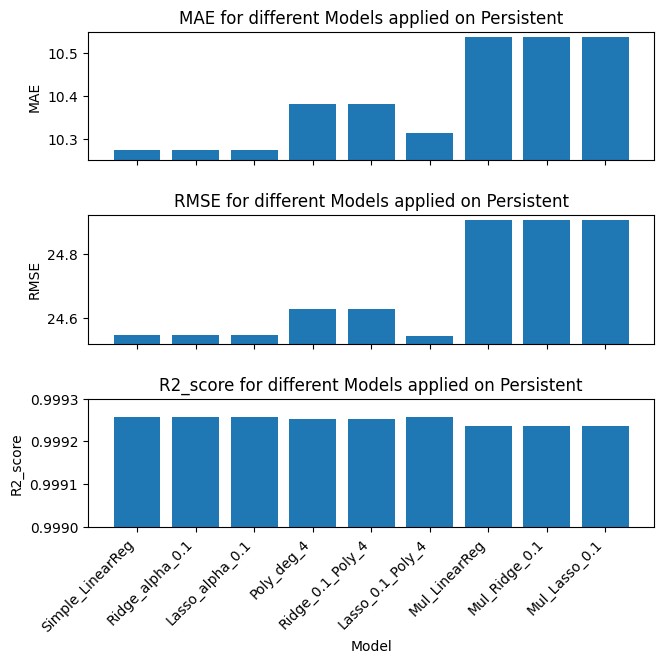

In [868]:
fig,ax=plt.subplots(nrows=3,ncols=1,sharex=True,figsize=(7, 7))
ax[0].bar(per_mae['Models'], per_mae['MAE'])
ax[0].set_xticks(range(len(per_mae['Models'])))  
ax[0].set_xticklabels(per_mae['Models'], rotation=45, ha='right')  
ax[0].set_ylabel('MAE')
ax[0].set_title('MAE for different Models applied on Persistent')
ax[0].set_ylim(10.25, 10.55)

ax[1].bar(per_rmse['Models'], per_rmse['RMSE'])
ax[1].set_xticks(range(len(per_rmse['Models']))) 
ax[1].set_xticklabels(per_rmse['Models'], rotation=45, ha='right')  
ax[1].set_ylabel('RMSE')
ax[1].set_title('RMSE for different Models applied on Persistent')
ax[1].set_ylim(24.52, 24.92)

ax[2].bar(per_r2['Models'], per_r2['R2_score'])
ax[2].set_xticks(range(len(per_r2['Models'])))  
ax[2].set_xticklabels(per_r2['Models'], rotation=45, ha='right') 
ax[2].set_xlabel('Model')
ax[2].set_ylabel('R2_score')
ax[2].set_title('R2_score for different Models applied on Persistent')
ax[2].set_ylim(0.999,0.9993)
plt.tight_layout(pad=2.0)
plt.show()

## ElasticNet

In [869]:
# eln=ElasticNet(alpha=1,l1_ratio=0.5)
# eln.fit(X_train,y_train)

In [870]:
# cdf['coef_elnet']=eln.coef_
# cdf

In [871]:
# eln.intercept_

In [872]:
# pred=eln.predict(X_test)

In [873]:
# print(f"MAE : {mean_absolute_error(y_test,pred)}\nMSE : {mean_squared_error(y_test,pred)}\nRMSE : {find_RMSE(pred,y_test)}\nR2 : {r2_score(y_test,pred)}\nAdj R2 : {find_adj_r2(pred,y_test)}")

In [874]:
# eln_mae=mean_absolute_error(y_test,pred)
# eln_rmse=find_RMSE(pred,y_test)
# eln_r2=r2_score(y_test,pred)

## Comparisons

In [875]:
new_row=pd.DataFrame({
    'Companies' : ['Persistent'],
    'Simple_LinearReg' : [lr_mae],
    'Ridge_alpha_0.1' : [rr_mae],
    'Lasso_alpha_0.1' : [lsr_mae],
    'Poly_deg_4' : [poly_mae],
    'Ridge_0.1_Poly_4' : [ridp_mae],
    'Lasso_0.1_Poly_4' : [lsp_mae],
   })
mean_abs_err=pd.concat([mean_abs_err,new_row],ignore_index=True)
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,2.703910,2.703910,2.703907,2.714773,2.714773,2.720406
1,HCL Tech,5.246393,5.246393,5.246396,5.261852,5.261851,5.271076
2,INFY,6.620008,6.620008,6.620010,6.629635,6.629620,6.635311
3,TECH M,7.289615,7.289615,7.289625,7.269143,7.269136,7.267302
4,Coforge,22.247317,22.247317,22.247324,21.810074,21.809277,21.837951
5,LTTS,37.354296,37.354296,37.354301,37.483645,37.482837,37.438588
6,LTIM,39.835657,39.835657,39.835660,39.682086,39.681623,39.689020
7,TCS,15.393910,15.393910,15.393912,15.364555,15.364460,15.396296
8,Mphasis,13.495683,13.495683,13.495677,13.473672,13.474035,13.473669
9,Persistent,10.272902,10.272902,10.272902,10.381794,10.381590,10.313063


In [876]:
new_row=pd.DataFrame({
    'Companies' : ['Persistent'],
    'Mul_LinearReg' : [mlin_mae],
    'Mul_Ridge_0.1' : [ridm_mae],
    'Mul_Lasso_0.1' : [lso_mae]
    # 'ElasticNet' : [eln_mae]
})
mul_mean_abs_err=pd.concat([mul_mean_abs_err,new_row],ignore_index=True)
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,2.730339,2.730339,2.730348
1,HCL Tech,5.243260,5.243260,5.243263
2,INFY,6.620608,6.620608,6.620608
3,TECH M,7.231938,7.231938,7.231937
4,Coforge,22.244618,22.244618,22.244620
5,LTTS,36.180698,36.180698,36.180698
6,LTIM,39.575640,39.575640,39.575639
7,TCS,15.404589,15.404589,15.404589
8,Mphasis,13.467646,13.467646,13.467647
9,Persistent,10.537471,10.537471,10.537470


In [877]:
new_row=pd.DataFrame({
    'Companies' : ['Persistent'],
    'Simple_LinearReg' : [lr_rmse],
    'Ridge_alpha_0.1' : [rr_rmse],
    'Lasso_alpha_0.1' : [lsr_rmse],
    'Poly_deg_4' : [poly_rmse],
    'Ridge_0.1_Poly_4' : [ridp_rmse],
    'Lasso_0.1_Poly_4' : [lsp_rmse],
    })
root_mean_sq_err=pd.concat([root_mean_sq_err,new_row],ignore_index=True)
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.862410,3.862410,3.859339
1,HCL Tech,8.427889,8.427889,8.427888,8.455405,8.455404,8.462473
2,INFY,10.216314,10.216314,10.216320,10.214395,10.214364,10.215232
3,TECH M,11.076269,11.076269,11.076273,11.046103,11.046095,11.041298
4,Coforge,46.730659,46.730659,46.730655,46.301766,46.299727,46.288683
5,LTTS,59.965943,59.965943,59.965948,60.037481,60.035358,59.980291
6,LTIM,63.112070,63.112070,63.112068,62.837664,62.831658,62.825551
7,TCS,23.681696,23.681696,23.681695,23.646995,23.646904,23.677479
8,Mphasis,22.718360,22.718360,22.718355,22.718936,22.719278,22.687279
9,Persistent,24.546147,24.546147,24.546136,24.629452,24.628208,24.545167


In [878]:
new_row=pd.DataFrame({
    'Companies' : ['Persistent'],
    'Mul_LinearReg' : [mlin_rmse],
    'Mul_Ridge_0.1' : [ridm_rmse],
    'Mul_Lasso_0.1' : [lso_rmse]
    # 'ElasticNet' : [eln_rmse]
})
mul_root_mean_sq_err=pd.concat([mul_root_mean_sq_err,new_row],ignore_index=True)
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,3.890457,3.890457,3.890457
1,HCL Tech,8.431783,8.431783,8.431781
2,INFY,10.220077,10.220077,10.220072
3,TECH M,11.022439,11.022439,11.022441
4,Coforge,46.250577,46.250577,46.250581
5,LTTS,56.092029,56.092029,56.092027
6,LTIM,66.368363,66.368363,66.368359
7,TCS,23.677861,23.677861,23.677860
8,Mphasis,22.671821,22.671821,22.671822
9,Persistent,24.905022,24.905022,24.905022


In [879]:
new_row=pd.DataFrame({
    'Companies' : ['Persistent'],
    'Simple_LinearReg' : [lr_r2],
    'Ridge_alpha_0.1' : [rr_r2],
    'Lasso_alpha_0.1' : [lsr_r2],
    'Poly_deg_4' : [poly_r2],
    'Ridge_0.1_Poly_4' : [ridp_r2],
    'Lasso_0.1_Poly_4' : [lsp_r2],
    })
R2_score=pd.concat([R2_score,new_row],ignore_index=True)
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204,0.999205
1,HCL Tech,0.999546,0.999546,0.999546,0.999543,0.999543,0.999542
2,INFY,0.999534,0.999534,0.999534,0.999534,0.999534,0.999534
3,TECH M,0.999202,0.999202,0.999202,0.999206,0.999206,0.999207
4,Coforge,0.999256,0.999256,0.999256,0.999270,0.999270,0.999270
5,LTTS,0.998478,0.998478,0.998478,0.998474,0.998474,0.998477
6,LTIM,0.998897,0.998897,0.998897,0.998906,0.998907,0.998907
7,TCS,0.999581,0.999581,0.999581,0.999582,0.999582,0.999581
8,Mphasis,0.999195,0.999195,0.999195,0.999195,0.999195,0.999198
9,Persistent,0.999258,0.999258,0.999258,0.999253,0.999253,0.999258


In [880]:
new_row=pd.DataFrame({
    'Companies' : ['Persistent'],
    'Mul_LinearReg' : [mlin_r2],
    'Mul_Ridge_0.1' : [ridm_r2],
    'Mul_Lasso_0.1' : [lso_r2]
    # 'ElasticNet' : [eln_r2]
})
mul_R2_score=pd.concat([mul_R2_score,new_row],ignore_index=True)
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,0.999192,0.999192,0.999192
1,HCL Tech,0.999545,0.999545,0.999545
2,INFY,0.999534,0.999534,0.999534
3,TECH M,0.999210,0.999210,0.999210
4,Coforge,0.999271,0.999271,0.999271
5,LTTS,0.998668,0.998668,0.998668
6,LTIM,0.998780,0.998780,0.998780
7,TCS,0.999581,0.999581,0.999581
8,Mphasis,0.999199,0.999199,0.999199
9,Persistent,0.999236,0.999236,0.999236


## Conclusion

In [881]:
new_row=pd.DataFrame({
    'Companies' : ['AVERAGE'],
    'Simple_LinearReg' : [mean_abs_err['Simple_LinearReg'].mean()],
    'Ridge_alpha_0.1' : [mean_abs_err['Ridge_alpha_0.1'].mean()],
    'Lasso_alpha_0.1' : [mean_abs_err['Lasso_alpha_0.1'].mean()],
    'Poly_deg_4' : [mean_abs_err['Poly_deg_4'].mean()],
    'Ridge_0.1_Poly_4' : [mean_abs_err['Ridge_0.1_Poly_4'].mean()],
    'Lasso_0.1_Poly_4' : [mean_abs_err['Lasso_0.1_Poly_4'].mean()],
   })
mean_abs_err=pd.concat([mean_abs_err,new_row],ignore_index=True)
mean_abs_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,2.703910,2.703910,2.703907,2.714773,2.714773,2.720406
1,HCL Tech,5.246393,5.246393,5.246396,5.261852,5.261851,5.271076
2,INFY,6.620008,6.620008,6.620010,6.629635,6.629620,6.635311
3,TECH M,7.289615,7.289615,7.289625,7.269143,7.269136,7.267302
4,Coforge,22.247317,22.247317,22.247324,21.810074,21.809277,21.837951
5,LTTS,37.354296,37.354296,37.354301,37.483645,37.482837,37.438588
6,LTIM,39.835657,39.835657,39.835660,39.682086,39.681623,39.689020
7,TCS,15.393910,15.393910,15.393912,15.364555,15.364460,15.396296
8,Mphasis,13.495683,13.495683,13.495677,13.473672,13.474035,13.473669
9,Persistent,10.272902,10.272902,10.272902,10.381794,10.381590,10.313063


In [882]:
new_row=pd.DataFrame({
    'Companies' : ['AVERAGE'],
    'Mul_LinearReg' : [mul_mean_abs_err['Mul_LinearReg'].mean()],
    'Mul_Ridge_0.1' : [mul_mean_abs_err['Mul_Ridge_0.1'].mean()],
    'Mul_Lasso_0.1' : [mul_mean_abs_err['Mul_Lasso_0.1'].mean()]
    # 'ElasticNet' : [mul_mean_abs_err['ElasticNet'].mean()]
})
mul_mean_abs_err=pd.concat([mul_mean_abs_err,new_row],ignore_index=True)
mul_mean_abs_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,2.730339,2.730339,2.730348
1,HCL Tech,5.243260,5.243260,5.243263
2,INFY,6.620608,6.620608,6.620608
3,TECH M,7.231938,7.231938,7.231937
4,Coforge,22.244618,22.244618,22.244620
5,LTTS,36.180698,36.180698,36.180698
6,LTIM,39.575640,39.575640,39.575639
7,TCS,15.404589,15.404589,15.404589
8,Mphasis,13.467646,13.467646,13.467647
9,Persistent,10.537471,10.537471,10.537470


In [883]:
new_row=pd.DataFrame({
    'Companies' : ['AVERAGE'],
    'Simple_LinearReg' : [root_mean_sq_err['Simple_LinearReg'].mean()],
    'Ridge_alpha_0.1' : [root_mean_sq_err['Ridge_alpha_0.1'].mean()],
    'Lasso_alpha_0.1' : [root_mean_sq_err['Lasso_alpha_0.1'].mean()],
    'Poly_deg_4' : [root_mean_sq_err['Poly_deg_4'].mean()],
    'Ridge_0.1_Poly_4' : [root_mean_sq_err['Ridge_0.1_Poly_4'].mean()],
    'Lasso_0.1_Poly_4' : [root_mean_sq_err['Lasso_0.1_Poly_4'].mean()],
    })
root_mean_sq_err=pd.concat([root_mean_sq_err,new_row],ignore_index=True)
root_mean_sq_err

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,3.853615,3.853615,3.853594,3.862410,3.862410,3.859339
1,HCL Tech,8.427889,8.427889,8.427888,8.455405,8.455404,8.462473
2,INFY,10.216314,10.216314,10.216320,10.214395,10.214364,10.215232
3,TECH M,11.076269,11.076269,11.076273,11.046103,11.046095,11.041298
4,Coforge,46.730659,46.730659,46.730655,46.301766,46.299727,46.288683
5,LTTS,59.965943,59.965943,59.965948,60.037481,60.035358,59.980291
6,LTIM,63.112070,63.112070,63.112068,62.837664,62.831658,62.825551
7,TCS,23.681696,23.681696,23.681695,23.646995,23.646904,23.677479
8,Mphasis,22.718360,22.718360,22.718355,22.718936,22.719278,22.687279
9,Persistent,24.546147,24.546147,24.546136,24.629452,24.628208,24.545167


In [884]:
new_row=pd.DataFrame({
    'Companies' : ['AVERAGE'],
    'Mul_LinearReg' : [mul_root_mean_sq_err['Mul_LinearReg'].mean()],
    'Mul_Ridge_0.1' : [mul_root_mean_sq_err['Mul_Ridge_0.1'].mean()],
    'Mul_Lasso_0.1' : [mul_root_mean_sq_err['Mul_Lasso_0.1'].mean()]
    # 'ElasticNet' : [mul_root_mean_sq_err['ElasticNet'].mean()]
})
mul_root_mean_sq_err=pd.concat([mul_root_mean_sq_err,new_row],ignore_index=True)
mul_root_mean_sq_err

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,3.890457,3.890457,3.890457
1,HCL Tech,8.431783,8.431783,8.431781
2,INFY,10.220077,10.220077,10.220072
3,TECH M,11.022439,11.022439,11.022441
4,Coforge,46.250577,46.250577,46.250581
5,LTTS,56.092029,56.092029,56.092027
6,LTIM,66.368363,66.368363,66.368359
7,TCS,23.677861,23.677861,23.677860
8,Mphasis,22.671821,22.671821,22.671822
9,Persistent,24.905022,24.905022,24.905022


In [885]:
new_row=pd.DataFrame({
    'Companies' : ['AVERAGE'],
    'Simple_LinearReg' : [R2_score['Simple_LinearReg'].mean()],
    'Ridge_alpha_0.1' : [R2_score['Ridge_alpha_0.1'].mean()],
    'Lasso_alpha_0.1' : [R2_score['Lasso_alpha_0.1'].mean()],
    'Poly_deg_4' : [R2_score['Poly_deg_4'].mean()],
    'Ridge_0.1_Poly_4' : [R2_score['Ridge_0.1_Poly_4'].mean()],
    'Lasso_0.1_Poly_4' : [R2_score['Lasso_0.1_Poly_4'].mean()],
    })
R2_score=pd.concat([R2_score,new_row],ignore_index=True)
R2_score

,Companies,Simple_LinearReg,Ridge_alpha_0.1,Lasso_alpha_0.1,Poly_deg_4,Ridge_0.1_Poly_4,Lasso_0.1_Poly_4
0,Wipro,0.999207,0.999207,0.999207,0.999204,0.999204,0.999205
1,HCL Tech,0.999546,0.999546,0.999546,0.999543,0.999543,0.999542
2,INFY,0.999534,0.999534,0.999534,0.999534,0.999534,0.999534
3,TECH M,0.999202,0.999202,0.999202,0.999206,0.999206,0.999207
4,Coforge,0.999256,0.999256,0.999256,0.999270,0.999270,0.999270
5,LTTS,0.998478,0.998478,0.998478,0.998474,0.998474,0.998477
6,LTIM,0.998897,0.998897,0.998897,0.998906,0.998907,0.998907
7,TCS,0.999581,0.999581,0.999581,0.999582,0.999582,0.999581
8,Mphasis,0.999195,0.999195,0.999195,0.999195,0.999195,0.999198
9,Persistent,0.999258,0.999258,0.999258,0.999253,0.999253,0.999258


In [886]:
new_row=pd.DataFrame({
    'Companies' : ['AVERAGE'],
    'Mul_LinearReg' : [mul_R2_score['Mul_LinearReg'].mean()],
    'Mul_Ridge_0.1' : [mul_R2_score['Mul_Ridge_0.1'].mean()],
    'Mul_Lasso_0.1' : [mul_R2_score['Mul_Lasso_0.1'].mean()],
    # 'ElasticNet' : [mul_R2_score['ElasticNet'].mean()]
})
mul_R2_score=pd.concat([mul_R2_score,new_row],ignore_index=True)
mul_R2_score

,Companies,Mul_LinearReg,Mul_Ridge_0.1,Mul_Lasso_0.1
0,Wipro,0.999192,0.999192,0.999192
1,HCL Tech,0.999545,0.999545,0.999545
2,INFY,0.999534,0.999534,0.999534
3,TECH M,0.999210,0.999210,0.999210
4,Coforge,0.999271,0.999271,0.999271
5,LTTS,0.998668,0.998668,0.998668
6,LTIM,0.998780,0.998780,0.998780
7,TCS,0.999581,0.999581,0.999581
8,Mphasis,0.999199,0.999199,0.999199
9,Persistent,0.999236,0.999236,0.999236


In [887]:
mean_avg = mean_abs_err[mean_abs_err['Companies'] == 'AVERAGE'].drop('Companies', axis=1)
mul_avg = mul_mean_abs_err[mul_mean_abs_err['Companies'] == 'AVERAGE'].drop('Companies', axis=1)

In [888]:
combined=pd.concat([mean_avg,mul_avg],axis=1)
combined_avg=combined.T
combined_avg.columns = ['avg_MAE']
combined_avg['Models'] = ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
combined_avg

,avg_MAE,Models
Simple_LinearReg,16.045969,Simple_LinearReg
Ridge_alpha_0.1,16.045969,Ridge_alpha_0.1
Lasso_alpha_0.1,16.045971,Lasso_alpha_0.1
Poly_deg_4,16.007123,Poly_deg_4
Ridge_0.1_Poly_4,16.006920,Ridge_0.1_Poly_4
Lasso_0.1_Poly_4,16.004268,Lasso_0.1_Poly_4
Mul_LinearReg,15.923681,Mul_LinearReg
Mul_Ridge_0.1,15.923681,Mul_Ridge_0.1
Mul_Lasso_0.1,15.923682,Mul_Lasso_0.1


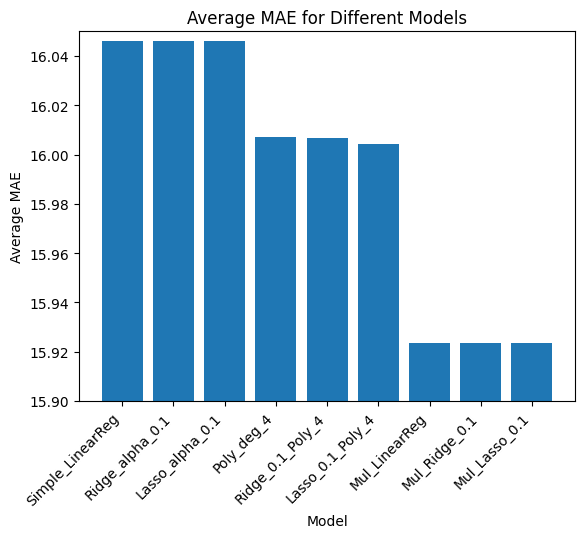

In [889]:
plt.bar(combined_avg['Models'],combined_avg['avg_MAE'])
plt.xticks(rotation=45, ha='right')
plt.xlabel('Model')
plt.ylabel('Average MAE')
plt.title('Average MAE for Different Models')
plt.ylim(15.9,16.05)
plt.show()

In [890]:
mean_avg = root_mean_sq_err[root_mean_sq_err['Companies'] == 'AVERAGE'].drop('Companies', axis=1)
mul_avg = mul_root_mean_sq_err[mul_root_mean_sq_err['Companies'] == 'AVERAGE'].drop('Companies', axis=1)

In [891]:
combined=pd.concat([mean_avg,mul_avg],axis=1)
combined_avg=combined.T
combined_avg.columns = ['avg_RMSE']
combined_avg['Models'] = ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
combined_avg

,avg_RMSE,Models
Simple_LinearReg,27.432896,Simple_LinearReg
Ridge_alpha_0.1,27.432896,Ridge_alpha_0.1
Lasso_alpha_0.1,27.432893,Lasso_alpha_0.1
Poly_deg_4,27.375061,Poly_deg_4
Ridge_0.1_Poly_4,27.373941,Ridge_0.1_Poly_4
Lasso_0.1_Poly_4,27.358279,Lasso_0.1_Poly_4
Mul_LinearReg,27.353043,Mul_LinearReg
Mul_Ridge_0.1,27.353043,Mul_Ridge_0.1
Mul_Lasso_0.1,27.353042,Mul_Lasso_0.1


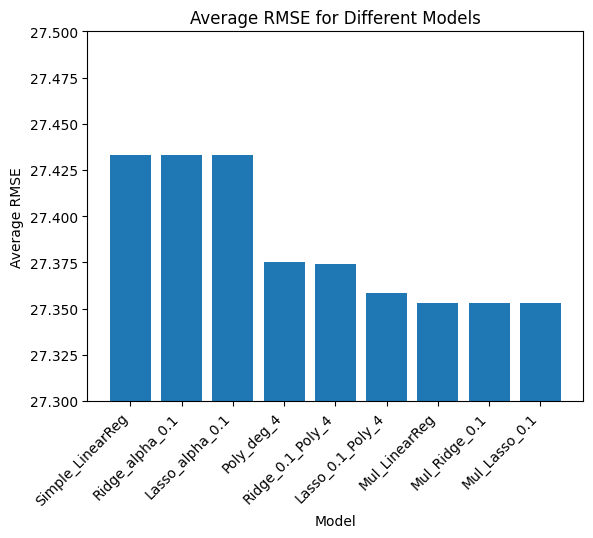

In [892]:
plt.bar(combined_avg['Models'],combined_avg['avg_RMSE'])
plt.xticks(rotation=45, ha='right')
plt.xlabel('Model')
plt.ylabel('Average RMSE')
plt.title('Average RMSE for Different Models')
plt.ylim(27.3,27.5)
plt.show()

In [893]:
mean_avg = R2_score[R2_score['Companies'] == 'AVERAGE'].drop('Companies', axis=1)
mul_avg = mul_R2_score[mul_R2_score['Companies'] == 'AVERAGE'].drop('Companies', axis=1)

In [894]:
combined=pd.concat([mean_avg,mul_avg],axis=1)
combined_avg=combined.T
combined_avg.columns = ['avg_R2']
combined_avg['Models'] = ['Simple_LinearReg', 'Ridge_alpha_0.1', 'Lasso_alpha_0.1', 'Poly_deg_4', 
        'Ridge_0.1_Poly_4', 'Lasso_0.1_Poly_4', 'Mul_LinearReg', 'Mul_Ridge_0.1', 
        'Mul_Lasso_0.1']
combined_avg

,avg_R2,Models
Simple_LinearReg,0.999215,Simple_LinearReg
Ridge_alpha_0.1,0.999215,Ridge_alpha_0.1
Lasso_alpha_0.1,0.999215,Lasso_alpha_0.1
Poly_deg_4,0.999217,Poly_deg_4
Ridge_0.1_Poly_4,0.999217,Ridge_0.1_Poly_4
Lasso_0.1_Poly_4,0.999218,Lasso_0.1_Poly_4
Mul_LinearReg,0.999222,Mul_LinearReg
Mul_Ridge_0.1,0.999222,Mul_Ridge_0.1
Mul_Lasso_0.1,0.999222,Mul_Lasso_0.1


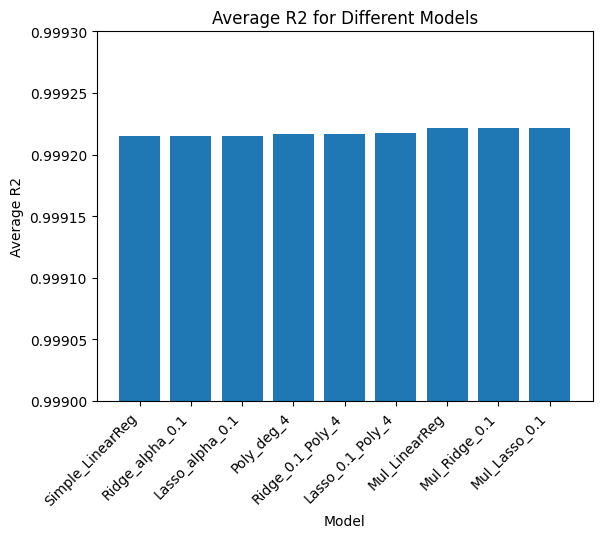

In [895]:
plt.bar(combined_avg['Models'],combined_avg['avg_R2'])
plt.xticks(rotation=45, ha='right')
plt.xlabel('Model')
plt.ylabel('Average R2')
plt.title('Average R2 for Different Models')
plt.ylim(0.999,0.9993)
plt.show()